**Note:** This notebook is intended for Google Colab. Mount Drive or otherwise make your graph files available before running.

In [ ]:
# Specific Role Analysis in Enhanced Knowledge Graph
# Author: Dr. M. Reza Hosseini
# Purpose: Analyze specific data/AI/automation roles in the enhanced knowledge graph

# =============================================================================
# 📦 STEP 1: Setup and Install Dependencies
# =============================================================================

# Install required fuzzy matching library
!pip install fuzzywuzzy python-levenshtein

import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict, Counter
import json
from fuzzywuzzy import fuzz, process
import warnings
warnings.filterwarnings('ignore')

print("🔍 SPECIFIC ROLE ANALYSIS IN ENHANCED KNOWLEDGE GRAPH")
print("="*60)

# Load the enhanced graph
enhanced_graph_path = '/content/drive/MyDrive/knowledge-graph-llms/graph_backups/enhanced_knowledge_graph_final.graphml'
G = nx.read_graphml(enhanced_graph_path)

print(f"✅ Enhanced graph loaded: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

# =============================================================================
# 🎯 STEP 2: Define Target Roles to Search
# =============================================================================

target_roles = [
    "Data Scientist",
    "Analytics Developer",
    "Analytics And Insights Manager",
    "Data Engineer",
    "Automation Manager",
    "Automation Technician",
    "Business Intelligence Developer",
    "Data Support Analyst",
    "Automation Systems Engineer",
    "Data Science Manager",
    "Artificial Intelligence Manager",
    "Group Manager Data And Iot",
    "Data Engineering Manager",
    "Director Of Data Management And Business Intelligence"
]

print(f"\n🎯 SEARCHING FOR {len(target_roles)} SPECIFIC ROLES:")
for i, role in enumerate(target_roles, 1):
    print(f"  {i:2d}. {role}")

# =============================================================================
# 🔍 STEP 3: Extract All Roles from Graph
# =============================================================================

def extract_all_roles(graph):
    """
    Extract all role nodes from the graph with their complete information
    """
    print(f"\n📊 EXTRACTING ALL ROLES FROM GRAPH...")

    all_roles = []

    for node, data in graph.nodes(data=True):
        labels = data.get('labels', '')
        if ':Role' in labels:
            role_info = {
                'node_id': node,
                'role_name': data.get('id', str(node)),
                'labels': labels,
                'degree': graph.degree(node),
                'in_degree': graph.in_degree(node) if graph.is_directed() else None,
                'out_degree': graph.out_degree(node) if graph.is_directed() else None,
                'all_attributes': dict(data)
            }
            all_roles.append(role_info)

    print(f"✅ Found {len(all_roles)} total roles in the graph")

    # Sort by degree (most connected first)
    all_roles.sort(key=lambda x: x['degree'], reverse=True)

    return all_roles

# Extract all roles
all_graph_roles = extract_all_roles(G)

# Display top 10 most connected roles for context
print(f"\n📋 TOP 10 MOST CONNECTED ROLES IN GRAPH:")
for i, role in enumerate(all_graph_roles[:10], 1):
    print(f"  {i:2d}. {role['role_name']} (degree: {role['degree']})")

# =============================================================================
# 🔍 STEP 4: Advanced Role Matching Functions
# =============================================================================

def find_exact_matches(target_roles, graph_roles):
    """
    Find exact matches between target roles and graph roles
    """
    exact_matches = []

    # Create a mapping of role names to role data
    role_name_map = {role['role_name']: role for role in graph_roles}

    for target_role in target_roles:
        if target_role in role_name_map:
            match_info = role_name_map[target_role].copy()
            match_info['target_role'] = target_role
            match_info['match_type'] = 'EXACT'
            match_info['similarity_score'] = 100.0
            exact_matches.append(match_info)

    return exact_matches

def find_fuzzy_matches(target_roles, graph_roles, threshold=80):
    """
    Find fuzzy matches using multiple similarity algorithms
    """
    fuzzy_matches = []

    # Extract just the role names for fuzzy matching
    graph_role_names = [role['role_name'] for role in graph_roles]
    role_name_map = {role['role_name']: role for role in graph_roles}

    for target_role in target_roles:
        # Use process.extractOne to find best match
        best_match = process.extractOne(target_role, graph_role_names, scorer=fuzz.token_sort_ratio)

        if best_match and best_match[1] >= threshold:
            match_name, similarity = best_match
            match_info = role_name_map[match_name].copy()
            match_info['target_role'] = target_role
            match_info['match_type'] = 'FUZZY'
            match_info['similarity_score'] = similarity

            # Calculate additional similarity metrics
            match_info['similarity_metrics'] = {
                'token_sort_ratio': fuzz.token_sort_ratio(target_role, match_name),
                'token_set_ratio': fuzz.token_set_ratio(target_role, match_name),
                'partial_ratio': fuzz.partial_ratio(target_role, match_name),
                'ratio': fuzz.ratio(target_role, match_name)
            }

            fuzzy_matches.append(match_info)

    return fuzzy_matches

def find_partial_matches(target_roles, graph_roles, min_words=2):
    """
    Find partial matches based on shared keywords
    """
    partial_matches = []

    for target_role in target_roles:
        target_words = set(target_role.lower().split())

        for graph_role in graph_roles:
            graph_words = set(graph_role['role_name'].lower().split())

            # Find common words
            common_words = target_words.intersection(graph_words)

            if len(common_words) >= min_words:
                match_info = graph_role.copy()
                match_info['target_role'] = target_role
                match_info['match_type'] = 'PARTIAL'
                match_info['common_words'] = list(common_words)
                match_info['common_word_count'] = len(common_words)
                match_info['similarity_score'] = (len(common_words) / max(len(target_words), len(graph_words))) * 100

                partial_matches.append(match_info)

    return partial_matches

# =============================================================================
# 🔍 STEP 5: Execute Comprehensive Role Search
# =============================================================================

def comprehensive_role_search(target_roles, graph_roles):
    """
    Execute comprehensive search using all matching methods
    """
    print(f"\n🔍 EXECUTING COMPREHENSIVE ROLE SEARCH...")

    # Find exact matches
    exact_matches = find_exact_matches(target_roles, graph_roles)
    print(f"✅ Exact matches found: {len(exact_matches)}")

    # Find fuzzy matches (excluding exact matches)
    exact_role_names = {match['role_name'] for match in exact_matches}
    remaining_graph_roles = [role for role in graph_roles if role['role_name'] not in exact_role_names]

    fuzzy_matches = find_fuzzy_matches(target_roles, remaining_graph_roles, threshold=70)
    print(f"✅ Fuzzy matches found: {len(fuzzy_matches)}")

    # Find partial matches (excluding exact and fuzzy matches)
    matched_role_names = exact_role_names.union({match['role_name'] for match in fuzzy_matches})
    remaining_for_partial = [role for role in graph_roles if role['role_name'] not in matched_role_names]

    partial_matches = find_partial_matches(target_roles, remaining_for_partial, min_words=2)
    print(f"✅ Partial matches found: {len(partial_matches)}")

    # Identify roles not found
    found_targets = set()
    for match_list in [exact_matches, fuzzy_matches, partial_matches]:
        found_targets.update(match['target_role'] for match in match_list)

    not_found = [role for role in target_roles if role not in found_targets]
    print(f"❌ Roles not found: {len(not_found)}")

    return {
        'exact_matches': exact_matches,
        'fuzzy_matches': fuzzy_matches,
        'partial_matches': partial_matches,
        'not_found': not_found,
        'summary': {
            'total_searched': len(target_roles),
            'exact_found': len(exact_matches),
            'fuzzy_found': len(fuzzy_matches),
            'partial_found': len(partial_matches),
            'not_found': len(not_found)
        }
    }

# Execute comprehensive search
search_results = comprehensive_role_search(target_roles, all_graph_roles)

# =============================================================================
# 📊 STEP 6: Analyze Found Roles Structure
# =============================================================================

def analyze_role_structure(role_info, graph):
    """
    Analyze the complete structure and connections of a specific role
    """
    node_id = role_info['node_id']

    # Get all connections
    incoming_edges = list(graph.in_edges(node_id, data=True))
    outgoing_edges = list(graph.out_edges(node_id, data=True))

    # Categorize connections
    connections = {
        'skills_required': [],
        'tools_used': [],
        'tasks_performed': [],
        'other_relationships': []
    }

    # Analyze outgoing edges (what this role connects to)
    for source, target, edge_data in outgoing_edges:
        target_labels = graph.nodes[target].get('labels', '')
        target_id = graph.nodes[target].get('id', str(target))
        relationship = edge_data.get('label', 'UNKNOWN')

        connection_info = {
            'target_id': target_id,
            'target_labels': target_labels,
            'relationship': relationship,
            'edge_data': edge_data
        }

        if relationship == 'REQUIRES_SKILL':
            connections['skills_required'].append(connection_info)
        elif relationship == 'USES_TOOL':
            connections['tools_used'].append(connection_info)
        elif relationship == 'PERFORMS_TASK':
            connections['tasks_performed'].append(connection_info)
        else:
            connections['other_relationships'].append(connection_info)

    # Analyze incoming edges (what connects to this role)
    incoming_connections = []
    for source, target, edge_data in incoming_edges:
        source_labels = graph.nodes[source].get('labels', '')
        source_id = graph.nodes[source].get('id', str(source))
        relationship = edge_data.get('label', 'UNKNOWN')

        incoming_connections.append({
            'source_id': source_id,
            'source_labels': source_labels,
            'relationship': relationship,
            'edge_data': edge_data
        })

    structure_analysis = {
        'role_info': role_info,
        'connections': connections,
        'incoming_connections': incoming_connections,
        'connection_summary': {
            'total_outgoing': len(outgoing_edges),
            'total_incoming': len(incoming_edges),
            'skills_count': len(connections['skills_required']),
            'tools_count': len(connections['tools_used']),
            'tasks_count': len(connections['tasks_performed']),
            'other_count': len(connections['other_relationships'])
        }
    }

    return structure_analysis

def analyze_all_found_roles(search_results, graph):
    """
    Analyze structure for all found roles
    """
    print(f"\n📊 ANALYZING STRUCTURE OF ALL FOUND ROLES...")

    all_analyses = {}

    # Analyze exact matches
    for match in search_results['exact_matches']:
        analysis = analyze_role_structure(match, graph)
        all_analyses[match['target_role']] = analysis

    # Analyze fuzzy matches
    for match in search_results['fuzzy_matches']:
        analysis = analyze_role_structure(match, graph)
        all_analyses[match['target_role']] = analysis

    # Analyze partial matches (just the first match for each target)
    processed_targets = set()
    for match in search_results['partial_matches']:
        if match['target_role'] not in processed_targets:
            analysis = analyze_role_structure(match, graph)
            all_analyses[match['target_role']] = analysis
            processed_targets.add(match['target_role'])

    return all_analyses

# Analyze structure of all found roles
role_analyses = analyze_all_found_roles(search_results, G)

# =============================================================================
# 📋 STEP 7: Generate Detailed Reports
# =============================================================================

def generate_detailed_reports(search_results, role_analyses):
    """
    Generate comprehensive reports for all findings
    """
    print(f"\n📋 GENERATING DETAILED REPORTS")
    print("="*50)

    # Summary Report
    print(f"\n🎯 SEARCH SUMMARY:")
    summary = search_results['summary']
    print(f"  Total roles searched: {summary['total_searched']}")
    print(f"  Exact matches: {summary['exact_found']}")
    print(f"  Fuzzy matches: {summary['fuzzy_found']}")
    print(f"  Partial matches: {summary['partial_found']}")
    print(f"  Not found: {summary['not_found']}")
    print(f"  Success rate: {((summary['exact_found'] + summary['fuzzy_found']) / summary['total_searched'] * 100):.1f}%")

    # Exact Matches Report
    if search_results['exact_matches']:
        print(f"\n✅ EXACT MATCHES FOUND ({len(search_results['exact_matches'])}):")
        for match in search_results['exact_matches']:
            analysis = role_analyses.get(match['target_role'])
            print(f"\n  🎯 {match['target_role']}")
            print(f"     Graph ID: {match['role_name']}")
            print(f"     Node: {match['node_id']}")
            print(f"     Total degree: {match['degree']}")
            if analysis:
                summary = analysis['connection_summary']
                print(f"     Skills required: {summary['skills_count']}")
                print(f"     Tools used: {summary['tools_count']}")
                print(f"     Tasks performed: {summary['tasks_count']}")

    # Fuzzy Matches Report
    if search_results['fuzzy_matches']:
        print(f"\n🔍 FUZZY MATCHES FOUND ({len(search_results['fuzzy_matches'])}):")
        for match in search_results['fuzzy_matches']:
            analysis = role_analyses.get(match['target_role'])
            print(f"\n  🎯 Target: {match['target_role']}")
            print(f"     Found: {match['role_name']}")
            print(f"     Similarity: {match['similarity_score']:.1f}%")
            print(f"     Node: {match['node_id']}")
            print(f"     Total degree: {match['degree']}")
            if analysis:
                summary = analysis['connection_summary']
                print(f"     Skills required: {summary['skills_count']}")
                print(f"     Tools used: {summary['tools_count']}")
                print(f"     Tasks performed: {summary['tasks_count']}")

    # Partial Matches Report
    if search_results['partial_matches']:
        print(f"\n🔶 PARTIAL MATCHES FOUND ({len(search_results['partial_matches'])}):")
        # Group by target role
        partial_by_target = defaultdict(list)
        for match in search_results['partial_matches']:
            partial_by_target[match['target_role']].append(match)

        for target_role, matches in partial_by_target.items():
            print(f"\n  🎯 Target: {target_role}")
            for match in matches[:3]:  # Show top 3 partial matches
                print(f"     Found: {match['role_name']}")
                print(f"     Common words: {match['common_words']}")
                print(f"     Similarity: {match['similarity_score']:.1f}%")

    # Not Found Report
    if search_results['not_found']:
        print(f"\n❌ ROLES NOT FOUND ({len(search_results['not_found'])}):")
        for role in search_results['not_found']:
            print(f"  • {role}")

    return True

# Generate detailed reports
generate_detailed_reports(search_results, role_analyses)

# =============================================================================
# 📊 STEP 8: Create Detailed Role Connection Analysis
# =============================================================================

def create_role_connection_analysis(role_analyses):
    """
    Create detailed analysis of role connections and competencies
    """
    print(f"\n📊 DETAILED ROLE CONNECTION ANALYSIS")
    print("="*50)

    for target_role, analysis in role_analyses.items():
        role_info = analysis['role_info']
        connections = analysis['connections']
        summary = analysis['connection_summary']

        print(f"\n🎯 {target_role.upper()}")
        print(f"   Graph Role: {role_info['role_name']}")
        print(f"   Match Type: {role_info['match_type']}")
        if 'similarity_score' in role_info:
            print(f"   Similarity: {role_info['similarity_score']:.1f}%")
        print(f"   Total Connections: {summary['total_outgoing']}")

        # Skills Analysis
        if connections['skills_required']:
            print(f"\n   📚 REQUIRED SKILLS ({len(connections['skills_required'])}):")
            # Categorize skills
            technical_skills = []
            soft_skills = []

            for skill in connections['skills_required']:
                if ':Technical skill' in skill['target_labels']:
                    technical_skills.append(skill['target_id'])
                elif ':Soft skill' in skill['target_labels']:
                    soft_skills.append(skill['target_id'])

            if technical_skills:
                print(f"     Technical Skills ({len(technical_skills)}):")
                for skill in technical_skills[:10]:  # Show top 10
                    print(f"       • {skill}")
                if len(technical_skills) > 10:
                    print(f"       ... and {len(technical_skills) - 10} more")

            if soft_skills:
                print(f"     Soft Skills ({len(soft_skills)}):")
                for skill in soft_skills[:5]:  # Show top 5
                    print(f"       • {skill}")
                if len(soft_skills) > 5:
                    print(f"       ... and {len(soft_skills) - 5} more")

        # Tools Analysis
        if connections['tools_used']:
            print(f"\n   🛠️ TOOLS USED ({len(connections['tools_used'])}):")
            tools = [tool['target_id'] for tool in connections['tools_used']]
            for tool in tools[:10]:  # Show top 10
                print(f"       • {tool}")
            if len(tools) > 10:
                print(f"       ... and {len(tools) - 10} more")

        # Tasks Analysis
        if connections['tasks_performed']:
            print(f"\n   📋 TASKS PERFORMED ({len(connections['tasks_performed'])}):")
            tasks = [task['target_id'] for task in connections['tasks_performed']]
            for task in tasks[:8]:  # Show top 8
                print(f"       • {task}")
            if len(tasks) > 8:
                print(f"       ... and {len(tasks) - 8} more")

        print(f"   {'-' * 60}")

# Create detailed connection analysis
create_role_connection_analysis(role_analyses)

# =============================================================================
# 💾 STEP 9: Save Analysis Results
# =============================================================================

def save_role_analysis_results(search_results, role_analyses, target_roles):
    """
    Save all analysis results to files
    """
    print(f"\n💾 SAVING ROLE ANALYSIS RESULTS")
    print("-" * 40)

    # Create analysis directory
    analysis_dir = '/content/drive/MyDrive/knowledge-graph-llms/role_analysis'
    os.makedirs(analysis_dir, exist_ok=True)

    from datetime import datetime
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    # Prepare comprehensive results
    comprehensive_results = {
        'metadata': {
            'timestamp': datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
            'target_roles': target_roles,
            'graph_file': 'enhanced_knowledge_graph_final.graphml',
            'analysis_type': 'Specific Role Search and Structure Analysis'
        },
        'search_results': search_results,
        'role_analyses': role_analyses,
        'summary_statistics': {
            'total_roles_in_graph': len(all_graph_roles),
            'target_roles_searched': len(target_roles),
            'exact_matches': len(search_results['exact_matches']),
            'fuzzy_matches': len(search_results['fuzzy_matches']),
            'partial_matches': len(search_results['partial_matches']),
            'not_found': len(search_results['not_found']),
            'success_rate': ((len(search_results['exact_matches']) + len(search_results['fuzzy_matches'])) / len(target_roles)) * 100
        }
    }

    # Save comprehensive JSON report
    json_path = os.path.join(analysis_dir, f'role_analysis_report_{timestamp}.json')
    with open(json_path, 'w') as f:
        json.dump(comprehensive_results, f, indent=2, default=str)
    print(f"✅ Comprehensive report saved: {os.path.basename(json_path)}")

    # Save detailed CSV of found roles
    found_roles_data = []

    for match_type, matches in [('exact', search_results['exact_matches']),
                               ('fuzzy', search_results['fuzzy_matches'])]:
        for match in matches:
            analysis = role_analyses.get(match['target_role'], {})
            summary = analysis.get('connection_summary', {})

            found_roles_data.append({
                'target_role': match['target_role'],
                'found_role': match['role_name'],
                'match_type': match_type,
                'similarity_score': match.get('similarity_score', 100),
                'node_id': match['node_id'],
                'total_degree': match['degree'],
                'skills_required': summary.get('skills_count', 0),
                'tools_used': summary.get('tools_count', 0),
                'tasks_performed': summary.get('tasks_count', 0),
                'other_connections': summary.get('other_count', 0)
            })

    if found_roles_data:
        csv_path = os.path.join(analysis_dir, f'found_roles_summary_{timestamp}.csv')
        pd.DataFrame(found_roles_data).to_csv(csv_path, index=False)
        print(f"✅ Found roles CSV saved: {os.path.basename(csv_path)}")

    # Save current analysis reference
    current_path = os.path.join(analysis_dir, 'current_role_analysis.json')
    with open(current_path, 'w') as f:
        json.dump(comprehensive_results, f, indent=2, default=str)
    print(f"✅ Current analysis reference saved: current_role_analysis.json")

    return {
        'json_report': json_path,
        'csv_summary': csv_path if found_roles_data else None,
        'current_reference': current_path
    }

# Save all results
import os
saved_files = save_role_analysis_results(search_results, role_analyses, target_roles)

# =============================================================================
# 🎯 STEP 10: Final Summary and Recommendations
# =============================================================================

def generate_final_summary_and_recommendations(search_results, role_analyses, saved_files):
    """
    Generate final summary and recommendations
    """
    print(f"\n" + "="*60)
    print(f"🎯 ROLE ANALYSIS COMPLETE - FINAL SUMMARY")
    print(f"="*60)

    summary = search_results['summary']

    print(f"\n📊 SEARCH RESULTS OVERVIEW:")
    print(f"  Target roles searched: {summary['total_searched']}")
    print(f"  Successfully found: {summary['exact_found'] + summary['fuzzy_found']}")
    print(f"  Success rate: {((summary['exact_found'] + summary['fuzzy_found']) / summary['total_searched'] * 100):.1f}%")

    print(f"\n✅ EXACT MATCHES: {summary['exact_found']}")
    if search_results['exact_matches']:
        for match in search_results['exact_matches']:
            print(f"  • {match['target_role']}")

    print(f"\n🔍 FUZZY MATCHES: {summary['fuzzy_found']}")
    if search_results['fuzzy_matches']:
        for match in search_results['fuzzy_matches']:
            print(f"  • {match['target_role']} → {match['role_name']} ({match['similarity_score']:.1f}%)")

    print(f"\n❌ NOT FOUND: {summary['not_found']}")
    if search_results['not_found']:
        for role in search_results['not_found']:
            print(f"  • {role}")

    print(f"\n📁 FILES CREATED:")
    for file_type, path in saved_files.items():
        if path:
            print(f"  • {file_type}: {os.path.basename(path)}")

    print(f"\n💡 RESEARCH INSIGHTS:")
    if role_analyses:
        total_skills = sum(analysis['connection_summary']['skills_count'] for analysis in role_analyses.values())
        total_tools = sum(analysis['connection_summary']['tools_count'] for analysis in role_analyses.values())
        total_tasks = sum(analysis['connection_summary']['tasks_count'] for analysis in role_analyses.values())
        avg_connections = np.mean([analysis['connection_summary']['total_outgoing'] for analysis in role_analyses.values()])

        print(f"  • Found roles have an average of {avg_connections:.1f} connections")
        print(f"  • Total skills across found roles: {total_skills}")
        print(f"  • Total tools across found roles: {total_tools}")
        print(f"  • Total tasks across found roles: {total_tasks}")

    print(f"\n🚀 NEXT STEPS:")
    print(f"  1. Review detailed analysis in: current_role_analysis.json")
    print(f"  2. Examine role connections and competency requirements")
    print(f"  3. Use findings for skills gap analysis in data/AI roles")
    print(f"  4. Compare role structures for research insights")

    print(f"\n🎉 Analysis complete! Your target roles have been comprehensively analyzed.")

# Generate final summary
generate_final_summary_and_recommendations(search_results, role_analyses, saved_files)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.7/161.7 kB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 46.5 MB/s eta 0:00:00
🔍 SPECIFIC ROLE ANALYSIS IN ENHANCED KNOWLEDGE GRAPH
✅ Enhanced graph loaded: 1304 nodes, 2118 edges

🎯 SEARCHING FOR 14 SPECIFIC ROLES:
   1. Data Scientist
   2. Analytics Developer
   3. Analytics And Insights Manager
   4. Data Engineer
   5. Automation Manager
   6. Automation Technician
   7. Business Intelligence Developer
   8. Data Support Analyst
   9. Automation Systems Engineer
  10. Data Science Manager
  11. Artificial Intelligence Manager
  12. Group Manager Data And Iot
  13. Data Engineering Manager
  14. Director Of Data Management And Business Intelligence

📊 EXTRACTING ALL ROLES FROM GRAPH...
✅ Found 126 total roles in the graph

📋 TOP 10 MOST CONNECTED ROLES IN GRAPH:
   1. Data Scientist (degree: 83)
   2. Data Engineer (degree: 70)
   3. Project Engineer (degree: 60)
   4. Electrician (degree: 55)
   5. Autom

ACADEMIC JOURNAL FIGURE: AI/DATA ROLES NETWORK
Enhanced graph loaded: 1304 nodes, 2118 edges
Found 14 target role nodes
Found 17 major connecting nodes
Creating REVISED academic network visualization...
Computing condensed network layout...
High-resolution PDF saved:
Timestamped version: ai_data_roles_network_20250709_011247.pdf
Current reference: ai_roles_network_final.pdf
Resolution: 600 DPI (maximum quality)
REVISED FIGURE CAPTION:
Figure X. Network of AI and Data Roles in Construction. 
The network displays the 14 identified AI and data-related roles (blue nodes) 
and their connections through shared core competencies (grey nodes). 
Node size represents the breadth of competencies required for each role, 
with larger nodes indicating roles requiring more diverse skill sets. 
The visualization reveals the interconnected nature of emerging AI/data roles 
in construction and highlights both specialized requirements and shared 
foundational competencies across the domain.
Figure captio

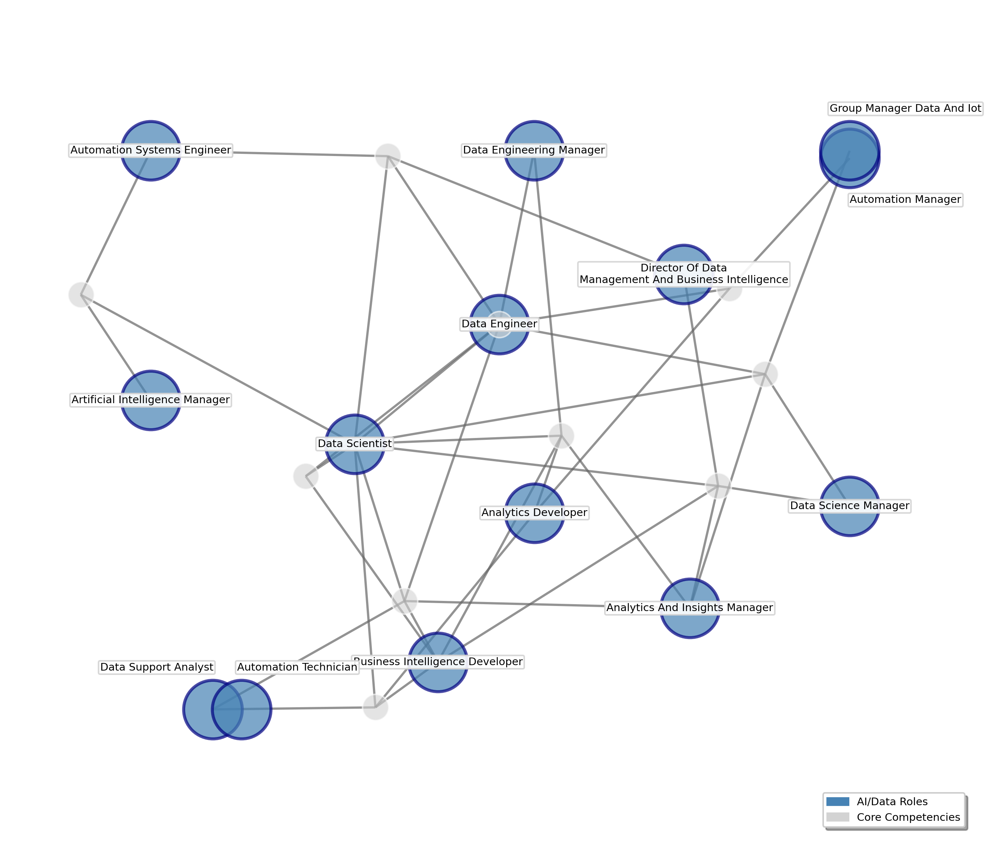

REVISED ACADEMIC FIGURE COMPLETE!
Publication-ready network visualization created
Maximum resolution PDF (600 DPI) exported
Full role names displayed prominently
Condensed layout with focus on 14 AI roles
Single color scheme highlighting AI roles
PDF saved as: ai_roles_network_final.pdf


In [ ]:
# Academic Publication: AI/Data Roles Network Visualization
# Author: Dr. M. Reza Hosseini
# Purpose: Create publication-quality network visualization of AI/Data roles in construction

import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.patches import FancyBboxPatch
import seaborn as sns
from collections import defaultdict, Counter
import warnings
warnings.filterwarnings('ignore')

# Set academic publication style
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Calibri', 'DejaVu Sans'],
    'font.size': 10,
    'axes.titlesize': 12,
    'axes.labelsize': 10,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 8,
    'figure.titlesize': 14,
    'text.usetex': False,
    'figure.figsize': (12, 9),
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight'
})

print("ACADEMIC JOURNAL FIGURE: AI/DATA ROLES NETWORK")
print("=" * 55)

# Load the enhanced graph
enhanced_graph_path = '/content/drive/MyDrive/knowledge-graph-llms/graph_backups/enhanced_knowledge_graph_final.graphml'
G = nx.read_graphml(enhanced_graph_path)

print("Enhanced graph loaded:", G.number_of_nodes(), "nodes,", G.number_of_edges(), "edges")

# Define the 14 target roles
target_roles = [
    "Data Scientist",
    "Analytics Developer",
    "Analytics And Insights Manager",
    "Data Engineer",
    "Automation Manager",
    "Automation Technician",
    "Business Intelligence Developer",
    "Data Support Analyst",
    "Automation Systems Engineer",
    "Data Science Manager",
    "Artificial Intelligence Manager",
    "Group Manager Data And Iot",
    "Data Engineering Manager",
    "Director Of Data Management And Business Intelligence"
]

def find_role_nodes(graph, target_roles):
    """Find the actual nodes for target roles"""
    role_nodes = {}

    for node, data in graph.nodes(data=True):
        role_name = data.get('id', '')
        if role_name in target_roles:
            role_nodes[role_name] = {
                'node': node,
                'data': data,
                'degree': graph.degree(node)
            }

    print("Found", len(role_nodes), "target role nodes")
    return role_nodes

def analyze_role_connections(graph, role_nodes):
    """Analyze connections between roles and to major skills/tools"""

    target_node_ids = [info['node'] for info in role_nodes.values()]

    shared_connections = defaultdict(list)
    major_connections = defaultdict(int)

    for role_name, role_info in role_nodes.items():
        node = role_info['node']
        neighbors = list(graph.neighbors(node))

        for neighbor in neighbors:
            neighbor_data = graph.nodes[neighbor]
            neighbor_id = neighbor_data.get('id', str(neighbor))
            neighbor_labels = neighbor_data.get('labels', '')

            major_connections[neighbor] += 1
            shared_connections[neighbor].append(role_name)

    major_nodes = {}
    for neighbor, count in major_connections.items():
        neighbor_data = graph.nodes[neighbor]
        neighbor_degree = graph.degree(neighbor)

        if count >= 3 or neighbor_degree >= 20:
            major_nodes[neighbor] = {
                'id': neighbor_data.get('id', str(neighbor)),
                'labels': neighbor_data.get('labels', ''),
                'degree': neighbor_degree,
                'connections_to_targets': count,
                'connected_roles': shared_connections[neighbor]
            }

    print("Found", len(major_nodes), "major connecting nodes")
    return major_nodes

def create_academic_network_figure(role_nodes, major_connections, original_graph):
    """Create publication-quality network visualization"""

    viz_graph = nx.Graph()

    # UPDATED: Transparent blue for AI roles, light grey for supporting nodes
    ai_role_color = '#4682B4'  # Steel blue for AI roles
    other_node_color = '#D3D3D3'  # Light grey for supporting nodes

    def get_node_size(degree, node_type='role'):
        if node_type == 'ai_role':
            return 1500  # Much larger for AI roles
        else:
            return 300   # Smaller for supporting nodes

    # Add target role nodes
    node_labels = {}

    for role_name, role_info in role_nodes.items():
        node_id = role_info['node']
        viz_graph.add_node(node_id)
        node_labels[node_id] = role_name

    # Add major connection nodes
    connection_nodes = []

    sorted_connections = sorted(
        major_connections.items(),
        key=lambda x: x[1]['connections_to_targets'] * x[1]['degree'],
        reverse=True
    )[:10]  # Top 10 for condensed layout

    for conn_node, conn_info in sorted_connections:
        viz_graph.add_node(conn_node)
        connection_nodes.append(conn_node)
        # REMOVED: No labels for connection nodes

    # Add edges from original graph
    for role_name, role_info in role_nodes.items():
        role_node = role_info['node']

        for conn_node in connection_nodes:
            if original_graph.has_edge(role_node, conn_node):
                viz_graph.add_edge(role_node, conn_node)

    # Add edges between roles if they share significant connections
    role_node_ids = [info['node'] for info in role_nodes.values()]
    for i, role1 in enumerate(role_node_ids):
        for role2 in role_node_ids[i+1:]:
            shared_neighbors = set(original_graph.neighbors(role1)) & set(original_graph.neighbors(role2))
            if len(shared_neighbors) >= 8:
                viz_graph.add_edge(role1, role2)

    print("Computing condensed network layout...")

    # Use spring layout with tighter clustering and better separation
    pos = nx.spring_layout(
        viz_graph,
        k=2.0,              # Increased from 1.5 for better separation
        iterations=200,     # More iterations for better positioning
        seed=42
    )

    # Advanced position adjustment to prevent overlap and ensure A4 margins
    adjusted_pos = {}
    role_node_ids = [info['node'] for info in role_nodes.values()]

    # First pass: identify nodes that need repositioning
    min_distance = 0.25  # Minimum distance between role nodes

    for i, (node, (x, y)) in enumerate(pos.items()):
        if node in role_node_ids:
            # Much tighter bounds for A4 paper - leave more margin space
            adjusted_x = max(-0.5, min(0.5, x))  # Very tight bounds
            adjusted_y = max(-0.4, min(0.4, y))  # Very tight bounds

            # Check for overlap with previously placed nodes
            overlap_found = True
            attempts = 0
            while overlap_found and attempts < 10:
                overlap_found = False
                for other_node, (other_x, other_y) in adjusted_pos.items():
                    if other_node in role_node_ids:
                        distance = ((adjusted_x - other_x)**2 + (adjusted_y - other_y)**2)**0.5
                        if distance < min_distance:
                            # Adjust position to avoid overlap
                            angle = attempts * 0.6  # Rotate around to find space
                            adjusted_x = max(-0.5, min(0.5, x + 0.1 * np.cos(angle)))
                            adjusted_y = max(-0.4, min(0.4, y + 0.1 * np.sin(angle)))
                            overlap_found = True
                            break
                attempts += 1

            adjusted_pos[node] = (adjusted_x, adjusted_y)
        else:
            # Supporting nodes can be positioned more freely but still within bounds
            adjusted_pos[node] = (max(-0.6, min(0.6, x)), max(-0.5, min(0.5, y)))

    # Create figure
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    ax.set_aspect('equal')

    # UPDATED: Draw edges with more visibility and thickness using adjusted positions
    nx.draw_networkx_edges(
        viz_graph, adjusted_pos,   # Use adjusted positions
        edge_color='#666666',      # Darker grey for better visibility
        width=1.5,                 # Thicker edges
        alpha=0.7,                 # More visible
        ax=ax
    )

    # UPDATED: Draw AI role nodes in transparent blue
    role_nodes_to_draw = [info['node'] for info in role_nodes.values()]

    nx.draw_networkx_nodes(
        viz_graph, adjusted_pos,   # Use adjusted positions
        nodelist=role_nodes_to_draw,
        node_color=ai_role_color,  # Transparent blue color
        node_size=1500,
        alpha=0.7,                 # Transparency for blue nodes
        linewidths=2,
        edgecolors='navy',         # Darker blue border
        ax=ax
    )

    # Draw connection nodes (no labels) using adjusted positions
    nx.draw_networkx_nodes(
        viz_graph, adjusted_pos,   # Use adjusted positions
        nodelist=connection_nodes,
        node_color=other_node_color,
        node_size=300,
        alpha=0.6,
        linewidths=1,
        edgecolors='white',
        ax=ax
    )

    # UPDATED: Add labels with smart positioning to avoid overlap
    role_labels = {}
    label_positions = {}

    for role_name, role_info in role_nodes.items():
        node = role_info['node']
        # Shorten very long role names for better fit
        if len(role_name) > 35:
            # Split long names into two lines
            words = role_name.split()
            mid_point = len(words) // 2
            line1 = ' '.join(words[:mid_point])
            line2 = ' '.join(words[mid_point:])
            role_labels[node] = f"{line1}\n{line2}"
        else:
            role_labels[node] = role_name

    # Create adjusted label positions to avoid overlap
    for node in role_labels.keys():
        base_x, base_y = adjusted_pos[node]

        # Check for very close nodes and offset labels accordingly
        offset_x, offset_y = 0, 0

        for other_node in role_labels.keys():
            if node != other_node:
                other_x, other_y = adjusted_pos[other_node]
                distance = ((base_x - other_x)**2 + (base_y - other_y)**2)**0.5

                # If nodes are very close (overlapping), offset the labels
                if distance < 0.15:  # Very close threshold
                    # Determine offset direction based on relative position
                    if base_x >= other_x:
                        offset_x = 0.08  # Move label right
                    else:
                        offset_x = -0.08  # Move label left

                    if base_y >= other_y:
                        offset_y = 0.06  # Move label up
                    else:
                        offset_y = -0.06  # Move label down

                    break  # Only adjust for the first close neighbor found

        # Apply the offset to label position
        label_positions[node] = (base_x + offset_x, base_y + offset_y)

    nx.draw_networkx_labels(
        viz_graph, label_positions,  # Use offset label positions
        labels=role_labels,
        font_size=7,
        font_weight='normal',
        font_family='sans-serif',  # Calibri
        font_color='black',
        ax=ax,
        bbox=dict(boxstyle="round,pad=0.15", facecolor="white", alpha=0.9, edgecolor="lightgray")  # Better background
    )

    # REMOVED: No labels for connection nodes

    # UPDATED: Smaller legend positioned at bottom right
    legend_elements = [
        mpatches.Patch(color=ai_role_color, label='AI/Data Roles'),
        mpatches.Patch(color=other_node_color, label='Core Competencies')
    ]

    ax.legend(
        handles=legend_elements,
        loc='lower right',          # Changed to bottom right
        bbox_to_anchor=(0.98, 0.02), # Bottom right corner
        frameon=True,
        fancybox=True,
        shadow=True,
        fontsize=7                  # Further reduced font size
    )

    # REMOVED: No title

    # Set very tight plot limits to ensure everything fits within A4 paper margins
    ax.set_xlim(-0.7, 0.7)
    ax.set_ylim(-0.6, 0.6)

    # Remove axes
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

    plt.tight_layout()

    return fig, viz_graph, pos

def save_academic_figure(fig, viz_graph):
    """Save figure as high-resolution PDF only"""

    import os
    from datetime import datetime

    figures_dir = '/content/drive/MyDrive/knowledge-graph-llms/academic_figures'
    os.makedirs(figures_dir, exist_ok=True)

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    base_filename = f'ai_data_roles_network_{timestamp}'

    pdf_path = os.path.join(figures_dir, f'{base_filename}.pdf')
    fig.savefig(pdf_path,
                format='pdf',
                dpi=600,
                bbox_inches='tight',
                facecolor='white',
                edgecolor='none',
                transparent=False)

    current_pdf = os.path.join(figures_dir, 'ai_roles_network_final.pdf')
    fig.savefig(current_pdf,
                format='pdf',
                dpi=600,
                bbox_inches='tight',
                facecolor='white',
                edgecolor='none',
                transparent=False)

    print("High-resolution PDF saved:")
    print("Timestamped version:", base_filename + ".pdf")
    print("Current reference: ai_roles_network_final.pdf")
    print("Resolution: 600 DPI (maximum quality)")

    generate_figure_caption(viz_graph)

    return {
        'pdf': pdf_path,
        'current_pdf': current_pdf
    }

def generate_figure_caption(viz_graph):
    """Generate academic figure caption"""

    caption = """
Figure X. Network of AI and Data Roles in Construction.
The network displays the 14 identified AI and data-related roles (blue nodes)
and their connections through shared core competencies (grey nodes).
Node size represents the breadth of competencies required for each role,
with larger nodes indicating roles requiring more diverse skill sets.
The visualization reveals the interconnected nature of emerging AI/data roles
in construction and highlights both specialized requirements and shared
foundational competencies across the domain.
"""

    print("REVISED FIGURE CAPTION:")
    print(caption.strip())

    figures_dir = '/content/drive/MyDrive/knowledge-graph-llms/academic_figures'
    caption_path = os.path.join(figures_dir, 'figure_caption.txt')
    with open(caption_path, 'w') as f:
        f.write(caption.strip())

    print("Figure caption saved: figure_caption.txt")

def generate_network_statistics(viz_graph, role_nodes, major_connections):
    """Generate network statistics for academic reporting"""

    print("NETWORK STATISTICS FOR ACADEMIC REPORTING")
    print("=" * 50)

    role_node_ids = [info['node'] for info in role_nodes.values()]

    stats = {
        'total_nodes': viz_graph.number_of_nodes(),
        'total_edges': viz_graph.number_of_edges(),
        'ai_role_nodes': len(role_node_ids),
        'competency_nodes': len(major_connections),
        'network_density': nx.density(viz_graph),
        'average_degree': sum(dict(viz_graph.degree()).values()) / viz_graph.number_of_nodes(),
    }

    print("Network Composition:")
    print("Total nodes:", stats['total_nodes'])
    print("AI/Data role nodes:", stats['ai_role_nodes'])
    print("Core competency nodes:", stats['competency_nodes'])
    print("Total connections:", stats['total_edges'])
    print("Network density:", f"{stats['network_density']:.4f}")
    print("Average degree:", f"{stats['average_degree']:.2f}")

    return stats

# Extract role nodes and analyze connections
role_nodes = find_role_nodes(G, target_roles)
major_connections = analyze_role_connections(G, role_nodes)

# Create the academic figure
print("Creating REVISED academic network visualization...")
fig, viz_graph, pos = create_academic_network_figure(role_nodes, major_connections, G)

# Save the academic figure
saved_files = save_academic_figure(fig, viz_graph)

# Generate statistics
network_stats = generate_network_statistics(viz_graph, role_nodes, major_connections)

plt.show()

print("REVISED ACADEMIC FIGURE COMPLETE!")
print("Publication-ready network visualization created")
print("Maximum resolution PDF (600 DPI) exported")
print("Full role names displayed prominently")
print("Condensed layout with focus on 14 AI roles")
print("Single color scheme highlighting AI roles")
print("PDF saved as: ai_roles_network_final.pdf")

In [ ]:
# Network Metrics Calculation for AI Roles Analysis
# Author: Dr. M. Reza Hosseini
# Purpose: Calculate comprehensive network metrics for the 14 AI roles visualization

import networkx as nx
import numpy as np
import pandas as pd
from collections import defaultdict

print("NETWORK METRICS CALCULATION FOR AI ROLES")
print("=" * 50)

# Load the enhanced graph (assuming this is already loaded from previous analysis)
enhanced_graph_path = '/content/drive/MyDrive/knowledge-graph-llms/graph_backups/enhanced_knowledge_graph_final.graphml'
G = nx.read_graphml(enhanced_graph_path)

# Define the 14 target roles
target_roles = [
    "Data Scientist",
    "Analytics Developer",
    "Analytics And Insights Manager",
    "Data Engineer",
    "Automation Manager",
    "Automation Technician",
    "Business Intelligence Developer",
    "Data Support Analyst",
    "Automation Systems Engineer",
    "Data Science Manager",
    "Artificial Intelligence Manager",
    "Group Manager Data And Iot",
    "Data Engineering Manager",
    "Director Of Data Management And Business Intelligence"
]

def find_role_nodes(graph, target_roles):
    """Find the actual nodes for target roles"""
    role_nodes = {}

    for node, data in graph.nodes(data=True):
        role_name = data.get('id', '')
        if role_name in target_roles:
            role_nodes[role_name] = {
                'node': node,
                'data': data,
                'degree': graph.degree(node)
            }

    return role_nodes

def create_visualization_subgraph(graph, role_nodes):
    """Create the same subgraph used in visualization"""
    viz_graph = nx.Graph()

    # Add role nodes
    for role_name, role_info in role_nodes.items():
        viz_graph.add_node(role_info['node'])

    # Find major connections (same logic as visualization)
    shared_connections = defaultdict(list)
    major_connections = defaultdict(int)

    for role_name, role_info in role_nodes.items():
        node = role_info['node']
        neighbors = list(graph.neighbors(node))

        for neighbor in neighbors:
            major_connections[neighbor] += 1
            shared_connections[neighbor].append(role_name)

    # Select top connections (same as visualization: >= 3 connections or high degree)
    connection_nodes = []
    for neighbor, count in major_connections.items():
        neighbor_degree = graph.degree(neighbor)
        if count >= 3 or neighbor_degree >= 20:
            connection_nodes.append(neighbor)
            viz_graph.add_node(neighbor)

    # Add edges (same logic as visualization)
    for role_name, role_info in role_nodes.items():
        role_node = role_info['node']
        for conn_node in connection_nodes:
            if graph.has_edge(role_node, conn_node):
                viz_graph.add_edge(role_node, conn_node)

    # Add edges between roles (same logic: 8+ shared neighbors)
    role_node_ids = [info['node'] for info in role_nodes.values()]
    for i, role1 in enumerate(role_node_ids):
        for role2 in role_node_ids[i+1:]:
            shared_neighbors = set(graph.neighbors(role1)) & set(graph.neighbors(role2))
            if len(shared_neighbors) >= 8:
                viz_graph.add_edge(role1, role2)

    return viz_graph, connection_nodes

def calculate_network_metrics(viz_graph, role_nodes, connection_nodes, original_graph):
    """Calculate comprehensive network metrics for AI roles analysis"""

    print("CALCULATING NETWORK METRICS...")
    print("-" * 30)

    # Basic network properties
    num_nodes = viz_graph.number_of_nodes()
    num_edges = viz_graph.number_of_edges()
    density = nx.density(viz_graph)

    # Degree analysis
    degrees = dict(viz_graph.degree())
    avg_degree = np.mean(list(degrees.values()))

    print(f"BASIC NETWORK PROPERTIES:")
    print(f"Total nodes: {num_nodes}")
    print(f"Total edges: {num_edges}")
    print(f"AI role nodes: {len(role_nodes)}")
    print(f"Competency nodes: {len(connection_nodes)}")
    print(f"Network density: {density:.4f}")
    print(f"Average degree: {avg_degree:.2f}")

    # Clustering coefficient
    clustering = nx.clustering(viz_graph)
    avg_clustering = np.mean(list(clustering.values()))

    print(f"\nCLUSTERING ANALYSIS:")
    print(f"Average clustering coefficient: {avg_clustering:.4f}")

    # Path length analysis
    if nx.is_connected(viz_graph):
        avg_path_length = nx.average_shortest_path_length(viz_graph)
        print(f"Average shortest path length: {avg_path_length:.2f}")
    else:
        components = list(nx.connected_components(viz_graph))
        largest_cc = max(components, key=len)
        subgraph = viz_graph.subgraph(largest_cc)
        avg_path_length = nx.average_shortest_path_length(subgraph)
        print(f"Network is disconnected ({len(components)} components)")
        print(f"Average path length (largest component): {avg_path_length:.2f}")

    # Centrality measures
    degree_centrality = nx.degree_centrality(viz_graph)
    betweenness_centrality = nx.betweenness_centrality(viz_graph)

    print(f"\nCENTRALITY ANALYSIS:")
    print(f"Top 5 nodes by degree centrality:")
    sorted_degree_cent = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)
    for i, (node, centrality) in enumerate(sorted_degree_cent[:5]):
        # Get role name if it's a role node
        role_name = None
        for r_name, r_info in role_nodes.items():
            if r_info['node'] == node:
                role_name = r_name
                break
        display_name = role_name if role_name else f"Competency_{str(node)[:10]}"
        print(f"  {i+1}. {display_name}: {centrality:.4f}")

    print(f"\nTop 5 nodes by betweenness centrality:")
    sorted_between_cent = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)
    for i, (node, centrality) in enumerate(sorted_between_cent[:5]):
        # Get role name if it's a role node
        role_name = None
        for r_name, r_info in role_nodes.items():
            if r_info['node'] == node:
                role_name = r_name
                break
        display_name = role_name if role_name else f"Competency_{str(node)[:10]}"
        print(f"  {i+1}. {display_name}: {centrality:.4f}")

    # Connected components
    num_components = nx.number_connected_components(viz_graph)
    print(f"\nCONNECTIVITY:")
    print(f"Connected components: {num_components}")
    print(f"Is fully connected: {nx.is_connected(viz_graph)}")

    # Role-specific degree analysis from original graph
    print(f"\nROLE CONNECTIVITY IN ORIGINAL GRAPH:")
    role_degrees = {}
    for role_name, role_info in role_nodes.items():
        node = role_info['node']
        degree = original_graph.degree(node)
        role_degrees[role_name] = degree

    # Sort by degree
    sorted_roles = sorted(role_degrees.items(), key=lambda x: x[1], reverse=True)
    for role, degree in sorted_roles:
        print(f"  {role}: {degree} connections")

    # Create summary metrics dictionary
    metrics = {
        'basic_properties': {
            'nodes': num_nodes,
            'edges': num_edges,
            'ai_roles': len(role_nodes),
            'competencies': len(connection_nodes),
            'density': density,
            'average_degree': avg_degree
        },
        'clustering': {
            'average_clustering_coefficient': avg_clustering
        },
        'path_analysis': {
            'average_path_length': avg_path_length if nx.is_connected(viz_graph) else avg_path_length,
            'is_connected': nx.is_connected(viz_graph)
        },
        'centrality': {
            'degree_centrality': degree_centrality,
            'betweenness_centrality': betweenness_centrality
        },
        'connectivity': {
            'connected_components': num_components
        },
        'role_degrees_original': role_degrees
    }

    return metrics

# Execute the analysis
print("Extracting role nodes...")
role_nodes = find_role_nodes(G, target_roles)

print(f"Found {len(role_nodes)} role nodes")

print("\nCreating visualization subgraph...")
viz_graph, connection_nodes = create_visualization_subgraph(G, role_nodes)

print(f"Visualization graph: {viz_graph.number_of_nodes()} nodes, {viz_graph.number_of_edges()} edges")

print("\nCalculating comprehensive metrics...")
metrics = calculate_network_metrics(viz_graph, role_nodes, connection_nodes, G)

# Save metrics to file
import json
import os
from datetime import datetime

# Create analysis directory
analysis_dir = '/content/drive/MyDrive/knowledge-graph-llms/network_metrics'
os.makedirs(analysis_dir, exist_ok=True)

# Save metrics
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
metrics_path = os.path.join(analysis_dir, f'network_metrics_{timestamp}.json')
with open(metrics_path, 'w') as f:
    json.dump(metrics, f, indent=2, default=str)

# Also save current metrics
current_metrics_path = os.path.join(analysis_dir, 'current_network_metrics.json')
with open(current_metrics_path, 'w') as f:
    json.dump(metrics, f, indent=2, default=str)

print(f"\nMETRICS SAVED:")
print(f"Detailed metrics: {os.path.basename(metrics_path)}")
print(f"Current reference: current_network_metrics.json")

print(f"\nANALYSIS COMPLETE!")
print("=" * 50)

NETWORK METRICS CALCULATION FOR AI ROLES
Extracting role nodes...
Found 14 role nodes

Creating visualization subgraph...
Visualization graph: 30 nodes, 60 edges

Calculating comprehensive metrics...
CALCULATING NETWORK METRICS...
------------------------------
BASIC NETWORK PROPERTIES:
Total nodes: 30
Total edges: 60
AI role nodes: 14
Competency nodes: 17
Network density: 0.1379
Average degree: 4.00

CLUSTERING ANALYSIS:
Average clustering coefficient: 0.0763
Network is disconnected (2 components)
Average path length (largest component): 2.47

CENTRALITY ANALYSIS:
Top 5 nodes by degree centrality:
  1. Data Scientist: 0.4828
  2. Data Engineer: 0.3448
  3. Analytics And Insights Manager: 0.2069
  4. Group Manager Data And Iot: 0.2069
  5. Business Intelligence Developer: 0.2069

Top 5 nodes by betweenness centrality:
  1. Data Scientist: 0.3871
  2. Data Engineer: 0.1845
  3. Analytics Developer: 0.1021
  4. Competency_n142: 0.0854
  5. Competency_n32: 0.0813

CONNECTIVITY:
Connected 

In [ ]:
# Technical Skills Extraction for 14 AI Roles
# Author: Dr. M. Reza Hosseini
# Purpose: Extract all technical skills connected to the 14 AI roles for analysis

import networkx as nx
import pandas as pd
import numpy as np
from collections import defaultdict, Counter
import os
from datetime import datetime

print("TECHNICAL SKILLS EXTRACTION FOR 14 AI ROLES")
print("=" * 50)

# Load the enhanced graph
enhanced_graph_path = '/content/drive/MyDrive/knowledge-graph-llms/graph_backups/enhanced_knowledge_graph_final.graphml'
G = nx.read_graphml(enhanced_graph_path)

# Define the 14 target roles
target_roles = [
    "Data Scientist",
    "Analytics Developer",
    "Analytics And Insights Manager",
    "Data Engineer",
    "Automation Manager",
    "Automation Technician",
    "Business Intelligence Developer",
    "Data Support Analyst",
    "Automation Systems Engineer",
    "Data Science Manager",
    "Artificial Intelligence Manager",
    "Group Manager Data And Iot",
    "Data Engineering Manager",
    "Director Of Data Management And Business Intelligence"
]

def find_role_nodes(graph, target_roles):
    """Find the actual nodes for target roles"""
    role_nodes = {}

    for node, data in graph.nodes(data=True):
        role_name = data.get('id', '')
        if role_name in target_roles:
            role_nodes[role_name] = {
                'node': node,
                'data': data,
                'degree': graph.degree(node)
            }

    print(f"Found {len(role_nodes)} target role nodes")
    return role_nodes

def extract_technical_skills(graph, role_nodes):
    """Extract all technical skills connected to the 14 AI roles"""

    print("\nExtracting technical skills for each role...")

    # Dictionary to store skills for each role
    role_technical_skills = {}
    all_technical_skills = set()
    skill_to_roles = defaultdict(list)

    for role_name, role_info in role_nodes.items():
        node = role_info['node']
        technical_skills = []

        # Get all neighbors (connected nodes)
        neighbors = list(graph.neighbors(node))

        for neighbor in neighbors:
            neighbor_data = graph.nodes[neighbor]
            neighbor_labels = neighbor_data.get('labels', '')
            neighbor_id = neighbor_data.get('id', str(neighbor))

            # Check if it's a technical skill
            if ':Technical skill' in neighbor_labels:
                technical_skills.append(neighbor_id)
                all_technical_skills.add(neighbor_id)
                skill_to_roles[neighbor_id].append(role_name)

        role_technical_skills[role_name] = sorted(technical_skills)
        print(f"  {role_name}: {len(technical_skills)} technical skills")

    print(f"\nTotal unique technical skills: {len(all_technical_skills)}")

    return role_technical_skills, all_technical_skills, skill_to_roles

def create_skills_analysis_dataframes(role_technical_skills, all_technical_skills, skill_to_roles):
    """Create comprehensive DataFrames for analysis"""

    # 1. Skills by Role DataFrame
    skills_by_role_data = []
    for role_name, skills in role_technical_skills.items():
        for skill in skills:
            skills_by_role_data.append({
                'Role': role_name,
                'Technical_Skill': skill,
                'Skill_Frequency': len(skill_to_roles[skill])
            })

    skills_by_role_df = pd.DataFrame(skills_by_role_data)

    # 2. Skills Summary DataFrame
    skills_summary_data = []
    for skill in sorted(all_technical_skills):
        connected_roles = skill_to_roles[skill]
        skills_summary_data.append({
            'Technical_Skill': skill,
            'Number_of_Roles': len(connected_roles),
            'Connected_Roles': '; '.join(sorted(connected_roles)),
            'Skill_Category': categorize_technical_skill(skill)
        })

    skills_summary_df = pd.DataFrame(skills_summary_data)
    skills_summary_df = skills_summary_df.sort_values(['Number_of_Roles', 'Technical_Skill'], ascending=[False, True])

    # 3. Role Skills Count DataFrame
    role_skills_count_data = []
    for role_name, skills in role_technical_skills.items():
        role_skills_count_data.append({
            'Role': role_name,
            'Total_Technical_Skills': len(skills),
            'Role_Type': categorize_role_type(role_name)
        })

    role_skills_count_df = pd.DataFrame(role_skills_count_data)
    role_skills_count_df = role_skills_count_df.sort_values('Total_Technical_Skills', ascending=False)

    # 4. Skills Frequency Distribution
    skill_freq_data = []
    frequency_counts = Counter(len(skill_to_roles[skill]) for skill in all_technical_skills)
    for freq, count in sorted(frequency_counts.items()):
        skill_freq_data.append({
            'Roles_Connected': freq,
            'Number_of_Skills': count,
            'Percentage': (count / len(all_technical_skills)) * 100
        })

    skill_freq_df = pd.DataFrame(skill_freq_data)

    return skills_by_role_df, skills_summary_df, role_skills_count_df, skill_freq_df

def categorize_technical_skill(skill_name):
    """Categorize technical skills into broad categories"""
    skill_lower = skill_name.lower()

    # Programming and Development
    if any(term in skill_lower for term in ['python', 'sql', 'r', 'c++', 'c#', 'javascript', 'programming', 'coding', 'development', 'api', 'sdk']):
        return 'Programming & Development'

    # Data Science and Analytics
    elif any(term in skill_lower for term in ['machine learning', 'data science', 'analytics', 'statistics', 'modelling', 'predictive', 'artificial intelligence', 'ai', 'ml']):
        return 'Data Science & AI'

    # Cloud and Infrastructure
    elif any(term in skill_lower for term in ['cloud', 'aws', 'azure', 'google cloud', 'infrastructure', 'devops']):
        return 'Cloud & Infrastructure'

    # Business Intelligence and Visualization
    elif any(term in skill_lower for term in ['business intelligence', 'bi', 'visualization', 'reporting', 'dashboard', 'power bi', 'tableau']):
        return 'Business Intelligence'

    # Engineering and Technical
    elif any(term in skill_lower for term in ['engineering', 'technical', 'systems', 'automation', 'control', 'electrical', 'mechanical']):
        return 'Engineering & Technical'

    # Data Management
    elif any(term in skill_lower for term in ['data management', 'database', 'etl', 'data warehouse', 'data modeling']):
        return 'Data Management'

    # Methodologies and Frameworks
    elif any(term in skill_lower for term in ['agile', 'scrum', 'methodology', 'framework', 'process']):
        return 'Methodologies & Frameworks'

    else:
        return 'Other Technical'

def categorize_role_type(role_name):
    """Categorize roles into types"""
    role_lower = role_name.lower()

    if any(term in role_lower for term in ['manager', 'director']):
        return 'Management'
    elif any(term in role_lower for term in ['scientist', 'engineer', 'developer']):
        return 'Technical Specialist'
    elif any(term in role_lower for term in ['analyst', 'technician']):
        return 'Technical Support'
    else:
        return 'Other'

def save_to_appendices(skills_by_role_df, skills_summary_df, role_skills_count_df, skill_freq_df, role_technical_skills):
    """Save all analysis to Appendices folder"""

    # Create Appendices directory
    appendices_dir = '/content/drive/MyDrive/knowledge-graph-llms/Appendices'
    os.makedirs(appendices_dir, exist_ok=True)

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    print(f"\nSaving technical skills analysis to Appendices folder...")

    # Save individual DataFrames
    skills_by_role_path = os.path.join(appendices_dir, f'technical_skills_by_role_{timestamp}.csv')
    skills_by_role_df.to_csv(skills_by_role_path, index=False)

    skills_summary_path = os.path.join(appendices_dir, f'technical_skills_summary_{timestamp}.csv')
    skills_summary_df.to_csv(skills_summary_path, index=False)

    role_skills_count_path = os.path.join(appendices_dir, f'role_technical_skills_count_{timestamp}.csv')
    role_skills_count_df.to_csv(role_skills_count_path, index=False)

    skill_freq_path = os.path.join(appendices_dir, f'technical_skills_frequency_{timestamp}.csv')
    skill_freq_df.to_csv(skill_freq_path, index=False)

    # Save current versions for easy reference
    skills_by_role_current = os.path.join(appendices_dir, 'current_technical_skills_by_role.csv')
    skills_by_role_df.to_csv(skills_by_role_current, index=False)

    skills_summary_current = os.path.join(appendices_dir, 'current_technical_skills_summary.csv')
    skills_summary_df.to_csv(skills_summary_current, index=False)

    # Create a comprehensive text report
    report_path = os.path.join(appendices_dir, f'technical_skills_report_{timestamp}.txt')
    with open(report_path, 'w') as f:
        f.write("TECHNICAL SKILLS ANALYSIS FOR 14 AI ROLES IN CONSTRUCTION\n")
        f.write("=" * 60 + "\n\n")

        f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
        f.write(f"Total Unique Technical Skills: {len(skills_summary_df)}\n")
        f.write(f"Total Role-Skill Connections: {len(skills_by_role_df)}\n\n")

        f.write("SKILLS BY ROLE:\n")
        f.write("-" * 20 + "\n")
        for role_name, skills in role_technical_skills.items():
            f.write(f"\n{role_name} ({len(skills)} skills):\n")
            for skill in skills:
                f.write(f"  - {skill}\n")

        f.write(f"\n\nTOP 20 MOST CONNECTED TECHNICAL SKILLS:\n")
        f.write("-" * 40 + "\n")
        top_skills = skills_summary_df.head(20)
        for _, row in top_skills.iterrows():
            f.write(f"{row['Technical_Skill']} - Connected to {row['Number_of_Roles']} roles\n")

        f.write(f"\n\nSKILLS BY CATEGORY:\n")
        f.write("-" * 20 + "\n")
        category_counts = skills_summary_df['Skill_Category'].value_counts()
        for category, count in category_counts.items():
            f.write(f"{category}: {count} skills\n")

    print(f"Files saved:")
    print(f"  - Technical skills by role: {os.path.basename(skills_by_role_path)}")
    print(f"  - Technical skills summary: {os.path.basename(skills_summary_path)}")
    print(f"  - Role skills count: {os.path.basename(role_skills_count_path)}")
    print(f"  - Skills frequency: {os.path.basename(skill_freq_path)}")
    print(f"  - Comprehensive report: {os.path.basename(report_path)}")
    print(f"  - Current reference files: current_technical_skills_*.csv")

    return {
        'skills_by_role': skills_by_role_path,
        'skills_summary': skills_summary_path,
        'role_skills_count': role_skills_count_path,
        'skill_frequency': skill_freq_path,
        'report': report_path
    }

def display_key_findings(skills_summary_df, role_skills_count_df, skill_freq_df):
    """Display key findings for review"""

    print(f"\nKEY FINDINGS - TECHNICAL SKILLS ANALYSIS")
    print("=" * 40)

    print(f"\nTOTAL STATISTICS:")
    print(f"  - Total unique technical skills: {len(skills_summary_df)}")
    print(f"  - Average skills per role: {role_skills_count_df['Total_Technical_Skills'].mean():.1f}")
    print(f"  - Max skills per role: {role_skills_count_df['Total_Technical_Skills'].max()}")
    print(f"  - Min skills per role: {role_skills_count_df['Total_Technical_Skills'].min()}")

    print(f"\nTOP 10 ROLES BY TECHNICAL SKILLS COUNT:")
    top_roles = role_skills_count_df.head(10)
    for _, row in top_roles.iterrows():
        print(f"  {row['Role']}: {row['Total_Technical_Skills']} skills")

    print(f"\nTOP 15 MOST CONNECTED TECHNICAL SKILLS:")
    top_skills = skills_summary_df.head(15)
    for _, row in top_skills.iterrows():
        print(f"  {row['Technical_Skill']}: {row['Number_of_Roles']} roles")

    print(f"\nSKILLS BY CATEGORY:")
    category_counts = skills_summary_df['Skill_Category'].value_counts()
    for category, count in category_counts.items():
        percentage = (count / len(skills_summary_df)) * 100
        print(f"  {category}: {count} skills ({percentage:.1f}%)")

    print(f"\nSKILLS CONNECTIVITY DISTRIBUTION:")
    for _, row in skill_freq_df.iterrows():
        print(f"  Skills connected to {row['Roles_Connected']} roles: {row['Number_of_Skills']} skills ({row['Percentage']:.1f}%)")

# Execute the analysis
print("Loading role nodes...")
role_nodes = find_role_nodes(G, target_roles)

print("Extracting technical skills...")
role_technical_skills, all_technical_skills, skill_to_roles = extract_technical_skills(G, role_nodes)

print("Creating analysis DataFrames...")
skills_by_role_df, skills_summary_df, role_skills_count_df, skill_freq_df = create_skills_analysis_dataframes(
    role_technical_skills, all_technical_skills, skill_to_roles
)

print("Saving to Appendices folder...")
saved_files = save_to_appendices(
    skills_by_role_df, skills_summary_df, role_skills_count_df, skill_freq_df, role_technical_skills
)

print("Displaying key findings...")
display_key_findings(skills_summary_df, role_skills_count_df, skill_freq_df)

print(f"\nANALYSIS COMPLETE!")
print("=" * 50)
print(f"All files saved to: /content/drive/MyDrive/knowledge-graph-llms/Appendices/")
print(f"Review the technical skills list and let me know if adjustments are needed before further analysis.")

TECHNICAL SKILLS EXTRACTION FOR 14 AI ROLES
Loading role nodes...
Found 14 target role nodes
Extracting technical skills...

Extracting technical skills for each role...
  Analytics And Insights Manager: 7 technical skills
  Automation Manager: 6 technical skills
  Analytics Developer: 2 technical skills
  Data Support Analyst: 4 technical skills
  Group Manager Data And Iot: 6 technical skills
  Automation Systems Engineer: 25 technical skills
  Data Science Manager: 4 technical skills
  Artificial Intelligence Manager: 7 technical skills
  Data Engineering Manager: 2 technical skills
  Business Intelligence Developer: 13 technical skills
  Director Of Data Management And Business Intelligence: 4 technical skills
  Automation Technician: 2 technical skills
  Data Engineer: 26 technical skills
  Data Scientist: 36 technical skills

Total unique technical skills: 122
Creating analysis DataFrames...
Saving to Appendices folder...

Saving technical skills analysis to Appendices folder...


In [ ]:
# Technical Skills Standardization and Cleanup
# Author: Dr. M. Reza Hosseini
# Purpose: Standardize and clean technical skills for 14 AI roles

import pandas as pd
import numpy as np
import re
from collections import defaultdict
import os
from datetime import datetime

print("TECHNICAL SKILLS STANDARDIZATION AND CLEANUP")
print("=" * 50)

# Load the current technical skills data
appendices_dir = '/content/drive/MyDrive/knowledge-graph-llms/Appendices'

try:
    skills_summary_df = pd.read_csv(os.path.join(appendices_dir, 'current_technical_skills_summary.csv'))
    skills_by_role_df = pd.read_csv(os.path.join(appendices_dir, 'current_technical_skills_by_role.csv'))
    print(f"✅ Loaded {len(skills_summary_df)} unique technical skills")
    print(f"✅ Loaded {len(skills_by_role_df)} role-skill relationships")
except Exception as e:
    print(f"❌ Error loading files: {e}")
    print("Please run the technical skills extraction first.")

# Define comprehensive skill standardization mappings
skill_standardization_map = {
    # Programming & Technologies → Skill Reformulation
    'Python': 'Python Programming',
    'Sql': 'SQL Database Management',
    'R': 'R Statistical Programming',
    '.Net': '.NET Framework Development',
    'Dax': 'DAX Formula Development',
    'C++': 'C++ Programming',
    'C#': 'C# Programming',
    'Javascript': 'JavaScript Programming',
    'Java': 'Java Programming',
    'Html': 'HTML Development',
    'Css': 'CSS Styling',
    'Php': 'PHP Programming',

    # Conceptual Terms → Skill Reformulation
    'Machine Learning': 'Machine Learning Implementation',
    'Data Science': 'Data Science Methodology',
    'Artificial Intelligence': 'AI Solution Development',
    'Data Engineering': 'Data Engineering Pipeline Design',
    'Etl': 'ETL Process Development',
    'Data Analytics': 'Data Analytics Implementation',
    'Predictive Analytics': 'Predictive Analytics Development',
    'Business Intelligence': 'Business Intelligence Development',
    'Data Modelling': 'Data Modeling Design',
    'Statistical Analysis': 'Statistical Analysis Implementation',
    'Data Mining': 'Data Mining Techniques',
    'Big Data': 'Big Data Processing',

    # Database & Data Management
    'Ms Sql Server': 'Microsoft SQL Server Administration',
    'Mysql': 'MySQL Database Management',
    'Oracle': 'Oracle Database Administration',
    'Postgresql': 'PostgreSQL Database Management',
    'Mongodb': 'MongoDB Database Management',
    'Data Management': 'Data Management Strategy',
    'Database Design': 'Database Design Implementation',
    'Data Warehouse': 'Data Warehouse Development',

    # Cloud & Infrastructure
    'Aws': 'AWS Cloud Services',
    'Azure': 'Microsoft Azure Services',
    'Google Cloud': 'Google Cloud Platform Services',
    'Cloud Computing': 'Cloud Computing Implementation',
    'Docker': 'Docker Containerization',
    'Kubernetes': 'Kubernetes Orchestration',

    # Business Intelligence Tools
    'Power Bi': 'Power BI Development',
    'Tableau': 'Tableau Visualization',
    'Excel': 'Advanced Excel Analysis',
    'Microsoft Excel': 'Advanced Excel Analysis',
    'Powerbi': 'Power BI Development',

    # Development Frameworks & Tools
    'Api': 'API Development',
    'Rest Api': 'REST API Development',
    'Microservices': 'Microservices Architecture',
    'Web Development': 'Web Application Development',
    'Mobile Development': 'Mobile Application Development',

    # Engineering & Technical Systems
    'Automation': 'Process Automation Implementation',
    'Control Systems': 'Control Systems Engineering',
    'Plc Programming': 'PLC Programming',
    'Scada': 'SCADA Systems Management',
    'Embedded Systems': 'Embedded Systems Development',
    'Iot': 'IoT System Development',
    'Internet Of Things (Iot)': 'IoT System Development',

    # Data Visualization & Reporting
    'Data Visualization': 'Data Visualization Development',
    'Dashboard Development': 'Dashboard Development',
    'Reporting': 'Report Development',
    'Charting': 'Chart Development',

    # Quality & Testing
    'Quality Assurance': 'Quality Assurance Implementation',
    'Testing': 'Software Testing',
    'Unit Testing': 'Unit Testing Implementation',
    'Integration Testing': 'Integration Testing Implementation',

    # Methodologies & Frameworks
    'Agile': 'Agile Methodology Implementation',
    'Scrum': 'Scrum Framework Implementation',
    'Devops': 'DevOps Implementation',
    'Ci/Cd': 'CI/CD Pipeline Development',

    # Merge duplicates and standardize AI terms
    'AI': 'AI Solution Development',  # Merge with Artificial Intelligence
    'Ai': 'AI Solution Development',  # Merge with Artificial Intelligence
    'Machine Learning Methods': 'Machine Learning Implementation',
    'Machine Learning Models': 'Machine Learning Implementation',
    'Ml': 'Machine Learning Implementation',
    'Data Science Methods': 'Data Science Methodology',
    'Advanced Analytics': 'Advanced Analytics Implementation',
}

# Skills to remove (non-skills)
skills_to_remove = {
    '3+ Years Experience',
    '5+ Years Experience',
    '2+ Years Experience',
    'Years Experience',
    'Experience',
    'Bachelor Degree',
    'Masters Degree',
    'Phd',
    'Certification',
    'Training',
    'Education',
    'Background',
    'Knowledge Of',
    'Understanding Of',
    'Familiarity With',
}

def standardize_skill_name(skill_name):
    """Standardize individual skill names"""

    # Remove if it's a non-skill
    if skill_name in skills_to_remove:
        return None

    # Check for partial matches in skills to remove
    skill_lower = skill_name.lower()
    for remove_pattern in skills_to_remove:
        if remove_pattern.lower() in skill_lower:
            return None

    # Apply direct mapping if exists
    if skill_name in skill_standardization_map:
        return skill_standardization_map[skill_name]

    # Apply case-insensitive mapping
    for old_name, new_name in skill_standardization_map.items():
        if skill_name.lower() == old_name.lower():
            return new_name

    # Handle common patterns for skills not in direct mapping
    skill_lower = skill_name.lower().strip()

    # Programming languages (if not already mapped)
    if re.match(r'^[a-z]+$', skill_lower) and len(skill_lower) <= 10:
        # Simple word that might be a programming language
        if skill_lower in ['perl', 'ruby', 'swift', 'kotlin', 'scala', 'go', 'rust']:
            return skill_name.title() + ' Programming'

    # Tools that should have "Implementation" or "Development"
    if any(term in skill_lower for term in ['tool', 'software', 'platform', 'system']):
        if not any(term in skill_lower for term in ['implementation', 'development', 'management', 'administration']):
            return skill_name + ' Implementation'

    # Frameworks that should have "Implementation"
    if any(term in skill_lower for term in ['framework', 'library']):
        if not any(term in skill_lower for term in ['implementation', 'development']):
            return skill_name + ' Implementation'

    # Return original if no standardization needed
    return skill_name

def improved_skill_categorization(skill_name):
    """Improved skill categorization system"""
    skill_lower = skill_name.lower()

    # Core Data Science & AI
    if any(term in skill_lower for term in [
        'machine learning', 'artificial intelligence', 'ai solution', 'data science',
        'predictive analytics', 'statistical analysis', 'data mining', 'neural network',
        'deep learning', 'natural language processing', 'computer vision'
    ]):
        return 'Data Science & AI'

    # Programming Languages
    elif any(term in skill_lower for term in [
        'python programming', 'r statistical', 'sql database', 'java programming',
        'c++ programming', 'c# programming', 'javascript programming', '.net framework',
        'php programming', 'programming', 'coding'
    ]):
        return 'Programming Languages'

    # Data Management & Databases
    elif any(term in skill_lower for term in [
        'database', 'sql server', 'mysql', 'postgresql', 'mongodb', 'oracle',
        'data warehouse', 'data modeling', 'etl process', 'data management'
    ]):
        return 'Data Management & Databases'

    # Cloud & Infrastructure
    elif any(term in skill_lower for term in [
        'aws cloud', 'azure services', 'google cloud', 'cloud computing',
        'docker', 'kubernetes', 'infrastructure', 'devops'
    ]):
        return 'Cloud & Infrastructure'

    # Business Intelligence & Visualization
    elif any(term in skill_lower for term in [
        'power bi', 'tableau', 'business intelligence', 'data visualization',
        'dashboard', 'reporting', 'excel analysis'
    ]):
        return 'Business Intelligence & Visualization'

    # Web & Software Development
    elif any(term in skill_lower for term in [
        'web development', 'api development', 'mobile development', 'software development',
        'html development', 'css styling', 'microservices', 'web application'
    ]):
        return 'Software Development'

    # Engineering & Automation
    elif any(term in skill_lower for term in [
        'automation implementation', 'control systems', 'plc programming', 'scada',
        'embedded systems', 'iot system', 'engineering', 'industrial'
    ]):
        return 'Engineering & Automation'

    # Quality & Testing
    elif any(term in skill_lower for term in [
        'testing', 'quality assurance', 'qa', 'test automation'
    ]):
        return 'Quality & Testing'

    # Project Management & Methodologies
    elif any(term in skill_lower for term in [
        'agile methodology', 'scrum framework', 'project management', 'methodology'
    ]):
        return 'Methodologies & Project Management'

    # Advanced Analytics & Statistics
    elif any(term in skill_lower for term in [
        'analytics implementation', 'statistical', 'mathematics', 'optimization'
    ]):
        return 'Advanced Analytics & Statistics'

    else:
        return 'Specialized Technical'

def standardize_technical_skills():
    """Main function to standardize all technical skills"""

    print("\n🔧 Starting skill standardization process...")

    # Create mapping of old to new skill names
    old_to_new_mapping = {}
    skills_removed = []

    # Process each unique skill
    unique_skills = skills_summary_df['Technical_Skill'].unique()

    for old_skill in unique_skills:
        new_skill = standardize_skill_name(old_skill)
        if new_skill is None:
            skills_removed.append(old_skill)
            print(f"  ❌ Removing non-skill: '{old_skill}'")
        elif new_skill != old_skill:
            old_to_new_mapping[old_skill] = new_skill
            print(f"  🔄 Standardizing: '{old_skill}' → '{new_skill}'")
        # else: no change needed

    print(f"\n📊 Standardization Summary:")
    print(f"  - Skills standardized: {len(old_to_new_mapping)}")
    print(f"  - Non-skills removed: {len(skills_removed)}")
    print(f"  - Skills unchanged: {len(unique_skills) - len(old_to_new_mapping) - len(skills_removed)}")

    return old_to_new_mapping, skills_removed

def apply_standardization(old_to_new_mapping, skills_removed):
    """Apply standardization to all DataFrames"""

    print("\n🔄 Applying standardization to datasets...")

    # Update skills_by_role_df
    skills_by_role_updated = skills_by_role_df.copy()

    # Remove non-skills
    skills_by_role_updated = skills_by_role_updated[
        ~skills_by_role_updated['Technical_Skill'].isin(skills_removed)
    ]

    # Apply skill name standardization
    skills_by_role_updated['Technical_Skill'] = skills_by_role_updated['Technical_Skill'].map(
        lambda x: old_to_new_mapping.get(x, x)
    )

    # Update skills_summary_df
    skills_summary_updated = skills_summary_df.copy()

    # Remove non-skills
    skills_summary_updated = skills_summary_updated[
        ~skills_summary_updated['Technical_Skill'].isin(skills_removed)
    ]

    # Apply skill name standardization
    skills_summary_updated['Technical_Skill'] = skills_summary_updated['Technical_Skill'].map(
        lambda x: old_to_new_mapping.get(x, x)
    )

    # Merge duplicate skills (now that they have same names)
    print("  🔗 Merging duplicate skills...")

    # For skills_by_role: remove duplicates if same role has same skill after standardization
    skills_by_role_updated = skills_by_role_updated.drop_duplicates(['Role', 'Technical_Skill'])

    # For skills_summary: aggregate skills with same names
    skills_summary_aggregated = []

    for skill_name in skills_summary_updated['Technical_Skill'].unique():
        skill_rows = skills_summary_updated[skills_summary_updated['Technical_Skill'] == skill_name]

        # Combine all connected roles
        all_connected_roles = []
        for _, row in skill_rows.iterrows():
            roles = row['Connected_Roles'].split('; ')
            all_connected_roles.extend(roles)

        # Remove duplicates and sort
        unique_roles = sorted(list(set(all_connected_roles)))

        skills_summary_aggregated.append({
            'Technical_Skill': skill_name,
            'Number_of_Roles': len(unique_roles),
            'Connected_Roles': '; '.join(unique_roles),
            'Skill_Category': improved_skill_categorization(skill_name)
        })

    skills_summary_final = pd.DataFrame(skills_summary_aggregated)
    skills_summary_final = skills_summary_final.sort_values(['Number_of_Roles', 'Technical_Skill'], ascending=[False, True])

    # Update skill frequency for skills_by_role
    skill_freq_map = skills_summary_final.set_index('Technical_Skill')['Number_of_Roles'].to_dict()
    skills_by_role_updated['Skill_Frequency'] = skills_by_role_updated['Technical_Skill'].map(skill_freq_map)

    # Update categories in skills_by_role
    skill_category_map = skills_summary_final.set_index('Technical_Skill')['Skill_Category'].to_dict()
    skills_by_role_updated['Skill_Category'] = skills_by_role_updated['Technical_Skill'].map(skill_category_map)

    print(f"  ✅ Final dataset: {len(skills_summary_final)} unique standardized skills")
    print(f"  ✅ Role-skill relationships: {len(skills_by_role_updated)}")

    return skills_by_role_updated, skills_summary_final

def generate_standardization_report(skills_summary_final, skills_by_role_updated):
    """Generate comprehensive report of standardized skills"""

    print("\n📋 Generating standardization report...")

    # Role skills count (updated) - FIXED
    role_skills_count_updated = skills_by_role_updated.groupby('Role').size().reset_index(name='Total_Technical_Skills')
    role_skills_count_updated = role_skills_count_updated.sort_values('Total_Technical_Skills', ascending=False)

    # Category distribution
    category_distribution = skills_summary_final['Skill_Category'].value_counts()

    # Skills frequency distribution
    freq_distribution = skills_summary_final['Number_of_Roles'].value_counts().sort_index()

    print(f"\n📊 STANDARDIZED SKILLS ANALYSIS")
    print("=" * 40)

    print(f"\nTOTAL STATISTICS:")
    print(f"  - Total unique standardized skills: {len(skills_summary_final)}")
    print(f"  - Average skills per role: {role_skills_count_updated['Total_Technical_Skills'].mean():.1f}")
    print(f"  - Max skills per role: {role_skills_count_updated['Total_Technical_Skills'].max()}")
    print(f"  - Min skills per role: {role_skills_count_updated['Total_Technical_Skills'].min()}")

    print(f"\nTOP 10 ROLES BY STANDARDIZED TECHNICAL SKILLS COUNT:")
    top_roles = role_skills_count_updated.head(10)
    for _, row in top_roles.iterrows():
        print(f"  {row['Role']}: {row['Total_Technical_Skills']} skills")

    print(f"\nTOP 15 MOST CONNECTED STANDARDIZED SKILLS:")
    top_skills = skills_summary_final.head(15)
    for _, row in top_skills.iterrows():
        print(f"  {row['Technical_Skill']}: {row['Number_of_Roles']} roles")

    print(f"\nSKILLS BY IMPROVED CATEGORY:")
    for category, count in category_distribution.items():
        percentage = (count / len(skills_summary_final)) * 100
        print(f"  {category}: {count} skills ({percentage:.1f}%)")

    print(f"\nSKILLS CONNECTIVITY DISTRIBUTION:")
    for roles_connected, skill_count in freq_distribution.items():
        percentage = (skill_count / len(skills_summary_final)) * 100
        print(f"  Skills connected to {roles_connected} roles: {skill_count} skills ({percentage:.1f}%)")

    return role_skills_count_updated, category_distribution, freq_distribution

def save_standardized_results(skills_by_role_updated, skills_summary_final, role_skills_count_updated):
    """Save all standardized results"""

    print(f"\n💾 Saving standardized results...")

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    # Save timestamped versions
    skills_by_role_path = os.path.join(appendices_dir, f'standardized_technical_skills_by_role_{timestamp}.csv')
    skills_by_role_updated.to_csv(skills_by_role_path, index=False)

    skills_summary_path = os.path.join(appendices_dir, f'standardized_technical_skills_summary_{timestamp}.csv')
    skills_summary_final.to_csv(skills_summary_path, index=False)

    role_skills_count_path = os.path.join(appendices_dir, f'standardized_role_skills_count_{timestamp}.csv')
    role_skills_count_updated.to_csv(role_skills_count_path, index=False)

    # Save current versions (overwrite old ones)
    current_skills_by_role = os.path.join(appendices_dir, 'current_standardized_technical_skills_by_role.csv')
    skills_by_role_updated.to_csv(current_skills_by_role, index=False)

    current_skills_summary = os.path.join(appendices_dir, 'current_standardized_technical_skills_summary.csv')
    skills_summary_final.to_csv(current_skills_summary, index=False)

    current_role_count = os.path.join(appendices_dir, 'current_standardized_role_skills_count.csv')
    role_skills_count_updated.to_csv(current_role_count, index=False)

    print(f"✅ Files saved:")
    print(f"  - Standardized skills by role: {os.path.basename(skills_by_role_path)}")
    print(f"  - Standardized skills summary: {os.path.basename(skills_summary_path)}")
    print(f"  - Standardized role skills count: {os.path.basename(role_skills_count_path)}")
    print(f"  - Current reference files: current_standardized_*.csv")

    return {
        'skills_by_role': skills_by_role_path,
        'skills_summary': skills_summary_path,
        'role_skills_count': role_skills_count_path
    }

# Execute the standardization process
if 'skills_summary_df' in locals():
    print("Starting standardization process...")

    # Step 1: Standardize skill names
    old_to_new_mapping, skills_removed = standardize_technical_skills()

    # Step 2: Apply standardization
    skills_by_role_updated, skills_summary_final = apply_standardization(old_to_new_mapping, skills_removed)

    # Step 3: Generate report
    role_skills_count_updated, category_distribution, freq_distribution = generate_standardization_report(
        skills_summary_final, skills_by_role_updated
    )

    # Step 4: Save results
    saved_files = save_standardized_results(skills_by_role_updated, skills_summary_final, role_skills_count_updated)

    print(f"\n🎉 STANDARDIZATION COMPLETE!")
    print("=" * 50)
    print(f"Use the 'current_standardized_*.csv' files for further analysis.")
    print(f"The technical skills are now properly formatted as actual skills!")

else:
    print("❌ Please run the technical skills extraction first to load the data.")

TECHNICAL SKILLS STANDARDIZATION AND CLEANUP
✅ Loaded 122 unique technical skills
✅ Loaded 144 role-skill relationships
Starting standardization process...

🔧 Starting skill standardization process...
  🔄 Standardizing: 'Machine Learning' → 'Machine Learning Implementation'
  🔄 Standardizing: 'Sql' → 'SQL Database Management'
  🔄 Standardizing: 'Data Science' → 'Data Science Methodology'
  🔄 Standardizing: 'Dax' → 'DAX Formula Development'
  🔄 Standardizing: 'Python' → 'Python Programming'
  🔄 Standardizing: 'Artificial Intelligence' → 'AI Solution Development'
  🔄 Standardizing: 'Data Engineering' → 'Data Engineering Pipeline Design'
  🔄 Standardizing: 'Data Management' → 'Data Management Strategy'
  🔄 Standardizing: 'Data Modelling' → 'Data Modeling Design'
  🔄 Standardizing: 'Etl' → 'ETL Process Development'
  🔄 Standardizing: 'Ms Sql Server' → 'Microsoft SQL Server Administration'
  🔄 Standardizing: 'R' → 'R Statistical Programming'
  🔄 Standardizing: '.Net' → '.NET Framework Devel

TECHNICAL SKILLS VISUALIZATIONS FOR ACADEMIC PAPER
✅ Loaded standardized data:
  - 115 unique technical skills
  - 139 role-skill relationships
  - 14 roles analyzed

🎨 Generating all three visualizations...

📊 Creating Stacked Bar Chart: Role Skill Counts by Category

🕸️ Creating Network Diagram: Core Skills Connected to Roles
  Found 12 skills connected to 2+ roles
  Network: 21 nodes, 36 edges

🗺️ Creating Hierarchical Tree Map: Skills by Category and Frequency
✅ Saved: technical_skills_stacked_bar
✅ Saved: core_skills_network
✅ Saved: skills_hierarchical_treemap


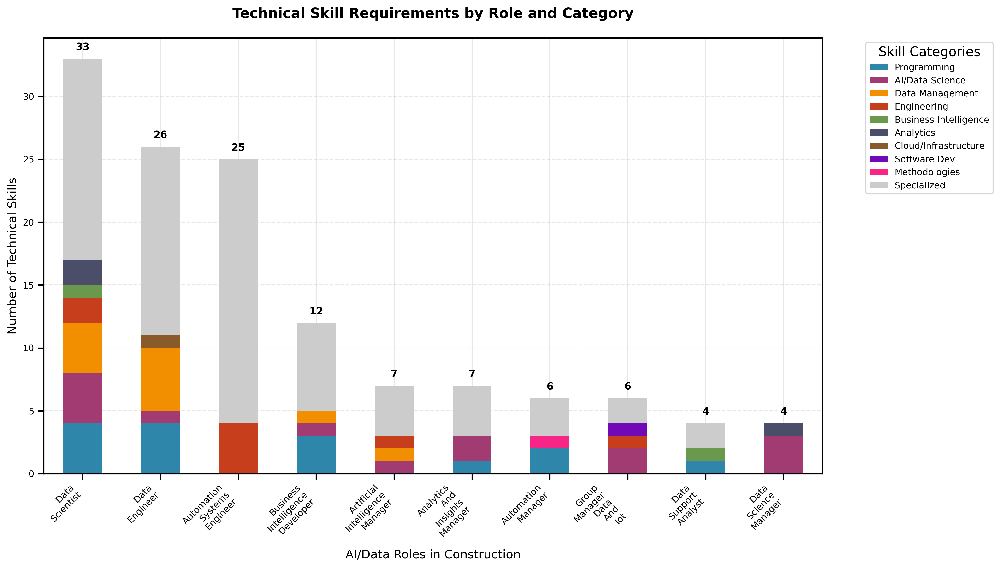

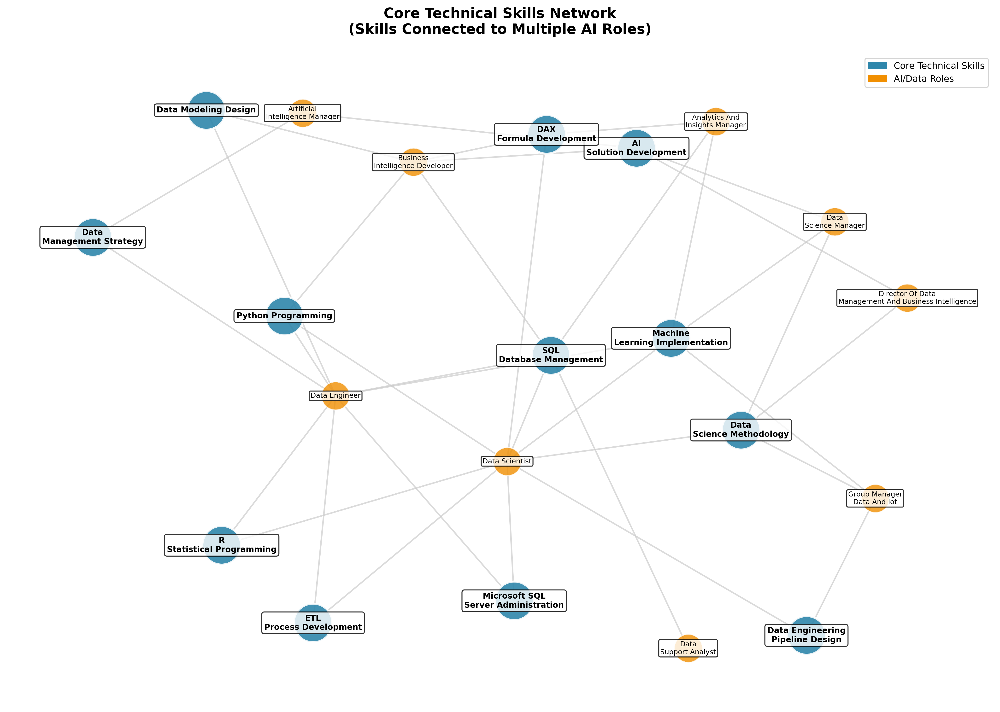

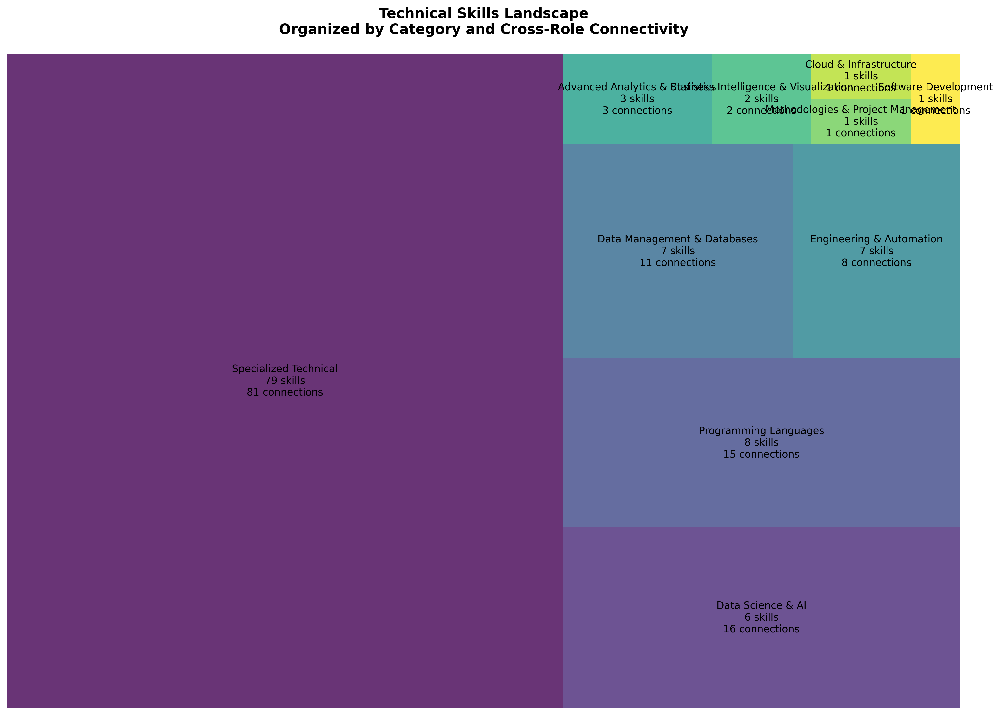


📊 VISUALIZATION ASSESSMENT FOR PAPER:

1. STACKED BAR CHART:
   ✅ Shows clear role hierarchy (Data Scientist: 33 skills)
   ✅ Reveals category distribution across roles
   ✅ Good for comparing role complexity
   📊 Publication potential: HIGH - Clear, quantitative, easy to interpret

2. NETWORK DIAGRAM:
   ✅ Shows 12 core skills connecting multiple roles
   ✅ Visualizes skill-role relationships
   ✅ Highlights foundational vs specialized skills
   📊 Publication potential: MEDIUM - Good for showing connections, but may be complex

3. HIERARCHICAL TREEMAP:
   ✅ Shows 10 skill categories by importance
   ✅ Visualizes category dominance and distribution
   ✅ Space-efficient representation
   📊 Publication potential: MEDIUM - Informative but may need explanation

💡 RECOMMENDATION:
   🏆 PRIMARY: Stacked Bar Chart - clearest for academic audience
   🥈 SECONDARY: Network Diagram - good for showing relationships
   🥉 OPTIONAL: Treemap - supplementary material or appendix

📁 All figures saved in

In [ ]:
# Technical Skills Visualizations for Academic Paper
# Author: Dr. M. Reza Hosseini
# Purpose: Create publication-quality visualizations of standardized technical skills

# Install required package
!pip install squarify

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import squarify  # For treemap
from matplotlib.patches import Rectangle
import matplotlib.patches as mpatches
from collections import defaultdict, Counter
import os
from datetime import datetime

# Set academic publication style
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Calibri', 'DejaVu Sans'],
    'font.size': 10,
    'axes.titlesize': 12,
    'axes.labelsize': 10,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.titlesize': 14,
    'text.usetex': False,
    'figure.dpi': 300,
    'savefig.dpi': 600,  # High resolution for publication
    'savefig.bbox': 'tight'
})

print("TECHNICAL SKILLS VISUALIZATIONS FOR ACADEMIC PAPER")
print("=" * 60)

# Load standardized data
appendices_dir = '/content/drive/MyDrive/knowledge-graph-llms/Appendices'

try:
    skills_by_role_df = pd.read_csv(os.path.join(appendices_dir, 'current_standardized_technical_skills_by_role.csv'))
    skills_summary_df = pd.read_csv(os.path.join(appendices_dir, 'current_standardized_technical_skills_summary.csv'))
    role_skills_count_df = pd.read_csv(os.path.join(appendices_dir, 'current_standardized_role_skills_count.csv'))

    print(f"✅ Loaded standardized data:")
    print(f"  - {len(skills_summary_df)} unique technical skills")
    print(f"  - {len(skills_by_role_df)} role-skill relationships")
    print(f"  - {len(role_skills_count_df)} roles analyzed")

except Exception as e:
    print(f"❌ Error loading standardized data: {e}")
    print("Please run the standardization script first.")

# =============================================================================
# 📊 VISUALIZATION 1: Stacked Bar Chart - Role Skill Counts by Category
# =============================================================================

def create_stacked_bar_chart():
    """Create stacked bar chart of role skill counts by category"""

    print("\n📊 Creating Stacked Bar Chart: Role Skill Counts by Category")

    # Prepare data for stacking
    category_mapping = {
        'Programming Languages': 'Programming',
        'Data Science & AI': 'AI/Data Science',
        'Data Management & Databases': 'Data Management',
        'Engineering & Automation': 'Engineering',
        'Business Intelligence & Visualization': 'Business Intelligence',
        'Advanced Analytics & Statistics': 'Analytics',
        'Cloud & Infrastructure': 'Cloud/Infrastructure',
        'Software Development': 'Software Dev',
        'Methodologies & Project Management': 'Methodologies',
        'Specialized Technical': 'Specialized'
    }

    # Create role-category matrix
    role_category_matrix = []

    for role in role_skills_count_df['Role'].head(10):  # Top 10 roles for clarity
        role_data = {'Role': role}
        role_skills = skills_by_role_df[skills_by_role_df['Role'] == role]

        category_counts = role_skills['Skill_Category'].value_counts()

        for category, short_name in category_mapping.items():
            role_data[short_name] = category_counts.get(category, 0)

        role_category_matrix.append(role_data)

    matrix_df = pd.DataFrame(role_category_matrix)
    matrix_df = matrix_df.set_index('Role')

    # Create the stacked bar chart
    fig, ax = plt.subplots(1, 1, figsize=(14, 8))

    # Color palette for categories
    colors = ['#2E86AB', '#A23B72', '#F18F01', '#C73E1D', '#6A994E',
              '#4A4E69', '#8B5A2B', '#7209B7', '#F72585', '#CCCCCC']

    # Create stacked bars
    matrix_df.plot(kind='bar', stacked=True, ax=ax, color=colors[:len(matrix_df.columns)])

    # Customize the chart
    ax.set_title('Technical Skill Requirements by Role and Category',
                fontsize=14, fontweight='bold', pad=20)
    ax.set_xlabel('AI/Data Roles in Construction', fontsize=12)
    ax.set_ylabel('Number of Technical Skills', fontsize=12)

    # Improve x-axis labels
    ax.set_xticklabels([label.get_text().replace(' ', '\n') for label in ax.get_xticklabels()],
                       rotation=45, ha='right')

    # Customize legend
    ax.legend(title='Skill Categories', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Add grid for better readability
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    ax.set_axisbelow(True)

    # Add totals on top of bars
    for i, (idx, row) in enumerate(matrix_df.iterrows()):
        total = row.sum()
        ax.text(i, total + 0.5, str(int(total)), ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()

    return fig, matrix_df

# =============================================================================
# 🕸️ VISUALIZATION 2: Network Diagram - Core Skills Connected to Roles
# =============================================================================

def create_core_skills_network():
    """Create network diagram of core skills (5+ roles) connected to their roles"""

    print("\n🕸️ Creating Network Diagram: Core Skills Connected to Roles")

    # Filter for core skills (connected to 2+ roles)
    core_skills = skills_summary_df[skills_summary_df['Number_of_Roles'] >= 2].copy()
    print(f"  Found {len(core_skills)} skills connected to 2+ roles")

    # Create network graph
    G = nx.Graph()

    # First, add all nodes
    skill_nodes = []
    role_nodes = set()

    # Add core skills as nodes and collect all roles
    for _, skill_row in core_skills.iterrows():
        skill_name = skill_row['Technical_Skill']
        G.add_node(skill_name, node_type='skill', connections=skill_row['Number_of_Roles'])
        skill_nodes.append(skill_name)

        # Parse connected roles
        connected_roles = skill_row['Connected_Roles'].split('; ')
        for role in connected_roles:
            role = role.strip()  # Remove any whitespace
            role_nodes.add(role)

    # Add all role nodes
    for role in role_nodes:
        G.add_node(role, node_type='role')

    # Add edges
    for _, skill_row in core_skills.iterrows():
        skill_name = skill_row['Technical_Skill']
        connected_roles = skill_row['Connected_Roles'].split('; ')

        for role in connected_roles:
            role = role.strip()  # Remove any whitespace
            G.add_edge(skill_name, role)

    print(f"  Network: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

    # Create layout with better parameters
    pos = nx.spring_layout(G, k=2.5, iterations=200, seed=42)

    # Verify all nodes have positions
    missing_positions = [node for node in G.nodes() if node not in pos]
    if missing_positions:
        print(f"  Warning: Missing positions for {len(missing_positions)} nodes")
        # Add default positions for missing nodes
        for i, node in enumerate(missing_positions):
            pos[node] = (i * 0.1, 0)

    # Create the visualization
    fig, ax = plt.subplots(1, 1, figsize=(14, 10))

    # Draw edges
    nx.draw_networkx_edges(G, pos, edge_color='#CCCCCC', width=1.5, alpha=0.7, ax=ax)

    # Separate skill and role nodes for different styling
    skill_positions = {node: pos[node] for node in skill_nodes if node in pos}
    role_positions = {node: pos[node] for node in role_nodes if node in pos}

    # Draw skill nodes (larger, blue)
    if skill_positions:
        nx.draw_networkx_nodes(G, skill_positions,
                              nodelist=list(skill_positions.keys()),
                              node_color='#2E86AB', node_size=1500,
                              alpha=0.9, linewidths=2, edgecolors='white', ax=ax)

    # Draw role nodes (smaller, orange)
    if role_positions:
        nx.draw_networkx_nodes(G, role_positions,
                              nodelist=list(role_positions.keys()),
                              node_color='#F18F01', node_size=800,
                              alpha=0.8, linewidths=1, edgecolors='white', ax=ax)

    # Add labels with better formatting
    # Skill labels (wrap long names)
    skill_labels = {}
    for node in skill_nodes:
        if node in pos:
            # Wrap long skill names
            if len(node) > 20:
                words = node.split()
                mid = len(words) // 2
                wrapped = ' '.join(words[:mid]) + '\n' + ' '.join(words[mid:])
                skill_labels[node] = wrapped
            else:
                skill_labels[node] = node

    # Role labels (wrap long names)
    role_labels = {}
    for node in role_nodes:
        if node in pos:
            # Wrap long role names
            if len(node) > 15:
                words = node.split()
                if len(words) > 2:
                    mid = len(words) // 2
                    wrapped = ' '.join(words[:mid]) + '\n' + ' '.join(words[mid:])
                    role_labels[node] = wrapped
                else:
                    role_labels[node] = node.replace(' ', '\n')
            else:
                role_labels[node] = node

    # Draw labels
    if skill_labels:
        nx.draw_networkx_labels(G, skill_positions, labels=skill_labels,
                               font_size=8, font_weight='bold', ax=ax,
                               bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

    if role_labels:
        nx.draw_networkx_labels(G, role_positions, labels=role_labels,
                               font_size=7, ax=ax,
                               bbox=dict(boxstyle="round,pad=0.2", facecolor="white", alpha=0.8))

    # Customize
    ax.set_title('Core Technical Skills Network\n(Skills Connected to Multiple AI Roles)',
                fontsize=14, fontweight='bold', pad=20)

    # Add legend
    skill_patch = mpatches.Patch(color='#2E86AB', label='Core Technical Skills')
    role_patch = mpatches.Patch(color='#F18F01', label='AI/Data Roles')
    ax.legend(handles=[skill_patch, role_patch], loc='upper right')

    # Remove axes
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

    plt.tight_layout()

    return fig, core_skills

# =============================================================================
# 🗺️ VISUALIZATION 3: Hierarchical Tree Map - Skills by Category and Frequency
# =============================================================================

def create_hierarchical_treemap():
    """Create hierarchical treemap of skills organized by category and frequency"""

    print("\n🗺️ Creating Hierarchical Tree Map: Skills by Category and Frequency")

    # Prepare data for treemap
    category_data = []

    # Group skills by category
    for category in skills_summary_df['Skill_Category'].unique():
        category_skills = skills_summary_df[skills_summary_df['Skill_Category'] == category]

        # Calculate total connections for this category
        total_connections = category_skills['Number_of_Roles'].sum()
        skill_count = len(category_skills)

        category_data.append({
            'category': category,
            'skill_count': skill_count,
            'total_connections': total_connections,
            'avg_connections': total_connections / skill_count if skill_count > 0 else 0
        })

    category_df = pd.DataFrame(category_data)
    category_df = category_df.sort_values('total_connections', ascending=False)

    # Create the treemap
    fig, ax = plt.subplots(1, 1, figsize=(14, 10))

    # Prepare data for squarify
    sizes = category_df['total_connections'].tolist()
    labels = [f"{row['category']}\n{row['skill_count']} skills\n{row['total_connections']} connections"
              for _, row in category_df.iterrows()]

    # Color map based on average connections
    colors = plt.cm.viridis(np.linspace(0, 1, len(sizes)))

    # Create treemap
    squarify.plot(sizes=sizes, label=labels, color=colors, alpha=0.8, ax=ax)

    # Customize
    ax.set_title('Technical Skills Landscape\nOrganized by Category and Cross-Role Connectivity',
                fontsize=14, fontweight='bold', pad=20)

    # Remove axes
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

    plt.tight_layout()

    return fig, category_df

# =============================================================================
# 💾 STEP 4: Generate All Visualizations and Save
# =============================================================================

def save_visualizations(figures, figure_names):
    """Save all visualizations in publication formats"""

    # Create figures directory
    figures_dir = '/content/drive/MyDrive/knowledge-graph-llms/academic_figures'
    os.makedirs(figures_dir, exist_ok=True)

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    saved_files = {}

    for fig, name in zip(figures, figure_names):
        # Save high-resolution PDF
        pdf_path = os.path.join(figures_dir, f'{name}_{timestamp}.pdf')
        fig.savefig(pdf_path, format='pdf', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')

        # Save current version
        current_pdf = os.path.join(figures_dir, f'{name}_current.pdf')
        fig.savefig(current_pdf, format='pdf', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')

        saved_files[name] = {'timestamped': pdf_path, 'current': current_pdf}

        print(f"✅ Saved: {name}")

    return saved_files

# Execute all visualizations
if 'skills_by_role_df' in locals():
    print("\n🎨 Generating all three visualizations...")

    # Create visualizations
    fig1, stacked_data = create_stacked_bar_chart()
    fig2, network_data = create_core_skills_network()
    fig3, treemap_data = create_hierarchical_treemap()

    # Save all figures
    figures = [fig1, fig2, fig3]
    figure_names = ['technical_skills_stacked_bar', 'core_skills_network', 'skills_hierarchical_treemap']

    saved_files = save_visualizations(figures, figure_names)

    # Display figures
    plt.show()

    print(f"\n📊 VISUALIZATION ASSESSMENT FOR PAPER:")
    print("=" * 50)

    print(f"\n1. STACKED BAR CHART:")
    print(f"   ✅ Shows clear role hierarchy (Data Scientist: {stacked_data.sum(axis=1).iloc[0]:.0f} skills)")
    print(f"   ✅ Reveals category distribution across roles")
    print(f"   ✅ Good for comparing role complexity")
    print(f"   📊 Publication potential: HIGH - Clear, quantitative, easy to interpret")

    print(f"\n2. NETWORK DIAGRAM:")
    print(f"   ✅ Shows {len(network_data)} core skills connecting multiple roles")
    print(f"   ✅ Visualizes skill-role relationships")
    print(f"   ✅ Highlights foundational vs specialized skills")
    print(f"   📊 Publication potential: MEDIUM - Good for showing connections, but may be complex")

    print(f"\n3. HIERARCHICAL TREEMAP:")
    print(f"   ✅ Shows {len(treemap_data)} skill categories by importance")
    print(f"   ✅ Visualizes category dominance and distribution")
    print(f"   ✅ Space-efficient representation")
    print(f"   📊 Publication potential: MEDIUM - Informative but may need explanation")

    print(f"\n💡 RECOMMENDATION:")
    print(f"   🏆 PRIMARY: Stacked Bar Chart - clearest for academic audience")
    print(f"   🥈 SECONDARY: Network Diagram - good for showing relationships")
    print(f"   🥉 OPTIONAL: Treemap - supplementary material or appendix")

    print(f"\n📁 All figures saved in: academic_figures/")
    print(f"   Use *_current.pdf files for immediate review")

else:
    print("❌ Please load the standardized technical skills data first.")

TECHNICAL SKILLS VISUALIZATIONS FOR ACADEMIC PAPER
✅ Loaded standardized data:
  - 115 unique technical skills
  - 139 role-skill relationships
  - 14 roles analyzed

🎨 Generating all three visualizations...

📊 Creating Stacked Bar Chart: Role Skill Counts by Category

🕸️ Creating Network Diagram: Core Skills Connected to Roles
  Found 12 skills connected to 2+ roles
  Network: 21 nodes, 36 edges

🗺️ Creating Hierarchical Tree Map: Skills by Category and Frequency
✅ Saved: technical_skills_stacked_bar
✅ Saved: core_skills_network
✅ Saved: skills_hierarchical_treemap


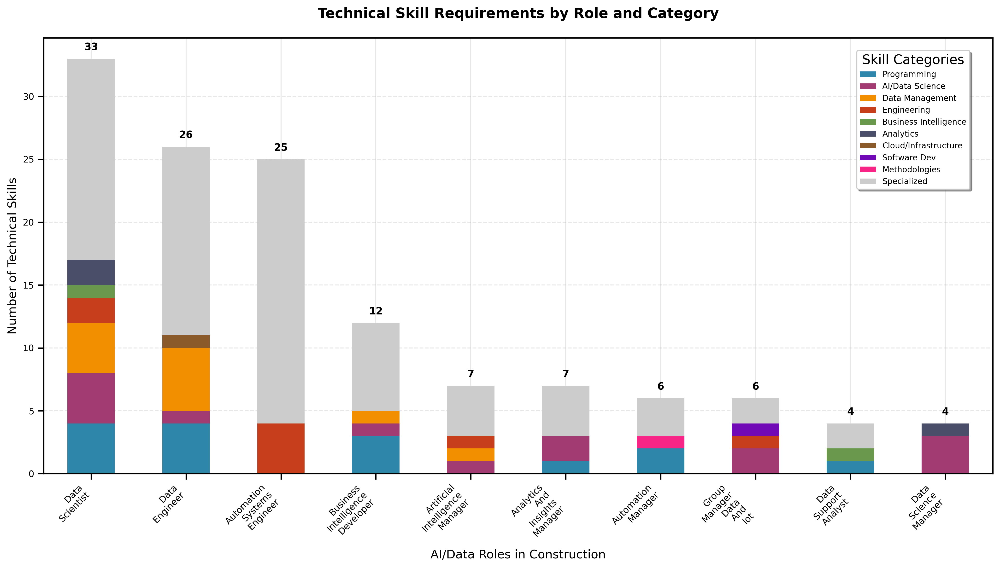

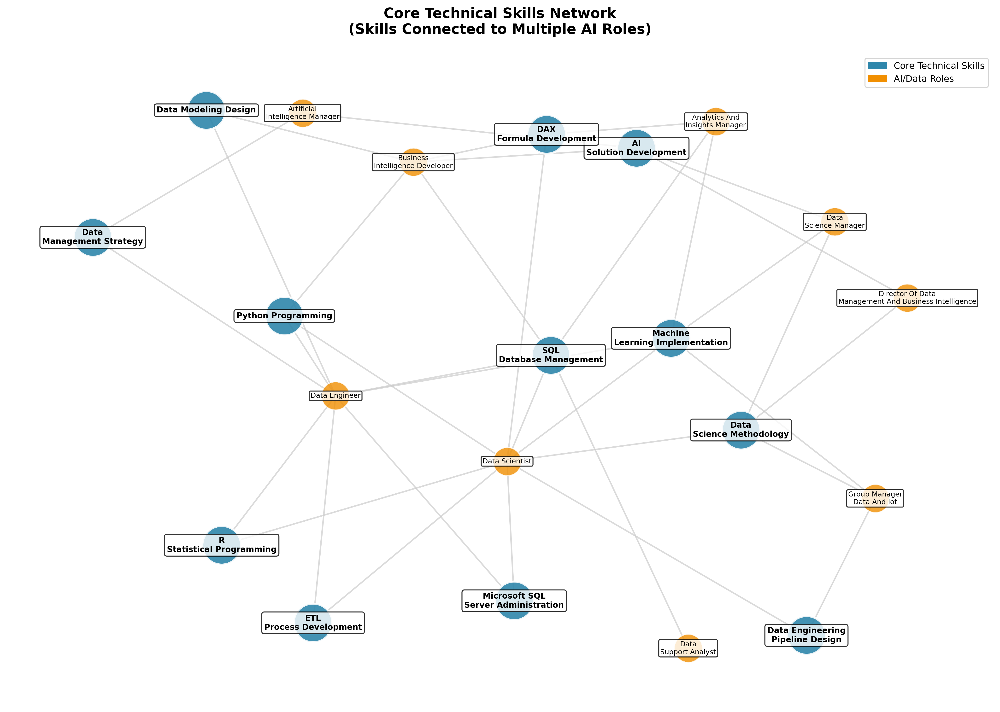

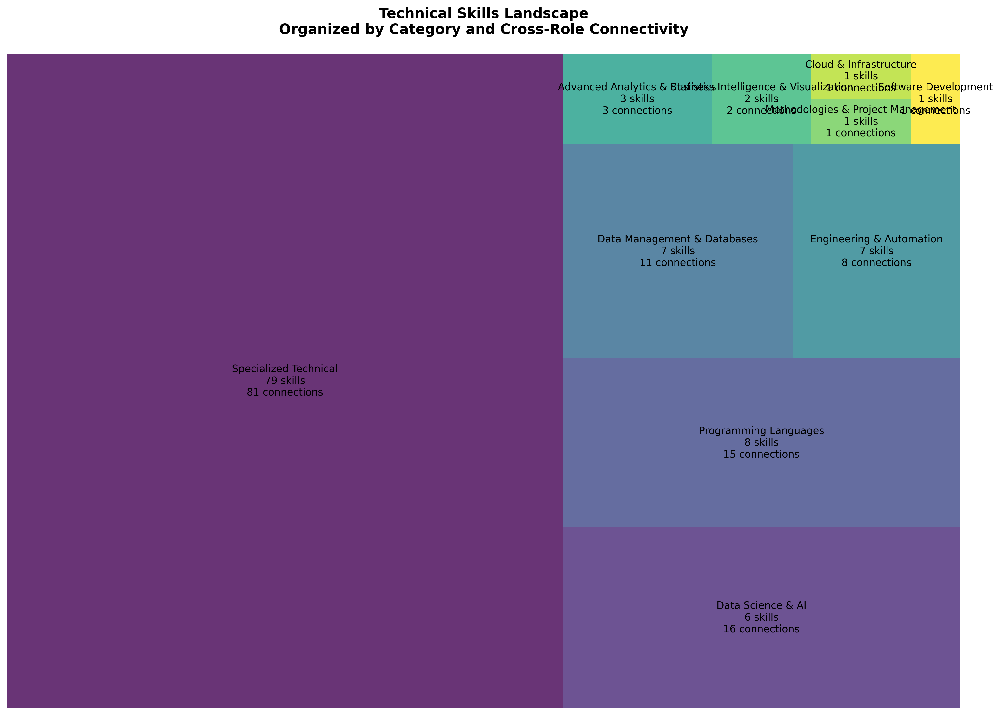


📊 VISUALIZATION ASSESSMENT FOR PAPER:

1. STACKED BAR CHART:
   ✅ Shows clear role hierarchy (Data Scientist: 33 skills)
   ✅ Reveals category distribution across roles
   ✅ Good for comparing role complexity
   📊 Publication potential: HIGH - Clear, quantitative, easy to interpret

2. NETWORK DIAGRAM:
   ✅ Shows 12 core skills connecting multiple roles
   ✅ Visualizes skill-role relationships
   ✅ Highlights foundational vs specialized skills
   📊 Publication potential: MEDIUM - Good for showing connections, but may be complex

3. HIERARCHICAL TREEMAP:
   ✅ Shows 10 skill categories by importance
   ✅ Visualizes category dominance and distribution
   ✅ Space-efficient representation
   📊 Publication potential: MEDIUM - Informative but may need explanation

💡 RECOMMENDATION:
   🏆 PRIMARY: Stacked Bar Chart - clearest for academic audience
   🥈 SECONDARY: Network Diagram - good for showing relationships
   🥉 OPTIONAL: Treemap - supplementary material or appendix

📁 All figures saved in

In [ ]:
# Technical Skills Visualizations for Academic Paper
# Author: Dr. M. Reza Hosseini
# Purpose: Create publication-quality visualizations of standardized technical skills

# Install required package
!pip install squarify

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import squarify  # For treemap
from matplotlib.patches import Rectangle
import matplotlib.patches as mpatches
from collections import defaultdict, Counter
import os
from datetime import datetime

# Set academic publication style
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Calibri', 'DejaVu Sans'],
    'font.size': 10,
    'axes.titlesize': 12,
    'axes.labelsize': 10,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.titlesize': 14,
    'text.usetex': False,
    'figure.dpi': 300,
    'savefig.dpi': 600,  # High resolution for publication
    'savefig.bbox': 'tight'
})

print("TECHNICAL SKILLS VISUALIZATIONS FOR ACADEMIC PAPER")
print("=" * 60)

# Load standardized data
appendices_dir = '/content/drive/MyDrive/knowledge-graph-llms/Appendices'

try:
    skills_by_role_df = pd.read_csv(os.path.join(appendices_dir, 'current_standardized_technical_skills_by_role.csv'))
    skills_summary_df = pd.read_csv(os.path.join(appendices_dir, 'current_standardized_technical_skills_summary.csv'))
    role_skills_count_df = pd.read_csv(os.path.join(appendices_dir, 'current_standardized_role_skills_count.csv'))

    print(f"✅ Loaded standardized data:")
    print(f"  - {len(skills_summary_df)} unique technical skills")
    print(f"  - {len(skills_by_role_df)} role-skill relationships")
    print(f"  - {len(role_skills_count_df)} roles analyzed")

except Exception as e:
    print(f"❌ Error loading standardized data: {e}")
    print("Please run the standardization script first.")

# =============================================================================
# 📊 VISUALIZATION 1: Stacked Bar Chart - Role Skill Counts by Category
# =============================================================================

def create_stacked_bar_chart():
    """Create stacked bar chart of role skill counts by category"""

    print("\n📊 Creating Stacked Bar Chart: Role Skill Counts by Category")

    # Prepare data for stacking
    category_mapping = {
        'Programming Languages': 'Programming',
        'Data Science & AI': 'AI/Data Science',
        'Data Management & Databases': 'Data Management',
        'Engineering & Automation': 'Engineering',
        'Business Intelligence & Visualization': 'Business Intelligence',
        'Advanced Analytics & Statistics': 'Analytics',
        'Cloud & Infrastructure': 'Cloud/Infrastructure',
        'Software Development': 'Software Dev',
        'Methodologies & Project Management': 'Methodologies',
        'Specialized Technical': 'Specialized'
    }

    # Create role-category matrix
    role_category_matrix = []

    for role in role_skills_count_df['Role'].head(10):  # Top 10 roles for clarity
        role_data = {'Role': role}
        role_skills = skills_by_role_df[skills_by_role_df['Role'] == role]

        category_counts = role_skills['Skill_Category'].value_counts()

        for category, short_name in category_mapping.items():
            role_data[short_name] = category_counts.get(category, 0)

        role_category_matrix.append(role_data)

    matrix_df = pd.DataFrame(role_category_matrix)
    matrix_df = matrix_df.set_index('Role')

    # Create the stacked bar chart
    fig, ax = plt.subplots(1, 1, figsize=(14, 8))

    # Color palette for categories
    colors = ['#2E86AB', '#A23B72', '#F18F01', '#C73E1D', '#6A994E',
              '#4A4E69', '#8B5A2B', '#7209B7', '#F72585', '#CCCCCC']

    # Create stacked bars
    matrix_df.plot(kind='bar', stacked=True, ax=ax, color=colors[:len(matrix_df.columns)])

    # Customize the chart
    ax.set_title('Technical Skill Requirements by Role and Category',
                fontsize=14, fontweight='bold', pad=20)
    ax.set_xlabel('AI/Data Roles in Construction', fontsize=12)
    ax.set_ylabel('Number of Technical Skills', fontsize=12)

    # Improve x-axis labels
    ax.set_xticklabels([label.get_text().replace(' ', '\n') for label in ax.get_xticklabels()],
                       rotation=45, ha='right')

    # UPDATED: Move legend inside graph borders at top right
    ax.legend(title='Skill Categories', loc='upper right', bbox_to_anchor=(0.98, 0.98),
              frameon=True, fancybox=True, shadow=True, fontsize=8)

    # Add grid for better readability
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    ax.set_axisbelow(True)

    # Add totals on top of bars
    for i, (idx, row) in enumerate(matrix_df.iterrows()):
        total = row.sum()
        ax.text(i, total + 0.5, str(int(total)), ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()

    return fig, matrix_df

# =============================================================================
# 🕸️ VISUALIZATION 2: Network Diagram - Core Skills Connected to Roles
# =============================================================================

def create_core_skills_network():
    """Create network diagram of core skills (5+ roles) connected to their roles"""

    print("\n🕸️ Creating Network Diagram: Core Skills Connected to Roles")

    # Filter for core skills (connected to 2+ roles)
    core_skills = skills_summary_df[skills_summary_df['Number_of_Roles'] >= 2].copy()
    print(f"  Found {len(core_skills)} skills connected to 2+ roles")

    # Create network graph
    G = nx.Graph()

    # First, add all nodes
    skill_nodes = []
    role_nodes = set()

    # Add core skills as nodes and collect all roles
    for _, skill_row in core_skills.iterrows():
        skill_name = skill_row['Technical_Skill']
        G.add_node(skill_name, node_type='skill', connections=skill_row['Number_of_Roles'])
        skill_nodes.append(skill_name)

        # Parse connected roles
        connected_roles = skill_row['Connected_Roles'].split('; ')
        for role in connected_roles:
            role = role.strip()  # Remove any whitespace
            role_nodes.add(role)

    # Add all role nodes
    for role in role_nodes:
        G.add_node(role, node_type='role')

    # Add edges
    for _, skill_row in core_skills.iterrows():
        skill_name = skill_row['Technical_Skill']
        connected_roles = skill_row['Connected_Roles'].split('; ')

        for role in connected_roles:
            role = role.strip()  # Remove any whitespace
            G.add_edge(skill_name, role)

    print(f"  Network: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

    # Create layout with better parameters
    pos = nx.spring_layout(G, k=2.5, iterations=200, seed=42)

    # Verify all nodes have positions
    missing_positions = [node for node in G.nodes() if node not in pos]
    if missing_positions:
        print(f"  Warning: Missing positions for {len(missing_positions)} nodes")
        # Add default positions for missing nodes
        for i, node in enumerate(missing_positions):
            pos[node] = (i * 0.1, 0)

    # Create the visualization
    fig, ax = plt.subplots(1, 1, figsize=(14, 10))

    # Draw edges
    nx.draw_networkx_edges(G, pos, edge_color='#CCCCCC', width=1.5, alpha=0.7, ax=ax)

    # Separate skill and role nodes for different styling
    skill_positions = {node: pos[node] for node in skill_nodes if node in pos}
    role_positions = {node: pos[node] for node in role_nodes if node in pos}

    # Draw skill nodes (larger, blue)
    if skill_positions:
        nx.draw_networkx_nodes(G, skill_positions,
                              nodelist=list(skill_positions.keys()),
                              node_color='#2E86AB', node_size=1500,
                              alpha=0.9, linewidths=2, edgecolors='white', ax=ax)

    # Draw role nodes (smaller, orange)
    if role_positions:
        nx.draw_networkx_nodes(G, role_positions,
                              nodelist=list(role_positions.keys()),
                              node_color='#F18F01', node_size=800,
                              alpha=0.8, linewidths=1, edgecolors='white', ax=ax)

    # Add labels with better formatting
    # Skill labels (wrap long names)
    skill_labels = {}
    for node in skill_nodes:
        if node in pos:
            # Wrap long skill names
            if len(node) > 20:
                words = node.split()
                mid = len(words) // 2
                wrapped = ' '.join(words[:mid]) + '\n' + ' '.join(words[mid:])
                skill_labels[node] = wrapped
            else:
                skill_labels[node] = node

    # Role labels (wrap long names)
    role_labels = {}
    for node in role_nodes:
        if node in pos:
            # Wrap long role names
            if len(node) > 15:
                words = node.split()
                if len(words) > 2:
                    mid = len(words) // 2
                    wrapped = ' '.join(words[:mid]) + '\n' + ' '.join(words[mid:])
                    role_labels[node] = wrapped
                else:
                    role_labels[node] = node.replace(' ', '\n')
            else:
                role_labels[node] = node

    # Draw labels
    if skill_labels:
        nx.draw_networkx_labels(G, skill_positions, labels=skill_labels,
                               font_size=8, font_weight='bold', ax=ax,
                               bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

    if role_labels:
        nx.draw_networkx_labels(G, role_positions, labels=role_labels,
                               font_size=7, ax=ax,
                               bbox=dict(boxstyle="round,pad=0.2", facecolor="white", alpha=0.8))

    # Customize
    ax.set_title('Core Technical Skills Network\n(Skills Connected to Multiple AI Roles)',
                fontsize=14, fontweight='bold', pad=20)

    # Add legend
    skill_patch = mpatches.Patch(color='#2E86AB', label='Core Technical Skills')
    role_patch = mpatches.Patch(color='#F18F01', label='AI/Data Roles')
    ax.legend(handles=[skill_patch, role_patch], loc='upper right')

    # Remove axes
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

    plt.tight_layout()

    return fig, core_skills

# =============================================================================
# 🗺️ VISUALIZATION 3: Hierarchical Tree Map - Skills by Category and Frequency
# =============================================================================

def create_hierarchical_treemap():
    """Create hierarchical treemap of skills organized by category and frequency"""

    print("\n🗺️ Creating Hierarchical Tree Map: Skills by Category and Frequency")

    # Prepare data for treemap
    category_data = []

    # Group skills by category
    for category in skills_summary_df['Skill_Category'].unique():
        category_skills = skills_summary_df[skills_summary_df['Skill_Category'] == category]

        # Calculate total connections for this category
        total_connections = category_skills['Number_of_Roles'].sum()
        skill_count = len(category_skills)

        category_data.append({
            'category': category,
            'skill_count': skill_count,
            'total_connections': total_connections,
            'avg_connections': total_connections / skill_count if skill_count > 0 else 0
        })

    category_df = pd.DataFrame(category_data)
    category_df = category_df.sort_values('total_connections', ascending=False)

    # Create the treemap
    fig, ax = plt.subplots(1, 1, figsize=(14, 10))

    # Prepare data for squarify
    sizes = category_df['total_connections'].tolist()
    labels = [f"{row['category']}\n{row['skill_count']} skills\n{row['total_connections']} connections"
              for _, row in category_df.iterrows()]

    # Color map based on average connections
    colors = plt.cm.viridis(np.linspace(0, 1, len(sizes)))

    # Create treemap
    squarify.plot(sizes=sizes, label=labels, color=colors, alpha=0.8, ax=ax)

    # Customize
    ax.set_title('Technical Skills Landscape\nOrganized by Category and Cross-Role Connectivity',
                fontsize=14, fontweight='bold', pad=20)

    # Remove axes
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

    plt.tight_layout()

    return fig, category_df

# =============================================================================
# 💾 STEP 4: Generate All Visualizations and Save
# =============================================================================

def save_visualizations(figures, figure_names):
    """Save all visualizations in publication formats"""

    # Create figures directory
    figures_dir = '/content/drive/MyDrive/knowledge-graph-llms/academic_figures'
    os.makedirs(figures_dir, exist_ok=True)

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    saved_files = {}

    for fig, name in zip(figures, figure_names):
        # Save high-resolution PDF
        pdf_path = os.path.join(figures_dir, f'{name}_{timestamp}.pdf')
        fig.savefig(pdf_path, format='pdf', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')

        # Save current version
        current_pdf = os.path.join(figures_dir, f'{name}_current.pdf')
        fig.savefig(current_pdf, format='pdf', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')

        saved_files[name] = {'timestamped': pdf_path, 'current': current_pdf}

        print(f"✅ Saved: {name}")

    return saved_files

# Execute all visualizations
if 'skills_by_role_df' in locals():
    print("\n🎨 Generating all three visualizations...")

    # Create visualizations
    fig1, stacked_data = create_stacked_bar_chart()
    fig2, network_data = create_core_skills_network()
    fig3, treemap_data = create_hierarchical_treemap()

    # Save all figures
    figures = [fig1, fig2, fig3]
    figure_names = ['technical_skills_stacked_bar', 'core_skills_network', 'skills_hierarchical_treemap']

    saved_files = save_visualizations(figures, figure_names)

    # Display figures
    plt.show()

    print(f"\n📊 VISUALIZATION ASSESSMENT FOR PAPER:")
    print("=" * 50)

    print(f"\n1. STACKED BAR CHART:")
    print(f"   ✅ Shows clear role hierarchy (Data Scientist: {stacked_data.sum(axis=1).iloc[0]:.0f} skills)")
    print(f"   ✅ Reveals category distribution across roles")
    print(f"   ✅ Good for comparing role complexity")
    print(f"   📊 Publication potential: HIGH - Clear, quantitative, easy to interpret")

    print(f"\n2. NETWORK DIAGRAM:")
    print(f"   ✅ Shows {len(network_data)} core skills connecting multiple roles")
    print(f"   ✅ Visualizes skill-role relationships")
    print(f"   ✅ Highlights foundational vs specialized skills")
    print(f"   📊 Publication potential: MEDIUM - Good for showing connections, but may be complex")

    print(f"\n3. HIERARCHICAL TREEMAP:")
    print(f"   ✅ Shows {len(treemap_data)} skill categories by importance")
    print(f"   ✅ Visualizes category dominance and distribution")
    print(f"   ✅ Space-efficient representation")
    print(f"   📊 Publication potential: MEDIUM - Informative but may need explanation")

    print(f"\n💡 RECOMMENDATION:")
    print(f"   🏆 PRIMARY: Stacked Bar Chart - clearest for academic audience")
    print(f"   🥈 SECONDARY: Network Diagram - good for showing relationships")
    print(f"   🥉 OPTIONAL: Treemap - supplementary material or appendix")

    print(f"\n📁 All figures saved in: academic_figures/")
    print(f"   Use *_current.pdf files for immediate review")

else:
    print("❌ Please load the standardized technical skills data first.")

TECHNICAL SKILLS VISUALIZATIONS FOR ACADEMIC PAPER
✅ Loaded standardized data:
  - 115 unique technical skills
  - 139 role-skill relationships
  - 14 roles analyzed

🎨 Generating all three visualizations...

📊 Creating Stacked Bar Chart: Role Skill Counts by Category

🕸️ Creating Network Diagram: Core Skills Connected to Roles
  Found 12 skills connected to 2+ roles
  Network: 21 nodes, 36 edges

🗺️ Creating Hierarchical Tree Map: Skills by Category and Frequency
✅ Saved: technical_skills_stacked_bar
✅ Saved: core_skills_network
✅ Saved: skills_hierarchical_treemap


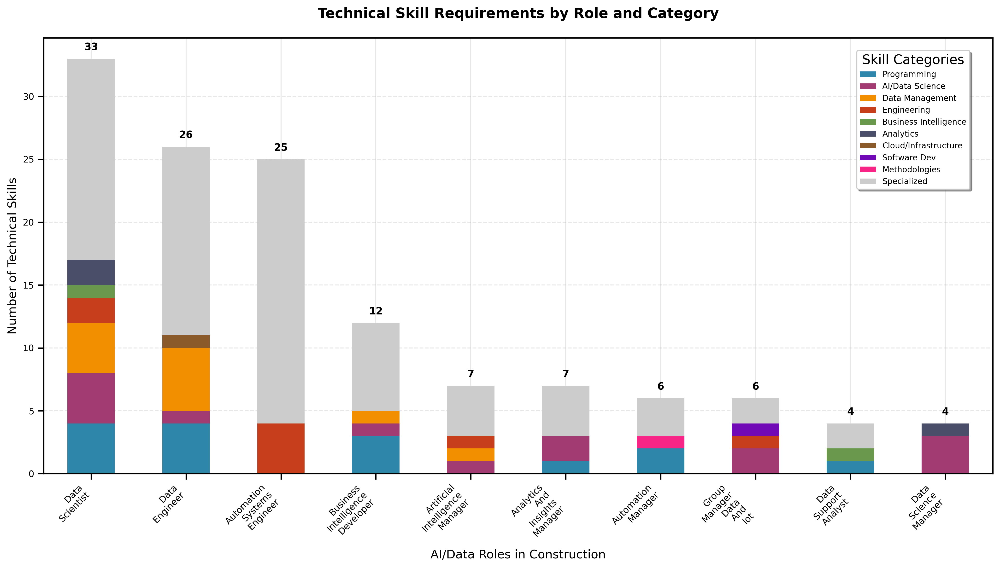

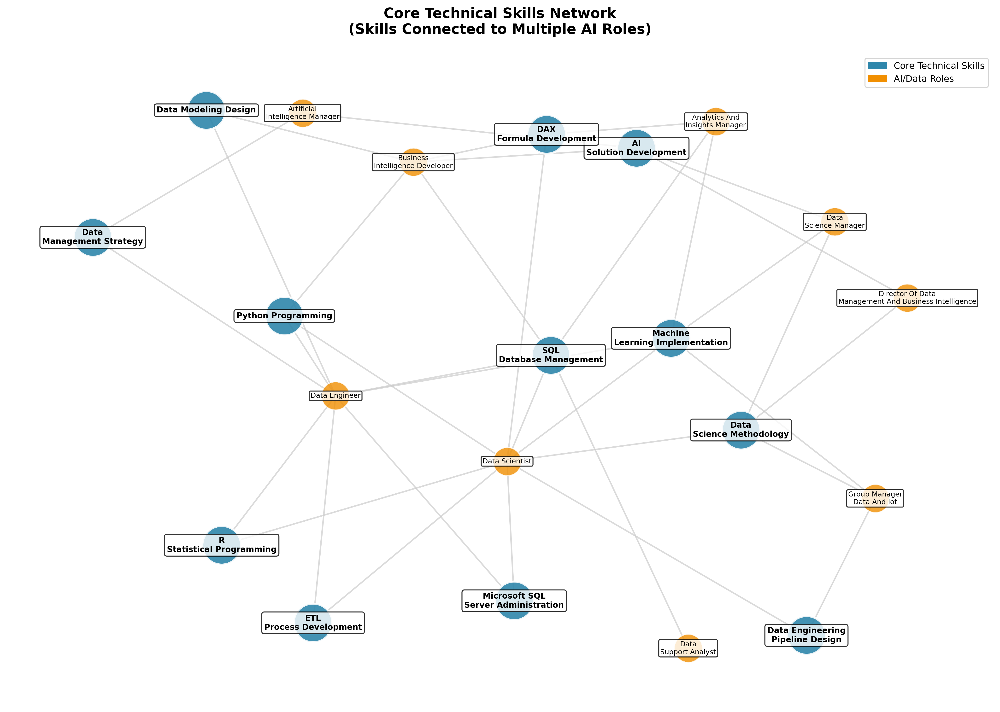

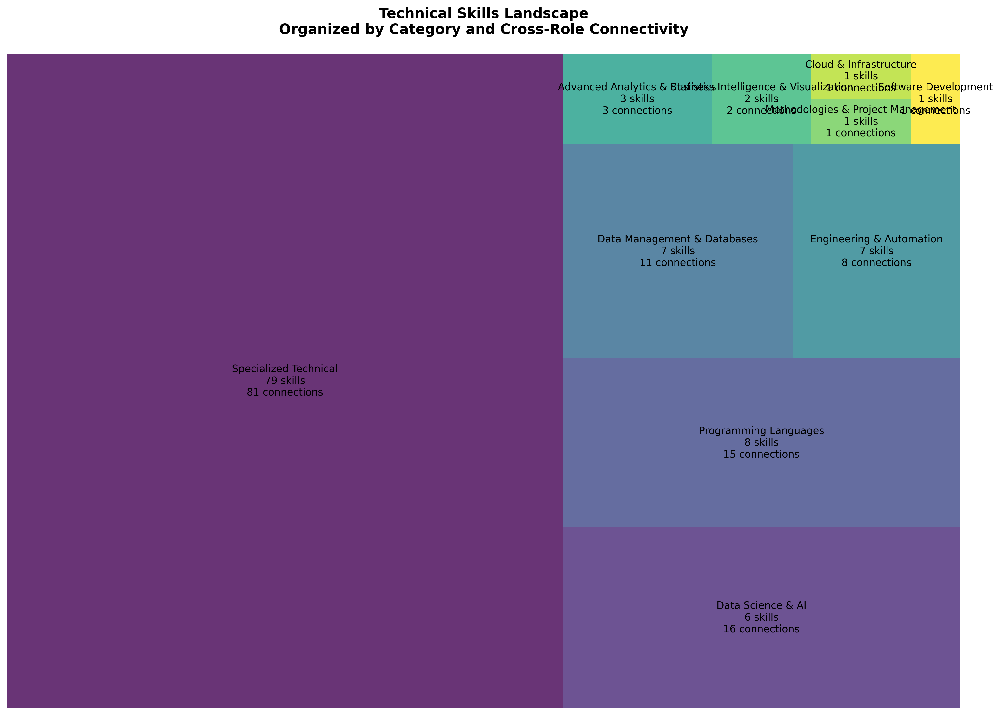


📊 VISUALIZATION ASSESSMENT FOR PAPER:

1. STACKED BAR CHART:
   ✅ Shows clear role hierarchy (Data Scientist: 33 skills)
   ✅ Reveals category distribution across roles
   ✅ Good for comparing role complexity
   📊 Publication potential: HIGH - Clear, quantitative, easy to interpret

2. NETWORK DIAGRAM:
   ✅ Shows 12 core skills connecting multiple roles
   ✅ Visualizes skill-role relationships
   ✅ Highlights foundational vs specialized skills
   📊 Publication potential: MEDIUM - Good for showing connections, but may be complex

3. HIERARCHICAL TREEMAP:
   ✅ Shows 10 skill categories by importance
   ✅ Visualizes category dominance and distribution
   ✅ Space-efficient representation
   📊 Publication potential: MEDIUM - Informative but may need explanation

💡 RECOMMENDATION:
   🏆 PRIMARY: Stacked Bar Chart - clearest for academic audience
   🥈 SECONDARY: Network Diagram - good for showing relationships
   🥉 OPTIONAL: Treemap - supplementary material or appendix

📁 All figures saved in

In [ ]:
# Technical Skills Visualizations for Academic Paper
# Author: Dr. M. Reza Hosseini
# Purpose: Create publication-quality visualizations of standardized technical skills

# Install required package
!pip install squarify

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import squarify  # For treemap
from matplotlib.patches import Rectangle
import matplotlib.patches as mpatches
from collections import defaultdict, Counter
import os
from datetime import datetime

# Set academic publication style
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Calibri', 'DejaVu Sans'],
    'font.size': 10,
    'axes.titlesize': 12,
    'axes.labelsize': 10,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.titlesize': 14,
    'text.usetex': False,
    'figure.dpi': 300,
    'savefig.dpi': 600,  # High resolution for publication
    'savefig.bbox': 'tight'
})

print("TECHNICAL SKILLS VISUALIZATIONS FOR ACADEMIC PAPER")
print("=" * 60)

# Load standardized data
appendices_dir = '/content/drive/MyDrive/knowledge-graph-llms/Appendices'

try:
    skills_by_role_df = pd.read_csv(os.path.join(appendices_dir, 'current_standardized_technical_skills_by_role.csv'))
    skills_summary_df = pd.read_csv(os.path.join(appendices_dir, 'current_standardized_technical_skills_summary.csv'))
    role_skills_count_df = pd.read_csv(os.path.join(appendices_dir, 'current_standardized_role_skills_count.csv'))

    print(f"✅ Loaded standardized data:")
    print(f"  - {len(skills_summary_df)} unique technical skills")
    print(f"  - {len(skills_by_role_df)} role-skill relationships")
    print(f"  - {len(role_skills_count_df)} roles analyzed")

except Exception as e:
    print(f"❌ Error loading standardized data: {e}")
    print("Please run the standardization script first.")

# =============================================================================
# 📊 VISUALIZATION 1: Stacked Bar Chart - Role Skill Counts by Category
# =============================================================================

def create_stacked_bar_chart():
    """Create stacked bar chart of role skill counts by category"""

    print("\n📊 Creating Stacked Bar Chart: Role Skill Counts by Category")

    # Prepare data for stacking
    category_mapping = {
        'Programming Languages': 'Programming',
        'Data Science & AI': 'AI/Data Science',
        'Data Management & Databases': 'Data Management',
        'Engineering & Automation': 'Engineering',
        'Business Intelligence & Visualization': 'Business Intelligence',
        'Advanced Analytics & Statistics': 'Analytics',
        'Cloud & Infrastructure': 'Cloud/Infrastructure',
        'Software Development': 'Software Dev',
        'Methodologies & Project Management': 'Methodologies',
        'Specialized Technical': 'Specialized'
    }

    # Create role-category matrix
    role_category_matrix = []

    for role in role_skills_count_df['Role'].head(10):  # Top 10 roles for clarity
        role_data = {'Role': role}
        role_skills = skills_by_role_df[skills_by_role_df['Role'] == role]

        category_counts = role_skills['Skill_Category'].value_counts()

        for category, short_name in category_mapping.items():
            role_data[short_name] = category_counts.get(category, 0)

        role_category_matrix.append(role_data)

    matrix_df = pd.DataFrame(role_category_matrix)
    matrix_df = matrix_df.set_index('Role')

    # Create the stacked bar chart
    fig, ax = plt.subplots(1, 1, figsize=(14, 8))

    # Color palette for categories
    colors = ['#2E86AB', '#A23B72', '#F18F01', '#C73E1D', '#6A994E',
              '#4A4E69', '#8B5A2B', '#7209B7', '#F72585', '#CCCCCC']

    # Create stacked bars
    matrix_df.plot(kind='bar', stacked=True, ax=ax, color=colors[:len(matrix_df.columns)])

    # Customize the chart
    ax.set_title('Technical Skill Requirements by Role and Category',
                fontsize=14, fontweight='bold', pad=20)
    ax.set_xlabel('AI/Data Roles in Construction', fontsize=12)
    ax.set_ylabel('Number of Technical Skills', fontsize=12)

    # Improve x-axis labels
    ax.set_xticklabels([label.get_text().replace(' ', '\n') for label in ax.get_xticklabels()],
                       rotation=45, ha='right')

    # UPDATED: Move legend inside graph borders at top right
    ax.legend(title='Skill Categories', loc='upper right', bbox_to_anchor=(0.98, 0.98),
              frameon=True, fancybox=True, shadow=True, fontsize=8)

    # Add grid for better readability
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    ax.set_axisbelow(True)

    # Add totals on top of bars
    for i, (idx, row) in enumerate(matrix_df.iterrows()):
        total = row.sum()
        ax.text(i, total + 0.5, str(int(total)), ha='center', va='bottom', fontweight='bold')

    plt.tight_layout()

    return fig, matrix_df

# =============================================================================
# 🕸️ VISUALIZATION 2: Network Diagram - Core Skills Connected to Roles
# =============================================================================

def create_core_skills_network():
    """Create network diagram of core skills (5+ roles) connected to their roles"""

    print("\n🕸️ Creating Network Diagram: Core Skills Connected to Roles")

    # Filter for core skills (connected to 2+ roles)
    core_skills = skills_summary_df[skills_summary_df['Number_of_Roles'] >= 2].copy()
    print(f"  Found {len(core_skills)} skills connected to 2+ roles")

    # Create network graph
    G = nx.Graph()

    # First, add all nodes
    skill_nodes = []
    role_nodes = set()

    # Add core skills as nodes and collect all roles
    for _, skill_row in core_skills.iterrows():
        skill_name = skill_row['Technical_Skill']
        G.add_node(skill_name, node_type='skill', connections=skill_row['Number_of_Roles'])
        skill_nodes.append(skill_name)

        # Parse connected roles
        connected_roles = skill_row['Connected_Roles'].split('; ')
        for role in connected_roles:
            role = role.strip()  # Remove any whitespace
            role_nodes.add(role)

    # Add all role nodes
    for role in role_nodes:
        G.add_node(role, node_type='role')

    # Add edges
    for _, skill_row in core_skills.iterrows():
        skill_name = skill_row['Technical_Skill']
        connected_roles = skill_row['Connected_Roles'].split('; ')

        for role in connected_roles:
            role = role.strip()  # Remove any whitespace
            G.add_edge(skill_name, role)

    print(f"  Network: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

    # Create layout with better parameters
    pos = nx.spring_layout(G, k=2.5, iterations=200, seed=42)

    # Verify all nodes have positions
    missing_positions = [node for node in G.nodes() if node not in pos]
    if missing_positions:
        print(f"  Warning: Missing positions for {len(missing_positions)} nodes")
        # Add default positions for missing nodes
        for i, node in enumerate(missing_positions):
            pos[node] = (i * 0.1, 0)

    # Create the visualization
    fig, ax = plt.subplots(1, 1, figsize=(14, 10))

    # Draw edges
    nx.draw_networkx_edges(G, pos, edge_color='#CCCCCC', width=1.5, alpha=0.7, ax=ax)

    # Separate skill and role nodes for different styling
    skill_positions = {node: pos[node] for node in skill_nodes if node in pos}
    role_positions = {node: pos[node] for node in role_nodes if node in pos}

    # Draw skill nodes (larger, blue)
    if skill_positions:
        nx.draw_networkx_nodes(G, skill_positions,
                              nodelist=list(skill_positions.keys()),
                              node_color='#2E86AB', node_size=1500,
                              alpha=0.9, linewidths=2, edgecolors='white', ax=ax)

    # Draw role nodes (smaller, orange)
    if role_positions:
        nx.draw_networkx_nodes(G, role_positions,
                              nodelist=list(role_positions.keys()),
                              node_color='#F18F01', node_size=800,
                              alpha=0.8, linewidths=1, edgecolors='white', ax=ax)

    # Add labels with better formatting
    # Skill labels (wrap long names)
    skill_labels = {}
    for node in skill_nodes:
        if node in pos:
            # Wrap long skill names
            if len(node) > 20:
                words = node.split()
                mid = len(words) // 2
                wrapped = ' '.join(words[:mid]) + '\n' + ' '.join(words[mid:])
                skill_labels[node] = wrapped
            else:
                skill_labels[node] = node

    # Role labels (wrap long names)
    role_labels = {}
    for node in role_nodes:
        if node in pos:
            # Wrap long role names
            if len(node) > 15:
                words = node.split()
                if len(words) > 2:
                    mid = len(words) // 2
                    wrapped = ' '.join(words[:mid]) + '\n' + ' '.join(words[mid:])
                    role_labels[node] = wrapped
                else:
                    role_labels[node] = node.replace(' ', '\n')
            else:
                role_labels[node] = node

    # Draw labels
    if skill_labels:
        nx.draw_networkx_labels(G, skill_positions, labels=skill_labels,
                               font_size=8, font_weight='bold', ax=ax,
                               bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.8))

    if role_labels:
        nx.draw_networkx_labels(G, role_positions, labels=role_labels,
                               font_size=7, ax=ax,
                               bbox=dict(boxstyle="round,pad=0.2", facecolor="white", alpha=0.8))

    # Customize
    ax.set_title('Core Technical Skills Network\n(Skills Connected to Multiple AI Roles)',
                fontsize=14, fontweight='bold', pad=20)

    # Add legend
    skill_patch = mpatches.Patch(color='#2E86AB', label='Core Technical Skills')
    role_patch = mpatches.Patch(color='#F18F01', label='AI/Data Roles')
    ax.legend(handles=[skill_patch, role_patch], loc='upper right')

    # Remove axes
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

    plt.tight_layout()

    return fig, core_skills

# =============================================================================
# 🗺️ VISUALIZATION 3: Hierarchical Tree Map - Skills by Category and Frequency
# =============================================================================

def create_hierarchical_treemap():
    """Create hierarchical treemap of skills organized by category and frequency"""

    print("\n🗺️ Creating Hierarchical Tree Map: Skills by Category and Frequency")

    # Prepare data for treemap
    category_data = []

    # Group skills by category
    for category in skills_summary_df['Skill_Category'].unique():
        category_skills = skills_summary_df[skills_summary_df['Skill_Category'] == category]

        # Calculate total connections for this category
        total_connections = category_skills['Number_of_Roles'].sum()
        skill_count = len(category_skills)

        category_data.append({
            'category': category,
            'skill_count': skill_count,
            'total_connections': total_connections,
            'avg_connections': total_connections / skill_count if skill_count > 0 else 0
        })

    category_df = pd.DataFrame(category_data)
    category_df = category_df.sort_values('total_connections', ascending=False)

    # Create the treemap
    fig, ax = plt.subplots(1, 1, figsize=(14, 10))

    # Prepare data for squarify
    sizes = category_df['total_connections'].tolist()
    labels = [f"{row['category']}\n{row['skill_count']} skills\n{row['total_connections']} connections"
              for _, row in category_df.iterrows()]

    # Color map based on average connections
    colors = plt.cm.viridis(np.linspace(0, 1, len(sizes)))

    # Create treemap
    squarify.plot(sizes=sizes, label=labels, color=colors, alpha=0.8, ax=ax)

    # Customize
    ax.set_title('Technical Skills Landscape\nOrganized by Category and Cross-Role Connectivity',
                fontsize=14, fontweight='bold', pad=20)

    # Remove axes
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

    plt.tight_layout()

    return fig, category_df

# =============================================================================
# 💾 STEP 4: Generate All Visualizations and Save
# =============================================================================

def save_visualizations(figures, figure_names):
    """Save all visualizations in publication formats"""

    # Create figures directory
    figures_dir = '/content/drive/MyDrive/knowledge-graph-llms/academic_figures'
    os.makedirs(figures_dir, exist_ok=True)

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    saved_files = {}

    for fig, name in zip(figures, figure_names):
        # Save high-resolution PDF
        pdf_path = os.path.join(figures_dir, f'{name}_{timestamp}.pdf')
        fig.savefig(pdf_path, format='pdf', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')

        # Save current version
        current_pdf = os.path.join(figures_dir, f'{name}_current.pdf')
        fig.savefig(current_pdf, format='pdf', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')

        saved_files[name] = {'timestamped': pdf_path, 'current': current_pdf}

        print(f"✅ Saved: {name}")

    return saved_files

# Execute all visualizations
if 'skills_by_role_df' in locals():
    print("\n🎨 Generating all three visualizations...")

    # Create visualizations
    fig1, stacked_data = create_stacked_bar_chart()
    fig2, network_data = create_core_skills_network()
    fig3, treemap_data = create_hierarchical_treemap()

    # Save all figures
    figures = [fig1, fig2, fig3]
    figure_names = ['technical_skills_stacked_bar', 'core_skills_network', 'skills_hierarchical_treemap']

    saved_files = save_visualizations(figures, figure_names)

    # Display figures
    plt.show()

    print(f"\n📊 VISUALIZATION ASSESSMENT FOR PAPER:")
    print("=" * 50)

    print(f"\n1. STACKED BAR CHART:")
    print(f"   ✅ Shows clear role hierarchy (Data Scientist: {stacked_data.sum(axis=1).iloc[0]:.0f} skills)")
    print(f"   ✅ Reveals category distribution across roles")
    print(f"   ✅ Good for comparing role complexity")
    print(f"   📊 Publication potential: HIGH - Clear, quantitative, easy to interpret")

    print(f"\n2. NETWORK DIAGRAM:")
    print(f"   ✅ Shows {len(network_data)} core skills connecting multiple roles")
    print(f"   ✅ Visualizes skill-role relationships")
    print(f"   ✅ Highlights foundational vs specialized skills")
    print(f"   📊 Publication potential: MEDIUM - Good for showing connections, but may be complex")

    print(f"\n3. HIERARCHICAL TREEMAP:")
    print(f"   ✅ Shows {len(treemap_data)} skill categories by importance")
    print(f"   ✅ Visualizes category dominance and distribution")
    print(f"   ✅ Space-efficient representation")
    print(f"   📊 Publication potential: MEDIUM - Informative but may need explanation")

    print(f"\n💡 RECOMMENDATION:")
    print(f"   🏆 PRIMARY: Stacked Bar Chart - clearest for academic audience")
    print(f"   🥈 SECONDARY: Network Diagram - good for showing relationships")
    print(f"   🥉 OPTIONAL: Treemap - supplementary material or appendix")

    print(f"\n📁 All figures saved in: academic_figures/")
    print(f"   Use *_current.pdf files for immediate review")

else:
    print("❌ Please load the standardized technical skills data first.")

🔎 Preview of top 20 skill-by-role-type data for plotting:


Role_Type,Management,Technical Specialist,Technical Support
Technical_Skill,,,
Machine Learning Implementation,3.0,2.0,0.0
SQL Database Management,1.0,3.0,1.0
AI Solution Development,3.0,1.0,0.0
Data Science Methodology,3.0,1.0,0.0
Python Programming,0.0,3.0,0.0
DAX Formula Development,1.0,2.0,0.0
R Statistical Programming,0.0,2.0,0.0
Data Modeling Design,0.0,2.0,0.0
Microsoft SQL Server Administration,0.0,2.0,0.0


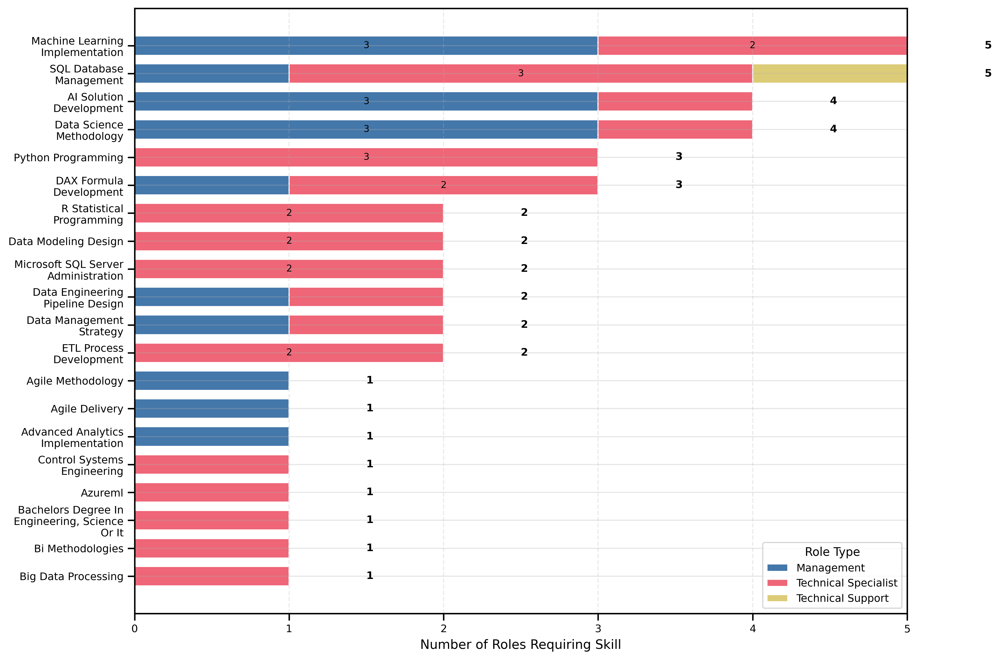

In [ ]:
# 📊 Top 20 Technical Skills Needed by AI Roles (Stacked by Role Type)
# No title, full y-labels for skills (no abbreviation), academic styling

import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np

# --- 1. Load Data ---
appendices_dir = '/content/drive/MyDrive/knowledge-graph-llms/Appendices'
skills_by_role_fp = os.path.join(appendices_dir, 'current_standardized_technical_skills_by_role.csv')
skills_by_role_df = pd.read_csv(skills_by_role_fp)

# --- 2. Role Type Mapping (with provided mapping) ---
role_type_mapping = {
    # Management roles
    'Analytics And Insights Manager': 'Management',
    'Automation Manager': 'Management',
    'Group Manager Data And Iot': 'Management',
    'Data Science Manager': 'Management',
    'Artificial Intelligence Manager': 'Management',
    'Data Engineering Manager': 'Management',
    'Director Of Data Management And Business Intelligence': 'Management',

    # Technical Specialist roles
    'Analytics Developer': 'Technical Specialist',
    'Business Intelligence Developer': 'Technical Specialist',
    'Automation Systems Engineer': 'Technical Specialist',
    'Data Engineer': 'Technical Specialist',
    'Data Scientist': 'Technical Specialist',

    # Technical Support roles
    'Data Support Analyst': 'Technical Support',
    'Automation Technician': 'Technical Support',
}

if 'Role_Type' not in skills_by_role_df.columns:
    skills_by_role_df['Role_Type'] = skills_by_role_df['Role'].map(role_type_mapping)
    unmapped = skills_by_role_df[skills_by_role_df['Role_Type'].isna()]['Role'].unique()
    if len(unmapped) > 0:
        print("⚠️ The following roles are still unmapped. Add them to 'role_type_mapping' as needed:")
        print(unmapped)
        raise ValueError("Add missing roles to mapping and rerun.")
else:
    print("✅ 'Role_Type' column found in data.")

# --- 3. Prepare Data for Top 20 Skills ---
top_n = 20  # configurable: show top N skills
skill_role_counts = (
    skills_by_role_df
    .drop_duplicates(subset=['Technical_Skill', 'Role', 'Role_Type'])
    .groupby(['Technical_Skill', 'Role_Type'])['Role']
    .nunique()
    .reset_index(name='Role_Count')
)
top_skills = (
    skill_role_counts.groupby('Technical_Skill')['Role_Count']
    .sum()
    .sort_values(ascending=False)
    .head(top_n)
    .index
)
skill_role_counts_top = skill_role_counts[skill_role_counts['Technical_Skill'].isin(top_skills)]
plot_df = skill_role_counts_top.pivot(index='Technical_Skill', columns='Role_Type', values='Role_Count').fillna(0)
plot_df = plot_df.loc[plot_df.sum(axis=1).sort_values(ascending=False).index]  # sort by total

print("🔎 Preview of top 20 skill-by-role-type data for plotting:")
display(plot_df)

# --- 4. Plotting (No title, full y-labels) ---

plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Calibri', 'DejaVu Sans'],
    'font.size': 10,
    'axes.titlesize': 12,
    'axes.labelsize': 10,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.titlesize': 14,
    'text.usetex': False,
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight'
})

role_type_colors = {
    'Management': '#4477AA',           # blue
    'Technical Specialist': '#EE6677', # reddish
    'Technical Support': '#DDCC77',    # golden yellow
}
role_types_present = [c for c in ['Management', 'Technical Specialist', 'Technical Support'] if c in plot_df.columns]

fig, ax = plt.subplots(figsize=(12, 8))

bottom = np.zeros(len(plot_df))
y_labels = plot_df.index.tolist()

for role_type in role_types_present:
    values = plot_df[role_type].values
    bars = ax.barh(
        y=range(len(plot_df)), width=values, left=bottom,
        color=role_type_colors[role_type],
        label=role_type, height=0.7, edgecolor='white'
    )
    for i, (x, b) in enumerate(zip(values, bottom)):
        if x > 0 and x >= 2:
            ax.text(b + x / 2, i, str(int(x)), va='center', ha='center', fontsize=8, color='black')
    bottom += values

# Full skill names on y-axis, no abbreviation
ax.set_yticks(range(len(y_labels)))
ax.set_yticklabels(y_labels, fontsize=9, wrap=True)
ax.invert_yaxis()  # Most frequent on top

# X axis and grid
ax.set_xlabel("Number of Roles Requiring Skill", fontsize=11)
# No title
ax.grid(axis='x', linestyle='--', alpha=0.25)

# Add total at end of each bar
for i, total in enumerate(plot_df.sum(axis=1)):
    ax.text(total + 0.5, i, str(int(total)), va='center', ha='left', fontsize=9, fontweight='bold')

# Legend
ax.legend(title='Role Type', loc='lower right', frameon=True, fontsize=9, title_fontsize=10)

plt.tight_layout()
plt.show()


🔍 Verifying your exact data:
 1. Machine Learning Implementation: M=3, TS=2, TSup=0, Total=5
 2. SQL Database Management: M=1, TS=3, TSup=1, Total=5
 3. AI Solution Development: M=3, TS=1, TSup=0, Total=4
 4. Data Science Methodology: M=3, TS=1, TSup=0, Total=4
 5. Python Programming: M=0, TS=3, TSup=0, Total=3
 6. DAX Formula Development: M=1, TS=2, TSup=0, Total=3
 7. R Statistical Programming: M=0, TS=2, TSup=0, Total=2
 8. Data Modeling Design: M=0, TS=2, TSup=0, Total=2
 9. SQL Server Administration: M=0, TS=2, TSup=0, Total=2
10. Data Engineering Pipeline Design: M=1, TS=1, TSup=0, Total=2
11. Data Management Strategy: M=1, TS=1, TSup=0, Total=2
12. ETL Process Development: M=0, TS=2, TSup=0, Total=2
13. Agile Methodology: M=1, TS=0, TSup=0, Total=1
14. Agile Delivery: M=1, TS=0, TSup=0, Total=1
15. Advanced Analytics Implementation: M=1, TS=0, TSup=0, Total=1
16. Control Systems Engineering: M=0, TS=1, TSup=0, Total=1
17. Azure ML: M=0, TS=1, TSup=0, Total=1
18. Engineering/Scie

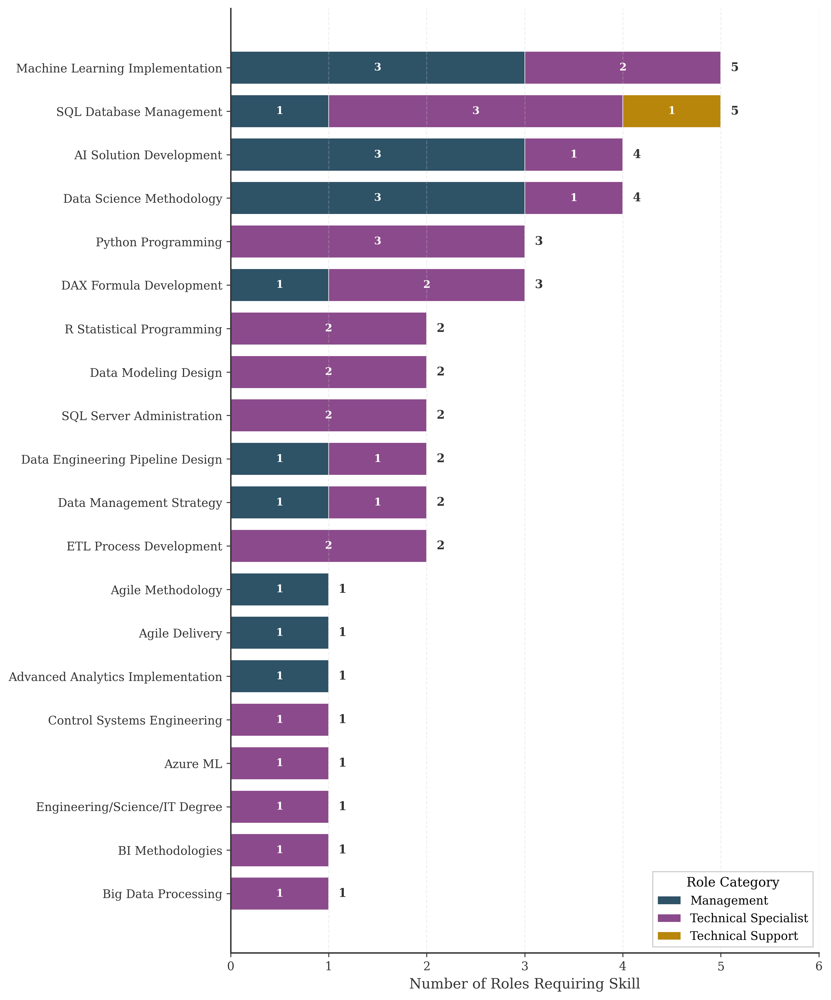

📊 Technical Skills Analysis Summary:
All 20 skills displayed (complete dataset)
Azure ML position: 17

All skills in order:
 1. Machine Learning Implementation: 5 roles
 2. SQL Database Management: 5 roles
 3. AI Solution Development: 4 roles
 4. Data Science Methodology: 4 roles
 5. Python Programming: 3 roles
 6. DAX Formula Development: 3 roles
 7. R Statistical Programming: 2 roles
 8. Data Modeling Design: 2 roles
 9. SQL Server Administration: 2 roles
10. Data Engineering Pipeline Design: 2 roles
11. Data Management Strategy: 2 roles
12. ETL Process Development: 2 roles
13. Agile Methodology: 1 roles
14. Agile Delivery: 1 roles
15. Advanced Analytics Implementation: 1 roles
16. Control Systems Engineering: 1 roles
17. Azure ML: 1 roles 👆
18. Engineering/Science/IT Degree: 1 roles
19. BI Methodologies: 1 roles
20. Big Data Processing: 1 roles

Data verification:
Expected: Machine Learning Implementation = 5, SQL Database Management = 5
Actual: Machine Learning Implementation = 5, 

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# --- Direct Data from Your Preview (EXACT MATCH) ---
data = {
    'Technical_Skill': [
        'Machine Learning Implementation',
        'SQL Database Management',
        'AI Solution Development',
        'Data Science Methodology',
        'Python Programming',
        'DAX Formula Development',
        'R Statistical Programming',
        'Data Modeling Design',
        'Microsoft SQL Server Administration',
        'Data Engineering Pipeline Design',
        'Data Management Strategy',
        'ETL Process Development',
        'Agile Methodology',
        'Agile Delivery',
        'Advanced Analytics Implementation',
        'Control Systems Engineering',
        'Azureml',
        'Bachelors Degree In Engineering, Science Or It',
        'Bi Methodologies',
        'Big Data Processing'
    ],
    'Management': [3.0, 1.0, 3.0, 3.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0],
    'Technical Specialist': [2.0, 3.0, 1.0, 1.0, 3.0, 2.0, 2.0, 2.0, 2.0, 1.0, 1.0, 2.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0],
    'Technical Support': [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
}

# Create DataFrame
df = pd.DataFrame(data)

# Skill name improvements for readability
skill_improvements = {
    'Azureml': 'Azure ML',
    'Microsoft SQL Server Administration': 'SQL Server Administration',
    'Bachelors Degree In Engineering, Science Or It': 'Engineering/Science/IT Degree',
    'Bi Methodologies': 'BI Methodologies',
    'Machine Learning Implementation': 'Machine Learning Implementation',
    'SQL Database Management': 'SQL Database Management',
    'AI Solution Development': 'AI Solution Development',
    'Data Science Methodology': 'Data Science Methodology',
    'Python Programming': 'Python Programming',
    'DAX Formula Development': 'DAX Formula Development',
    'R Statistical Programming': 'R Statistical Programming',
    'Data Modeling Design': 'Data Modeling Design',
    'Data Engineering Pipeline Design': 'Data Engineering Pipeline Design',
    'Data Management Strategy': 'Data Management Strategy',
    'ETL Process Development': 'ETL Process Development',
    'Agile Methodology': 'Agile Methodology',
    'Agile Delivery': 'Agile Delivery',
    'Advanced Analytics Implementation': 'Advanced Analytics Implementation',
    'Control Systems Engineering': 'Control Systems Engineering',
    'Big Data Processing': 'Big Data Processing'
}

# Apply skill name improvements
df['Technical_Skill_Clean'] = df['Technical_Skill'].map(skill_improvements)

# Calculate totals and keep original order from your data (no sorting by total)
df['Total'] = df['Management'] + df['Technical Specialist'] + df['Technical Support']

# Print the exact data to verify
print("🔍 Verifying your exact data:")
for i, row in df.iterrows():
    print(f"{i+1:2d}. {row['Technical_Skill_Clean']}: M={int(row['Management'])}, TS={int(row['Technical Specialist'])}, TSup={int(row['Technical Support'])}, Total={int(row['Total'])}")

# Use ALL 20 skills in the exact order you provided (no filtering)
df_plot = df.copy()
plot_df = df_plot.set_index('Technical_Skill_Clean')[['Management', 'Technical Specialist', 'Technical Support']]

print(f"\n📊 Plotting {len(plot_df)} skills (all from your data)")
print("Azure ML info:")
azure_row = df[df['Technical_Skill_Clean'] == 'Azure ML']
if not azure_row.empty:
    print(f"  - Position: {azure_row.index[0] + 1}")
    print(f"  - Total roles: {int(azure_row['Total'].iloc[0])}")
    print(f"  - Distribution: M={int(azure_row['Management'].iloc[0])}, TS={int(azure_row['Technical Specialist'].iloc[0])}, TSup={int(azure_row['Technical Support'].iloc[0])}")
else:
    print("  - Not found in data")

# --- Journal-Quality Plotting ---
plt.rcParams.update({
    'font.family': 'serif',
    'font.serif': ['Times New Roman', 'Times', 'DejaVu Serif'],
    'font.size': 11,
    'axes.titlesize': 12,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'figure.titlesize': 14,
    'text.usetex': False,
    'figure.dpi': 300,
    'savefig.dpi': 300,
    'savefig.bbox': 'tight',
    'axes.linewidth': 1.2,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.edgecolor': '#333333',
    'grid.alpha': 0.4,
    'grid.linewidth': 0.8
})

# Professional color scheme
role_type_colors = {
    'Management': '#2E5266',           # Deep blue-gray
    'Technical Specialist': '#8B4A8B', # Deep purple
    'Technical Support': '#B8860B',    # Dark goldenrod
}

# Create figure (adjusted for all 20 skills)
fig, ax = plt.subplots(figsize=(10, 12))  # Taller figure for all 20 skills

# Create stacked horizontal bars
bottom = np.zeros(len(plot_df))
y_labels = plot_df.index.tolist()

for role_type in ['Management', 'Technical Specialist', 'Technical Support']:
    if role_type in plot_df.columns:
        values = plot_df[role_type].values
        bars = ax.barh(
            y=range(len(plot_df)),
            width=values,
            left=bottom,
            color=role_type_colors[role_type],
            label=role_type,
            height=0.75,
            edgecolor='white',
            linewidth=0.5
        )

        # Add value labels on bars (only for values >= 1)
        for i, (x, b) in enumerate(zip(values, bottom)):
            if x >= 1:
                ax.text(b + x / 2, i, str(int(x)),
                       va='center', ha='center',
                       fontsize=9, color='white', fontweight='bold')

        bottom += values

# Y-axis: skill names
ax.set_yticks(range(len(y_labels)))
ax.set_yticklabels(y_labels, fontsize=10)
ax.invert_yaxis()  # Most frequent on top

# X-axis styling
ax.set_xlabel("Number of Roles Requiring Skill", fontsize=12, fontweight='medium', color='#333333')
ax.tick_params(axis='x', colors='#333333')
ax.tick_params(axis='y', colors='#333333')

# Subtle grid
ax.grid(axis='x', linestyle='--', alpha=0.3, color='#CCCCCC')

# Add total count at end of each bar
for i, total in enumerate(plot_df.sum(axis=1)):
    ax.text(total + 0.1, i, str(int(total)),
           va='center', ha='left',
           fontsize=10, fontweight='bold', color='#333333')

# Professional legend
legend = ax.legend(title='Role Category', loc='lower right',
                  frameon=True, fontsize=10, title_fontsize=11,
                  fancybox=False, shadow=False, framealpha=0.9)
legend.get_frame().set_facecolor('white')
legend.get_frame().set_edgecolor('#CCCCCC')
legend.get_frame().set_linewidth(1)

# Set x-axis limits with padding
max_total = plot_df.sum(axis=1).max()
ax.set_xlim(0, max_total + 1)

# Clean spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('#333333')
ax.spines['bottom'].set_color('#333333')

# Adjust layout
plt.tight_layout()

# Save in multiple formats
plt.savefig('technical_skills_direct.png', dpi=300, bbox_inches='tight',
            facecolor='white', edgecolor='none')
plt.savefig('technical_skills_direct.pdf', dpi=300, bbox_inches='tight',
            facecolor='white', edgecolor='none')
plt.savefig('technical_skills_direct.eps', dpi=300, bbox_inches='tight',
            facecolor='white', edgecolor='none')

plt.show()

# Print summary
print("📊 Technical Skills Analysis Summary:")
print(f"All {len(df)} skills displayed (complete dataset)")
azure_pos = df[df['Technical_Skill_Clean'] == 'Azure ML'].index[0] + 1 if 'Azure ML' in df['Technical_Skill_Clean'].values else None
print(f"Azure ML position: {azure_pos if azure_pos else 'Not found'}")
print("\nAll skills in order:")
for i, (idx, row) in enumerate(df.iterrows()):
    marker = " 👆" if row['Technical_Skill_Clean'] == 'Azure ML' else ""
    print(f"{i+1:2d}. {row['Technical_Skill_Clean']}: {int(row['Total'])} roles{marker}")

# Verify totals match your data
print(f"\nData verification:")
print(f"Expected: Machine Learning Implementation = 5, SQL Database Management = 5")
print(f"Actual: Machine Learning Implementation = {int(df.iloc[0]['Total'])}, SQL Database Management = {int(df.iloc[1]['Total'])}")
print(f"Azure ML total: {int(df[df['Technical_Skill_Clean'] == 'Azure ML']['Total'].iloc[0]) if 'Azure ML' in df['Technical_Skill_Clean'].values else 'Not found'}")

SOFT SKILLS ANALYSIS FOR 14 AI ROLES
Starting soft skills analysis...
Found 14 target role nodes

Extracting soft skills for each role...
  Analytics And Insights Manager: 4 soft skills
  Automation Manager: 3 soft skills
  Analytics Developer: 3 soft skills
  Data Support Analyst: 2 soft skills
  Group Manager Data And Iot: 3 soft skills
  Automation Systems Engineer: 8 soft skills
  Data Science Manager: 3 soft skills
  Artificial Intelligence Manager: 5 soft skills
  Data Engineering Manager: 0 soft skills
  Business Intelligence Developer: 3 soft skills
  Director Of Data Management And Business Intelligence: 3 soft skills
  Automation Technician: 0 soft skills
  Data Engineer: 5 soft skills
  Data Scientist: 11 soft skills

Total unique soft skills: 37

Standardizing soft skills...
Standardized from 37 to 32 unique soft skills

Creating soft skills network...
Found 8 soft skills connected to multiple roles

Creating soft skills heatmap...

Generating soft skills analysis...

SOFT 

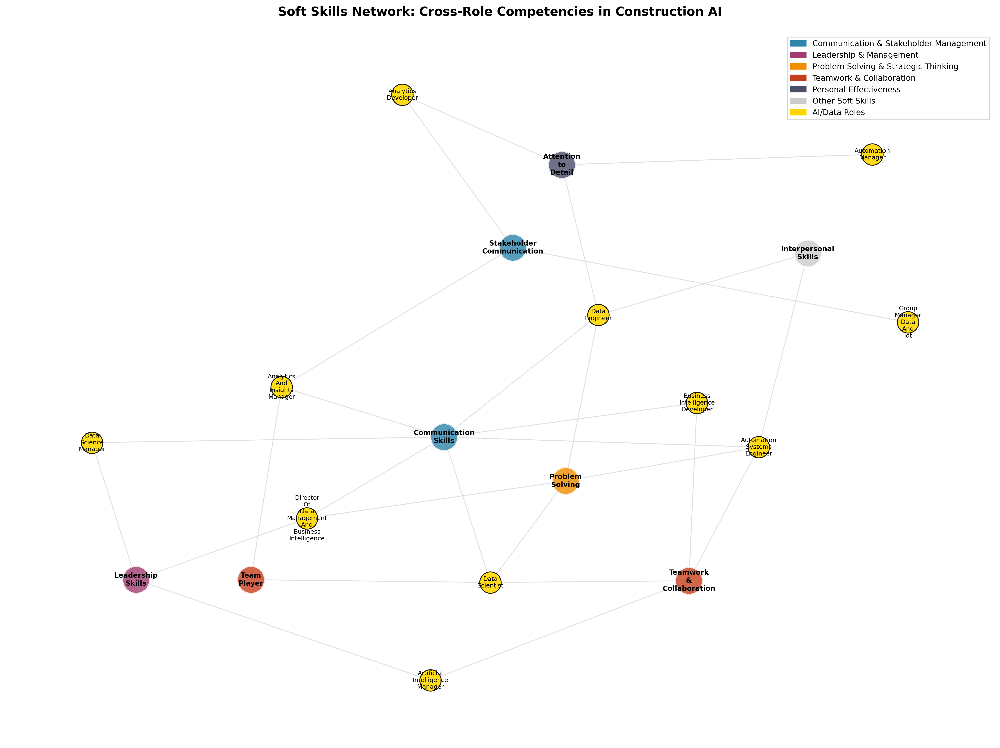

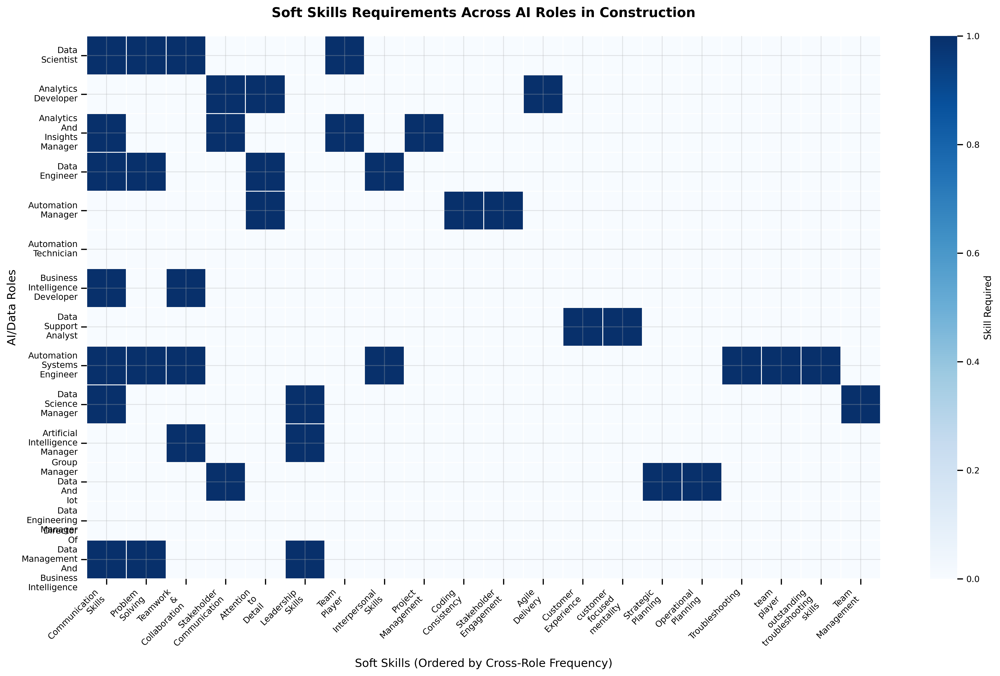


SOFT SKILLS ANALYSIS COMPLETE!


In [ ]:
# Soft Skills Analysis for 14 AI Roles
# Author: Dr. M. Reza Hosseini
# Purpose: Extract and analyze soft skills across the 14 AI roles

import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
from collections import defaultdict, Counter
import os
from datetime import datetime

# Set academic publication style
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Calibri', 'DejaVu Sans'],
    'font.size': 10,
    'axes.titlesize': 12,
    'axes.labelsize': 10,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.titlesize': 14,
    'text.usetex': False,
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight'
})

print("SOFT SKILLS ANALYSIS FOR 14 AI ROLES")
print("=" * 50)

# Load the enhanced graph
enhanced_graph_path = '/content/drive/MyDrive/knowledge-graph-llms/graph_backups/enhanced_knowledge_graph_final.graphml'
G = nx.read_graphml(enhanced_graph_path)

# Define the 14 target roles
target_roles = [
    "Data Scientist",
    "Analytics Developer",
    "Analytics And Insights Manager",
    "Data Engineer",
    "Automation Manager",
    "Automation Technician",
    "Business Intelligence Developer",
    "Data Support Analyst",
    "Automation Systems Engineer",
    "Data Science Manager",
    "Artificial Intelligence Manager",
    "Group Manager Data And Iot",
    "Data Engineering Manager",
    "Director Of Data Management And Business Intelligence"
]

def find_role_nodes(graph, target_roles):
    """Find the actual nodes for target roles"""
    role_nodes = {}

    for node, data in graph.nodes(data=True):
        role_name = data.get('id', '')
        if role_name in target_roles:
            role_nodes[role_name] = {
                'node': node,
                'data': data,
                'degree': graph.degree(node)
            }

    print(f"Found {len(role_nodes)} target role nodes")
    return role_nodes

def extract_soft_skills(graph, role_nodes):
    """Extract all soft skills connected to the 14 AI roles"""

    print("\nExtracting soft skills for each role...")

    # Dictionary to store skills for each role
    role_soft_skills = {}
    all_soft_skills = set()
    skill_to_roles = defaultdict(list)

    for role_name, role_info in role_nodes.items():
        node = role_info['node']
        soft_skills = []

        # Get all neighbors (connected nodes)
        neighbors = list(graph.neighbors(node))

        for neighbor in neighbors:
            neighbor_data = graph.nodes[neighbor]
            neighbor_labels = neighbor_data.get('labels', '')
            neighbor_id = neighbor_data.get('id', str(neighbor))

            # Check if it's a soft skill
            if ':Soft skill' in neighbor_labels:
                soft_skills.append(neighbor_id)
                all_soft_skills.add(neighbor_id)
                skill_to_roles[neighbor_id].append(role_name)

        role_soft_skills[role_name] = sorted(soft_skills)
        print(f"  {role_name}: {len(soft_skills)} soft skills")

    print(f"\nTotal unique soft skills: {len(all_soft_skills)}")

    return role_soft_skills, all_soft_skills, skill_to_roles

def standardize_soft_skills(all_soft_skills, skill_to_roles):
    """Standardize and categorize soft skills"""

    print("\nStandardizing soft skills...")

    # Soft skill standardization mapping
    soft_skill_mapping = {
        # Communication skills
        'Communication': 'Communication Skills',
        'Verbal Communication': 'Communication Skills',
        'Written Communication': 'Communication Skills',
        'Presentation Skills': 'Communication Skills',
        'Stakeholder Management': 'Stakeholder Communication',
        'Client Relationship Management': 'Stakeholder Communication',
        'Customer Service': 'Stakeholder Communication',

        # Leadership & Management
        'Leadership': 'Leadership Skills',
        'Team Leadership': 'Leadership Skills',
        'Project Management': 'Project Management',
        'Team Management': 'Team Management',
        'People Management': 'Team Management',
        'Management': 'Team Management',
        'Coaching': 'Leadership Skills',
        'Mentoring': 'Leadership Skills',

        # Problem Solving & Analysis
        'Problem-Solving': 'Problem Solving',
        'Problem Solving': 'Problem Solving',
        'Critical Thinking': 'Analytical Thinking',
        'Analytical Thinking': 'Analytical Thinking',
        'Strategic Thinking': 'Strategic Planning',
        'Decision Making': 'Decision Making',

        # Collaboration & Teamwork
        'Collaboration': 'Teamwork & Collaboration',
        'Team Collaboration': 'Teamwork & Collaboration',
        'Teamwork': 'Teamwork & Collaboration',
        'Cross-Functional Collaboration': 'Teamwork & Collaboration',
        'Working In Teams': 'Teamwork & Collaboration',

        # Adaptability & Learning
        'Adaptability': 'Adaptability',
        'Flexibility': 'Adaptability',
        'Learning Agility': 'Continuous Learning',
        'Continuous Learning': 'Continuous Learning',
        'Curiosity': 'Continuous Learning',
        'Eager To Learn': 'Continuous Learning',

        # Personal Qualities
        'Attention To Detail': 'Attention to Detail',
        'Time Management': 'Time Management',
        'Multi-Tasking': 'Time Management',
        'Organization': 'Organizational Skills',
        'Self-Motivation': 'Self-Motivation',
        'Initiative': 'Self-Motivation',
        'Reliability': 'Reliability',
        'Integrity': 'Professional Ethics'
    }

    # Apply standardization
    standardized_skills = {}
    for skill in all_soft_skills:
        standardized_name = soft_skill_mapping.get(skill, skill)
        standardized_skills[skill] = standardized_name

    # Merge skills with same standardized names
    merged_skill_to_roles = defaultdict(set)
    for original_skill, roles in skill_to_roles.items():
        standardized_name = standardized_skills[original_skill]
        for role in roles:
            merged_skill_to_roles[standardized_name].add(role)

    # Convert sets back to lists
    final_skill_to_roles = {skill: list(roles) for skill, roles in merged_skill_to_roles.items()}

    print(f"Standardized from {len(all_soft_skills)} to {len(final_skill_to_roles)} unique soft skills")

    return final_skill_to_roles, standardized_skills

def categorize_soft_skills(skill_name):
    """Categorize soft skills into major groups"""

    skill_lower = skill_name.lower()

    if any(term in skill_lower for term in ['communication', 'presentation', 'stakeholder']):
        return 'Communication & Stakeholder Management'
    elif any(term in skill_lower for term in ['leadership', 'management', 'coaching', 'mentoring']):
        return 'Leadership & Management'
    elif any(term in skill_lower for term in ['problem', 'analytical', 'critical', 'strategic', 'decision']):
        return 'Problem Solving & Strategic Thinking'
    elif any(term in skill_lower for term in ['collaboration', 'teamwork', 'team']):
        return 'Teamwork & Collaboration'
    elif any(term in skill_lower for term in ['adaptability', 'flexibility', 'learning', 'curiosity']):
        return 'Adaptability & Learning'
    elif any(term in skill_lower for term in ['time', 'organization', 'detail', 'multi-task']):
        return 'Personal Effectiveness'
    elif any(term in skill_lower for term in ['motivation', 'initiative', 'reliability', 'integrity', 'ethics']):
        return 'Personal Qualities'
    else:
        return 'Other Soft Skills'

def create_soft_skills_network():
    """Create network visualization of soft skills and roles"""

    print("\nCreating soft skills network...")

    # Filter for soft skills connected to 2+ roles
    core_soft_skills = {skill: roles for skill, roles in final_skill_to_roles.items()
                       if len(roles) >= 2}

    print(f"Found {len(core_soft_skills)} soft skills connected to multiple roles")

    # Create network
    G_soft = nx.Graph()

    # Add soft skills as nodes
    skill_nodes = []
    for skill in core_soft_skills.keys():
        G_soft.add_node(skill, node_type='skill', category=categorize_soft_skills(skill))
        skill_nodes.append(skill)

    # Add roles as nodes
    role_nodes = set()
    for skill, roles in core_soft_skills.items():
        for role in roles:
            if role not in role_nodes:
                G_soft.add_node(role, node_type='role')
                role_nodes.add(role)
            G_soft.add_edge(skill, role)

    # Create layout
    pos = nx.spring_layout(G_soft, k=3, iterations=200, seed=42)

    # Create visualization
    fig, ax = plt.subplots(1, 1, figsize=(16, 12))

    # Draw edges
    nx.draw_networkx_edges(G_soft, pos, edge_color='#CCCCCC', width=1, alpha=0.6, ax=ax)

    # Color scheme for skill categories
    category_colors = {
        'Communication & Stakeholder Management': '#2E86AB',
        'Leadership & Management': '#A23B72',
        'Problem Solving & Strategic Thinking': '#F18F01',
        'Teamwork & Collaboration': '#C73E1D',
        'Adaptability & Learning': '#6A994E',
        'Personal Effectiveness': '#4A4E69',
        'Personal Qualities': '#8B5A2B',
        'Other Soft Skills': '#CCCCCC'
    }

    # Draw skill nodes by category
    for category, color in category_colors.items():
        category_skills = [skill for skill in skill_nodes
                          if categorize_soft_skills(skill) == category]
        if category_skills:
            skill_positions = {skill: pos[skill] for skill in category_skills}
            nx.draw_networkx_nodes(G_soft, skill_positions, nodelist=category_skills,
                                  node_color=color, node_size=1000, alpha=0.8,
                                  linewidths=2, edgecolors='white', ax=ax)

    # Draw role nodes
    role_positions = {role: pos[role] for role in role_nodes}
    nx.draw_networkx_nodes(G_soft, role_positions, nodelist=list(role_nodes),
                          node_color='#FFD700', node_size=600, alpha=0.9,
                          linewidths=1, edgecolors='black', ax=ax)

    # Add labels
    skill_labels = {skill: skill.replace(' ', '\n') for skill in skill_nodes}
    role_labels = {role: role.replace(' ', '\n') for role in role_nodes}

    nx.draw_networkx_labels(G_soft, pos, labels=skill_labels, font_size=8,
                           font_weight='bold', ax=ax)
    nx.draw_networkx_labels(G_soft, pos, labels=role_labels, font_size=7, ax=ax)

    # Create legend
    legend_elements = [mpatches.Patch(color=color, label=category)
                      for category, color in category_colors.items()
                      if any(categorize_soft_skills(skill) == category for skill in skill_nodes)]
    legend_elements.append(mpatches.Patch(color='#FFD700', label='AI/Data Roles'))

    ax.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1, 1))

    ax.set_title('Soft Skills Network: Cross-Role Competencies in Construction AI',
                fontsize=14, fontweight='bold', pad=20)

    # Remove axes
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

    plt.tight_layout()

    return fig, core_soft_skills

def create_soft_skills_heatmap():
    """Create heatmap showing soft skills requirements by role"""

    print("\nCreating soft skills heatmap...")

    # Get top soft skills by frequency
    top_soft_skills = sorted(final_skill_to_roles.items(),
                           key=lambda x: len(x[1]), reverse=True)[:20]

    # Create matrix
    heatmap_data = []

    for role in target_roles:
        role_data = {'Role': role}
        for skill_name, _ in top_soft_skills:
            has_skill = 1 if role in final_skill_to_roles.get(skill_name, []) else 0
            role_data[skill_name] = has_skill
        heatmap_data.append(role_data)

    heatmap_df = pd.DataFrame(heatmap_data)
    heatmap_df = heatmap_df.set_index('Role')

    # Create heatmap
    fig, ax = plt.subplots(1, 1, figsize=(16, 10))

    sns.heatmap(heatmap_df, annot=False, cmap='Blues', cbar_kws={'label': 'Skill Required'},
                linewidths=0.5, ax=ax)

    ax.set_title('Soft Skills Requirements Across AI Roles in Construction',
                fontsize=14, fontweight='bold', pad=20)
    ax.set_xlabel('Soft Skills (Ordered by Cross-Role Frequency)', fontsize=12)
    ax.set_ylabel('AI/Data Roles', fontsize=12)

    # Improve labels
    ax.set_xticklabels([label.get_text().replace(' ', '\n') for label in ax.get_xticklabels()],
                       rotation=45, ha='right', fontsize=9)
    ax.set_yticklabels([label.get_text().replace(' ', '\n') for label in ax.get_yticklabels()],
                       rotation=0, fontsize=9)

    plt.tight_layout()

    return fig, heatmap_df

def generate_soft_skills_analysis():
    """Generate comprehensive soft skills analysis"""

    print("\nGenerating soft skills analysis...")

    # Create analysis summary
    analysis_data = []

    for skill, roles in final_skill_to_roles.items():
        role_count = len(roles)
        category = categorize_soft_skills(skill)

        # Categorize connected roles
        management_roles = sum(1 for role in roles
                             if any(term in role.lower() for term in ['manager', 'director']))
        technical_roles = sum(1 for role in roles
                            if any(term in role.lower() for term in ['scientist', 'engineer', 'developer']))
        support_roles = role_count - management_roles - technical_roles

        analysis_data.append({
            'Soft_Skill': skill,
            'Category': category,
            'Total_Roles': role_count,
            'Management_Roles': management_roles,
            'Technical_Roles': technical_roles,
            'Support_Roles': support_roles,
            'Connected_Roles': '; '.join(sorted(roles))
        })

    analysis_df = pd.DataFrame(analysis_data)
    analysis_df = analysis_df.sort_values('Total_Roles', ascending=False)

    print(f"\nSOFT SKILLS ANALYSIS SUMMARY:")
    print(f"Total unique soft skills: {len(analysis_df)}")
    print(f"Average skills per role: {sum(analysis_df['Total_Roles']) / len(target_roles):.1f}")

    print(f"\nTOP 10 MOST CONNECTED SOFT SKILLS:")
    for _, row in analysis_df.head(10).iterrows():
        print(f"  {row['Soft_Skill']}: {row['Total_Roles']} roles ({row['Category']})")

    print(f"\nSOFT SKILLS BY CATEGORY:")
    category_counts = analysis_df['Category'].value_counts()
    for category, count in category_counts.items():
        print(f"  {category}: {count} skills")

    return analysis_df

def save_soft_skills_analysis(analysis_df, figures, figure_names):
    """Save soft skills analysis results"""

    # Create directory
    appendices_dir = '/content/drive/MyDrive/knowledge-graph-llms/Appendices'
    os.makedirs(appendices_dir, exist_ok=True)

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    # Save analysis data
    analysis_path = os.path.join(appendices_dir, f'soft_skills_analysis_{timestamp}.csv')
    analysis_df.to_csv(analysis_path, index=False)

    current_analysis = os.path.join(appendices_dir, 'current_soft_skills_analysis.csv')
    analysis_df.to_csv(current_analysis, index=False)

    # Save figures
    figures_dir = '/content/drive/MyDrive/knowledge-graph-llms/academic_figures'
    os.makedirs(figures_dir, exist_ok=True)

    for fig, name in zip(figures, figure_names):
        pdf_path = os.path.join(figures_dir, f'{name}_{timestamp}.pdf')
        fig.savefig(pdf_path, format='pdf', dpi=600, bbox_inches='tight')

        current_pdf = os.path.join(figures_dir, f'{name}_current.pdf')
        fig.savefig(current_pdf, format='pdf', dpi=600, bbox_inches='tight')

    print(f"\nFiles saved:")
    print(f"  Analysis: {os.path.basename(analysis_path)}")
    print(f"  Current reference: current_soft_skills_analysis.csv")
    print(f"  Figures: {', '.join(figure_names)}")

# Execute the analysis
print("Starting soft skills analysis...")

# Extract role nodes
role_nodes = find_role_nodes(G, target_roles)

# Extract soft skills
role_soft_skills, all_soft_skills, skill_to_roles = extract_soft_skills(G, role_nodes)

# Standardize soft skills
final_skill_to_roles, standardized_skills = standardize_soft_skills(all_soft_skills, skill_to_roles)

# Create visualizations
fig1, core_soft_skills = create_soft_skills_network()
fig2, heatmap_data = create_soft_skills_heatmap()

# Generate analysis
analysis_df = generate_soft_skills_analysis()

# Save results
figures = [fig1, fig2]
figure_names = ['soft_skills_network', 'soft_skills_heatmap']
save_soft_skills_analysis(analysis_df, figures, figure_names)

plt.show()

print(f"\nSOFT SKILLS ANALYSIS COMPLETE!")
print("=" * 50)

In [ ]:
# Soft Skills Analysis for 14 AI Roles
# Author: Dr. M. Reza Hosseini
# Purpose: Extract and analyze soft skills across the 14 AI roles

import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
from collections import defaultdict, Counter
import os
from datetime import datetime

# Set academic publication style
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Calibri', 'DejaVu Sans'],
    'font.size': 10,
    'axes.titlesize': 12,
    'axes.labelsize': 10,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,
    'figure.titlesize': 14,
    'text.usetex': False,
    'figure.dpi': 300,
    'savefig.dpi': 600,
    'savefig.bbox': 'tight'
})

print("SOFT SKILLS ANALYSIS FOR 14 AI ROLES")
print("=" * 50)

# Load the enhanced graph
enhanced_graph_path = '/content/drive/MyDrive/knowledge-graph-llms/graph_backups/enhanced_knowledge_graph_final.graphml'
G = nx.read_graphml(enhanced_graph_path)

# Define the 14 target roles
target_roles = [
    "Data Scientist",
    "Analytics Developer",
    "Analytics And Insights Manager",
    "Data Engineer",
    "Automation Manager",
    "Automation Technician",
    "Business Intelligence Developer",
    "Data Support Analyst",
    "Automation Systems Engineer",
    "Data Science Manager",
    "Artificial Intelligence Manager",
    "Group Manager Data And Iot",
    "Data Engineering Manager",
    "Director Of Data Management And Business Intelligence"
]

def find_role_nodes(graph, target_roles):
    """Find the actual nodes for target roles"""
    role_nodes = {}

    for node, data in graph.nodes(data=True):
        role_name = data.get('id', '')
        if role_name in target_roles:
            role_nodes[role_name] = {
                'node': node,
                'data': data,
                'degree': graph.degree(node)
            }

    print(f"Found {len(role_nodes)} target role nodes")
    return role_nodes

def extract_soft_skills(graph, role_nodes):
    """Extract all soft skills connected to the 14 AI roles"""

    print("\nExtracting soft skills for each role...")

    # Dictionary to store skills for each role
    role_soft_skills = {}
    all_soft_skills = set()
    skill_to_roles = defaultdict(list)

    for role_name, role_info in role_nodes.items():
        node = role_info['node']
        soft_skills = []

        # Get all neighbors (connected nodes)
        neighbors = list(graph.neighbors(node))

        for neighbor in neighbors:
            neighbor_data = graph.nodes[neighbor]
            neighbor_labels = neighbor_data.get('labels', '')
            neighbor_id = neighbor_data.get('id', str(neighbor))

            # Check if it's a soft skill
            if ':Soft skill' in neighbor_labels:
                soft_skills.append(neighbor_id)
                all_soft_skills.add(neighbor_id)
                skill_to_roles[neighbor_id].append(role_name)

        role_soft_skills[role_name] = sorted(soft_skills)
        print(f"  {role_name}: {len(soft_skills)} soft skills")

    print(f"\nTotal unique soft skills: {len(all_soft_skills)}")

    return role_soft_skills, all_soft_skills, skill_to_roles

def standardize_soft_skills(all_soft_skills, skill_to_roles):
    """Standardize and categorize soft skills"""

    print("\nStandardizing soft skills...")

    # Soft skill standardization mapping
    soft_skill_mapping = {
        # Communication skills
        'Communication': 'Communication Skills',
        'Verbal Communication': 'Communication Skills',
        'Written Communication': 'Communication Skills',
        'Presentation Skills': 'Communication Skills',
        'Stakeholder Management': 'Stakeholder Communication',
        'Client Relationship Management': 'Stakeholder Communication',
        'Customer Service': 'Stakeholder Communication',

        # Leadership & Management
        'Leadership': 'Leadership Skills',
        'Team Leadership': 'Leadership Skills',
        'Project Management': 'Project Management',
        'Team Management': 'Team Management',
        'People Management': 'Team Management',
        'Management': 'Team Management',
        'Coaching': 'Leadership Skills',
        'Mentoring': 'Leadership Skills',

        # Problem Solving & Analysis
        'Problem-Solving': 'Problem Solving',
        'Problem Solving': 'Problem Solving',
        'Critical Thinking': 'Analytical Thinking',
        'Analytical Thinking': 'Analytical Thinking',
        'Strategic Thinking': 'Strategic Planning',
        'Decision Making': 'Decision Making',

        # Collaboration & Teamwork
        'Collaboration': 'Teamwork & Collaboration',
        'Team Collaboration': 'Teamwork & Collaboration',
        'Teamwork': 'Teamwork & Collaboration',
        'Cross-Functional Collaboration': 'Teamwork & Collaboration',
        'Working In Teams': 'Teamwork & Collaboration',

        # Adaptability & Learning
        'Adaptability': 'Adaptability',
        'Flexibility': 'Adaptability',
        'Learning Agility': 'Continuous Learning',
        'Continuous Learning': 'Continuous Learning',
        'Curiosity': 'Continuous Learning',
        'Eager To Learn': 'Continuous Learning',

        # Personal Qualities
        'Attention To Detail': 'Attention to Detail',
        'Time Management': 'Time Management',
        'Multi-Tasking': 'Time Management',
        'Organization': 'Organizational Skills',
        'Self-Motivation': 'Self-Motivation',
        'Initiative': 'Self-Motivation',
        'Reliability': 'Reliability',
        'Integrity': 'Professional Ethics'
    }

    # Apply standardization
    standardized_skills = {}
    for skill in all_soft_skills:
        standardized_name = soft_skill_mapping.get(skill, skill)
        standardized_skills[skill] = standardized_name

    # Merge skills with same standardized names
    merged_skill_to_roles = defaultdict(set)
    for original_skill, roles in skill_to_roles.items():
        standardized_name = standardized_skills[original_skill]
        for role in roles:
            merged_skill_to_roles[standardized_name].add(role)

    # Convert sets back to lists
    final_skill_to_roles = {skill: list(roles) for skill, roles in merged_skill_to_roles.items()}

    print(f"Standardized from {len(all_soft_skills)} to {len(final_skill_to_roles)} unique soft skills")

    return final_skill_to_roles, standardized_skills

def categorize_soft_skills(skill_name):
    """Categorize soft skills into major groups"""

    skill_lower = skill_name.lower()

    if any(term in skill_lower for term in ['communication', 'presentation', 'stakeholder']):
        return 'Communication & Stakeholder Management'
    elif any(term in skill_lower for term in ['leadership', 'management', 'coaching', 'mentoring']):
        return 'Leadership & Management'
    elif any(term in skill_lower for term in ['problem', 'analytical', 'critical', 'strategic', 'decision']):
        return 'Problem Solving & Strategic Thinking'
    elif any(term in skill_lower for term in ['collaboration', 'teamwork', 'team']):
        return 'Teamwork & Collaboration'
    elif any(term in skill_lower for term in ['adaptability', 'flexibility', 'learning', 'curiosity']):
        return 'Adaptability & Learning'
    elif any(term in skill_lower for term in ['time', 'organization', 'detail', 'multi-task']):
        return 'Personal Effectiveness'
    elif any(term in skill_lower for term in ['motivation', 'initiative', 'reliability', 'integrity', 'ethics']):
        return 'Personal Qualities'
    else:
        return 'Other Soft Skills'

def create_soft_skills_network():
    """Create network visualization of soft skills and roles"""

    print("\nCreating soft skills network...")

    # Filter for soft skills connected to 2+ roles
    core_soft_skills = {skill: roles for skill, roles in final_skill_to_roles.items()
                       if len(roles) >= 2}

    print(f"Found {len(core_soft_skills)} soft skills connected to multiple roles")

    # Create network
    G_soft = nx.Graph()

    # Add soft skills as nodes
    skill_nodes = []
    for skill in core_soft_skills.keys():
        G_soft.add_node(skill, node_type='skill', category=categorize_soft_skills(skill))
        skill_nodes.append(skill)

    # Add roles as nodes
    role_nodes = set()
    for skill, roles in core_soft_skills.items():
        for role in roles:
            if role not in role_nodes:
                G_soft.add_node(role, node_type='role')
                role_nodes.add(role)
            G_soft.add_edge(skill, role)

    # Create layout
    pos = nx.spring_layout(G_soft, k=3, iterations=200, seed=42)

    # Create visualization
    fig, ax = plt.subplots(1, 1, figsize=(16, 12))

    # Draw edges
    nx.draw_networkx_edges(G_soft, pos, edge_color='#CCCCCC', width=1, alpha=0.6, ax=ax)

    # Color scheme for skill categories
    category_colors = {
        'Communication & Stakeholder Management': '#2E86AB',
        'Leadership & Management': '#A23B72',
        'Problem Solving & Strategic Thinking': '#F18F01',
        'Teamwork & Collaboration': '#C73E1D',
        'Adaptability & Learning': '#6A994E',
        'Personal Effectiveness': '#4A4E69',
        'Personal Qualities': '#8B5A2B',
        'Other Soft Skills': '#CCCCCC'
    }

    # Draw skill nodes by category
    for category, color in category_colors.items():
        category_skills = [skill for skill in skill_nodes
                          if categorize_soft_skills(skill) == category]
        if category_skills:
            skill_positions = {skill: pos[skill] for skill in category_skills}
            nx.draw_networkx_nodes(G_soft, skill_positions, nodelist=category_skills,
                                  node_color=color, node_size=1000, alpha=0.8,
                                  linewidths=2, edgecolors='white', ax=ax)

    # Draw role nodes
    role_positions = {role: pos[role] for role in role_nodes}
    nx.draw_networkx_nodes(G_soft, role_positions, nodelist=list(role_nodes),
                          node_color='#FFD700', node_size=600, alpha=0.9,
                          linewidths=1, edgecolors='black', ax=ax)

    # Add labels
    skill_labels = {skill: skill.replace(' ', '\n') for skill in skill_nodes}
    role_labels = {role: role.replace(' ', '\n') for role in role_nodes}

    nx.draw_networkx_labels(G_soft, pos, labels=skill_labels, font_size=8,
                           font_weight='bold', ax=ax)
    nx.draw_networkx_labels(G_soft, pos, labels=role_labels, font_size=7, ax=ax)

    # Create legend
    legend_elements = [mpatches.Patch(color=color, label=category)
                      for category, color in category_colors.items()
                      if any(categorize_soft_skills(skill) == category for skill in skill_nodes)]
    legend_elements.append(mpatches.Patch(color='#FFD700', label='AI/Data Roles'))

    ax.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(1, 1))

    ax.set_title('Soft Skills Network: Cross-Role Competencies in Construction AI',
                fontsize=14, fontweight='bold', pad=20)

    # Remove axes
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)

    plt.tight_layout()

    return fig, core_soft_skills

def create_enhanced_soft_skills_heatmap():
    """Create enhanced heatmap with soft skills on Y-axis for journal publication"""

    print("\nCreating enhanced soft skills heatmap for journal publication...")

    # Get all soft skills sorted by frequency (most connected first)
    all_soft_skills_sorted = sorted(final_skill_to_roles.items(),
                                   key=lambda x: len(x[1]), reverse=True)

    # Create matrix with soft skills on Y-axis, roles on X-axis
    heatmap_data = []

    for skill_name, connected_roles in all_soft_skills_sorted:
        skill_data = {'Soft_Skill': skill_name}

        # Add data for each role (1 if required, 0 if not)
        for role in target_roles:
            has_skill = 1 if role in connected_roles else 0
            skill_data[role] = has_skill

        # Add total count for reference
        skill_data['Total_Roles'] = len(connected_roles)
        heatmap_data.append(skill_data)

    # Convert to DataFrame with soft skills as index
    heatmap_df = pd.DataFrame(heatmap_data)
    heatmap_df = heatmap_df.set_index('Soft_Skill')

    # Remove Total_Roles column for plotting
    plot_df = heatmap_df.drop('Total_Roles', axis=1)

    # Create the enhanced heatmap
    fig, ax = plt.subplots(1, 1, figsize=(16, 12))  # Larger figure for journal quality

    # Create heatmap with enhanced styling
    sns.heatmap(plot_df,
                annot=False,  # No numbers for cleaner look
                cmap='Blues',  # Professional blue color scheme
                cbar_kws={'label': 'Skill Required', 'shrink': 0.8},
                linewidths=0.5,  # Thin lines between cells
                linecolor='white',  # White grid lines
                square=False,  # Allow rectangular cells
                ax=ax)

    # Customize the plot for journal publication
    ax.set_xlabel('AI/Data Roles in Construction', fontsize=14, fontweight='normal', labelpad=15)
    ax.set_ylabel('Soft Skills', fontsize=14, fontweight='normal', labelpad=15)

    # Format Y-axis labels (soft skills) - full names, larger font
    skill_labels = []
    for skill in plot_df.index:
        # Keep full skill names, just clean up formatting
        if len(skill) > 25:  # Only break very long skill names
            words = skill.split()
            if len(words) > 3:
                mid = len(words) // 2
                wrapped = ' '.join(words[:mid]) + '\n' + ' '.join(words[mid:])
                skill_labels.append(wrapped)
            else:
                skill_labels.append(skill)
        else:
            skill_labels.append(skill)

    ax.set_yticklabels(skill_labels, rotation=0, fontsize=11, fontweight='normal')

    # Format X-axis labels (roles) - abbreviated for space
    role_abbreviations = {
        'Data Scientist': 'Data\nScientist',
        'Analytics Developer': 'Analytics\nDeveloper',
        'Analytics And Insights Manager': 'Analytics &\nInsights Mgr',
        'Data Engineer': 'Data\nEngineer',
        'Automation Manager': 'Automation\nManager',
        'Automation Technician': 'Automation\nTechnician',
        'Business Intelligence Developer': 'BI\nDeveloper',
        'Data Support Analyst': 'Data Support\nAnalyst',
        'Automation Systems Engineer': 'Automation\nSystems Eng',
        'Data Science Manager': 'Data Science\nManager',
        'Artificial Intelligence Manager': 'AI\nManager',
        'Group Manager Data And Iot': 'Data & IoT\nManager',
        'Data Engineering Manager': 'Data Eng\nManager',
        'Director Of Data Management And Business Intelligence': 'Director\nData & BI'
    }

    abbreviated_labels = [role_abbreviations.get(role, role.replace(' ', '\n'))
                         for role in plot_df.columns]
    ax.set_xticklabels(abbreviated_labels, rotation=45, ha='right', fontsize=10, fontweight='normal')

    # Add frequency annotations on the right side
    for i, skill in enumerate(plot_df.index):
        total = heatmap_df.loc[skill, 'Total_Roles']
        ax.text(len(plot_df.columns) + 0.2, i + 0.5, f'({total})',
                ha='left', va='center', fontsize=9, color='darkblue', fontweight='bold')

    # Add frequency label
    ax.text(len(plot_df.columns) + 0.2, -1, 'Roles\nCount',
            ha='left', va='center', fontsize=10, fontweight='bold', color='darkblue')

    # Customize colorbar
    cbar = ax.collections[0].colorbar
    cbar.set_ticks([0, 1])
    cbar.set_ticklabels(['Not Required', 'Required'])
    cbar.ax.tick_params(labelsize=10)

    # Add subtle border around the heatmap
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color('black')

    # Adjust layout to prevent label cutoff
    plt.tight_layout()

    # Add some padding to prevent cutoff
    plt.subplots_adjust(left=0.25, right=0.85, bottom=0.15, top=0.95)

    return fig, plot_df, heatmap_df

# Update the main execution to focus only on heatmap
print("Creating enhanced soft skills heatmap...")

# Extract role nodes
role_nodes = find_role_nodes(G, target_roles)

# Extract soft skills
role_soft_skills, all_soft_skills, skill_to_roles = extract_soft_skills(G, role_nodes)

# Standardize soft skills
final_skill_to_roles, standardized_skills = standardize_soft_skills(all_soft_skills, skill_to_roles)

# Create ONLY the enhanced heatmap
fig_heatmap, plot_data, full_data = create_enhanced_soft_skills_heatmap()

# Save the heatmap
figures_dir = '/content/drive/MyDrive/knowledge-graph-llms/academic_figures'
os.makedirs(figures_dir, exist_ok=True)

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

# Save high-resolution versions for journal
pdf_path = os.path.join(figures_dir, f'soft_skills_heatmap_journal_{timestamp}.pdf')
fig_heatmap.savefig(pdf_path, format='pdf', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')

current_pdf = os.path.join(figures_dir, 'soft_skills_heatmap_journal_current.pdf')
fig_heatmap.savefig(current_pdf, format='pdf', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')

# Also save as high-res PNG for versatility
png_path = os.path.join(figures_dir, f'soft_skills_heatmap_journal_{timestamp}.png')
fig_heatmap.savefig(png_path, format='png', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')

plt.show()

print(f"\nENHANCED SOFT SKILLS HEATMAP COMPLETE!")
print("=" * 50)
print(f"Features:")
print(f"  - Soft skills on Y-axis (full names, {len(plot_data)} skills)")
print(f"  - AI roles on X-axis (abbreviated for clarity)")
print(f"  - Professional blue color scheme")
print(f"  - Role count annotations on right side")
print(f"  - Journal publication quality (600 DPI)")
print(f"  - Figure size: 16x12 inches")
print(f"\nFiles saved:")
print(f"  - Journal PDF: soft_skills_heatmap_journal_current.pdf")
print(f"  - High-res PNG: {os.path.basename(png_path)}")

# Display key statistics
print(f"\nSOFT SKILLS STATISTICS:")
print(f"  - Total unique soft skills: {len(plot_data)}")
print(f"  - Most connected skill: {plot_data.index[0]} ({full_data.loc[plot_data.index[0], 'Total_Roles']} roles)")
print(f"  - Average skills per role: {plot_data.sum(axis=0).mean():.1f}")
print(f"  - Skills connecting to multiple roles: {(full_data['Total_Roles'] > 1).sum()}")


def generate_soft_skills_analysis():
    """Generate comprehensive soft skills analysis"""

    print("\nGenerating soft skills analysis...")

    # Create analysis summary
    analysis_data = []

    for skill, roles in final_skill_to_roles.items():
        role_count = len(roles)
        category = categorize_soft_skills(skill)

        # Categorize connected roles
        management_roles = sum(1 for role in roles
                             if any(term in role.lower() for term in ['manager', 'director']))
        technical_roles = sum(1 for role in roles
                            if any(term in role.lower() for term in ['scientist', 'engineer', 'developer']))
        support_roles = role_count - management_roles - technical_roles

        analysis_data.append({
            'Soft_Skill': skill,
            'Category': category,
            'Total_Roles': role_count,
            'Management_Roles': management_roles,
            'Technical_Roles': technical_roles,
            'Support_Roles': support_roles,
            'Connected_Roles': '; '.join(sorted(roles))
        })

    analysis_df = pd.DataFrame(analysis_data)
    analysis_df = analysis_df.sort_values('Total_Roles', ascending=False)

    print(f"\nSOFT SKILLS ANALYSIS SUMMARY:")
    print(f"Total unique soft skills: {len(analysis_df)}")
    print(f"Average skills per role: {sum(analysis_df['Total_Roles']) / len(target_roles):.1f}")

    print(f"\nTOP 10 MOST CONNECTED SOFT SKILLS:")
    for _, row in analysis_df.head(10).iterrows():
        print(f"  {row['Soft_Skill']}: {row['Total_Roles']} roles ({row['Category']})")

    print(f"\nSOFT SKILLS BY CATEGORY:")
    category_counts = analysis_df['Category'].value_counts()
    for category, count in category_counts.items():
        print(f"  {category}: {count} skills")

    return analysis_df

def save_soft_skills_analysis(analysis_df, figures, figure_names):
    """Save soft skills analysis results"""

    # Create directory
    appendices_dir = '/content/drive/MyDrive/knowledge-graph-llms/Appendices'
    os.makedirs(appendices_dir, exist_ok=True)

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    # Save analysis data
    analysis_path = os.path.join(appendices_dir, f'soft_skills_analysis_{timestamp}.csv')
    analysis_df.to_csv(analysis_path, index=False)

    current_analysis = os.path.join(appendices_dir, 'current_soft_skills_analysis.csv')
    analysis_df.to_csv(current_analysis, index=False)

    # Save figures
    figures_dir = '/content/drive/MyDrive/knowledge-graph-llms/academic_figures'
    os.makedirs(figures_dir, exist_ok=True)

    for fig, name in zip(figures, figure_names):
        pdf_path = os.path.join(figures_dir, f'{name}_{timestamp}.pdf')
        fig.savefig(pdf_path, format='pdf', dpi=600, bbox_inches='tight')

        current_pdf = os.path.join(figures_dir, f'{name}_current.pdf')
        fig.savefig(current_pdf, format='pdf', dpi=600, bbox_inches='tight')

    print(f"\nFiles saved:")
    print(f"  Analysis: {os.path.basename(analysis_path)}")
    print(f"  Current reference: current_soft_skills_analysis.csv")
    print(f"  Figures: {', '.join(figure_names)}")

# Execute the analysis
print("Starting soft skills analysis...")

# Extract role nodes
role_nodes = find_role_nodes(G, target_roles)

# Extract soft skills
role_soft_skills, all_soft_skills, skill_to_roles = extract_soft_skills(G, role_nodes)

# Standardize soft skills
final_skill_to_roles, standardized_skills = standardize_soft_skills(all_soft_skills, skill_to_roles)

# Create visualizations
fig1, core_soft_skills = create_soft_skills_network()
fig2, heatmap_data = create_soft_skills_heatmap()

# Generate analysis
analysis_df = generate_soft_skills_analysis()

# Save results
figures = [fig1, fig2]
figure_names = ['soft_skills_network', 'soft_skills_heatmap']
save_soft_skills_analysis(analysis_df, figures, figure_names)

plt.show()

print(f"\nSOFT SKILLS ANALYSIS COMPLETE!")
print("=" * 50)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Comprehensive Soft Skills Cleaning and Standardization
# Author: Dr. M. Reza Hosseini
# Purpose: Clean and standardize soft skills data for the 14 AI roles

import networkx as nx
import pandas as pd
import numpy as np
from collections import defaultdict, Counter
import re
import os
from datetime import datetime

print("COMPREHENSIVE SOFT SKILLS CLEANING AND STANDARDIZATION")
print("=" * 60)

# Load the enhanced graph
enhanced_graph_path = '/content/drive/MyDrive/knowledge-graph-llms/graph_backups/enhanced_knowledge_graph_final.graphml'
G = nx.read_graphml(enhanced_graph_path)

# Define the 14 target roles
target_roles = [
    "Data Scientist", "Analytics Developer", "Analytics And Insights Manager",
    "Data Engineer", "Automation Manager", "Automation Technician",
    "Business Intelligence Developer", "Data Support Analyst",
    "Automation Systems Engineer", "Data Science Manager",
    "Artificial Intelligence Manager", "Group Manager Data And Iot",
    "Data Engineering Manager", "Director Of Data Management And Business Intelligence"
]

def find_role_nodes(graph, target_roles):
    """Find the actual nodes for target roles"""
    role_nodes = {}
    for node, data in graph.nodes(data=True):
        role_name = data.get('id', '')
        if role_name in target_roles:
            role_nodes[role_name] = {'node': node, 'data': data}
    print(f"Found {len(role_nodes)} target role nodes")
    return role_nodes

def extract_raw_soft_skills(graph, role_nodes):
    """Extract all raw soft skills without any processing"""

    print("\nExtracting raw soft skills...")

    role_soft_skills = {}
    all_soft_skills = set()
    skill_to_roles = defaultdict(list)

    for role_name, role_info in role_nodes.items():
        node = role_info['node']
        soft_skills = []

        neighbors = list(graph.neighbors(node))
        for neighbor in neighbors:
            neighbor_data = graph.nodes[neighbor]
            neighbor_labels = neighbor_data.get('labels', '')
            neighbor_id = neighbor_data.get('id', str(neighbor))

            if ':Soft skill' in neighbor_labels:
                soft_skills.append(neighbor_id)
                all_soft_skills.add(neighbor_id)
                skill_to_roles[neighbor_id].append(role_name)

        role_soft_skills[role_name] = sorted(soft_skills)
        print(f"  {role_name}: {len(soft_skills)} raw soft skills")

    print(f"\nTotal raw soft skills found: {len(all_soft_skills)}")
    return role_soft_skills, all_soft_skills, skill_to_roles

def analyze_soft_skills_for_cleaning(all_soft_skills):
    """Analyze soft skills to identify cleaning needs"""

    print(f"\nANALYZING SOFT SKILLS FOR CLEANING:")
    print("=" * 40)

    # Sort skills alphabetically for easier analysis
    sorted_skills = sorted(all_soft_skills)

    # Categorize problems
    case_variations = []
    similar_skills = []
    technical_skills = []
    meaningless_skills = []

    # Check for case variations
    skills_lower = {}
    for skill in sorted_skills:
        skill_lower = skill.lower()
        if skill_lower in skills_lower:
            case_variations.append((skills_lower[skill_lower], skill))
        else:
            skills_lower[skill_lower] = skill

    print(f"CASE VARIATIONS FOUND: {len(case_variations)}")
    for original, variant in case_variations[:10]:  # Show first 10
        print(f"  '{original}' vs '{variant}'")
    if len(case_variations) > 10:
        print(f"  ... and {len(case_variations) - 10} more")

    # Check for technical skills that should be moved
    technical_indicators = [
        'agile', 'scrum', 'coding', 'programming', 'technical', 'software',
        'system', 'database', 'api', 'framework', 'methodology', 'development',
        'devops', 'ci/cd', 'version control', 'testing', 'debugging'
    ]

    for skill in sorted_skills:
        skill_lower = skill.lower()
        if any(indicator in skill_lower for indicator in technical_indicators):
            technical_skills.append(skill)

    print(f"\nTECHNICAL SKILLS MISCLASSIFIED: {len(technical_skills)}")
    for skill in technical_skills[:10]:
        print(f"  '{skill}'")
    if len(technical_skills) > 10:
        print(f"  ... and {len(technical_skills) - 10} more")

    # Check for meaningless/vague skills
    meaningless_indicators = [
        'career growth', 'develop strong', 'good', 'excellent', 'outstanding',
        'ability to', 'experience in', 'knowledge of', 'understanding of',
        'familiarity with', 'exposure to', 'working knowledge'
    ]

    for skill in sorted_skills:
        skill_lower = skill.lower()
        if any(indicator in skill_lower for indicator in meaningless_indicators):
            meaningless_skills.append(skill)

    print(f"\nMEANINGLESS/VAGUE SKILLS: {len(meaningless_skills)}")
    for skill in meaningless_skills[:10]:
        print(f"  '{skill}'")
    if len(meaningless_skills) > 10:
        print(f"  ... and {len(meaningless_skills) - 10} more")

    # Look for similar skills (simple similarity check)
    print(f"\nPOTENTIAL SIMILAR SKILLS:")
    checked = set()
    for i, skill1 in enumerate(sorted_skills):
        if skill1 in checked:
            continue
        similar_group = [skill1]
        skill1_words = set(skill1.lower().split())

        for skill2 in sorted_skills[i+1:]:
            if skill2 in checked:
                continue
            skill2_words = set(skill2.lower().split())

            # Check if they share significant words
            common_words = skill1_words & skill2_words
            if len(common_words) > 0 and (len(common_words) >= len(skill1_words) * 0.5 or
                                        len(common_words) >= len(skill2_words) * 0.5):
                similar_group.append(skill2)
                checked.add(skill2)

        if len(similar_group) > 1:
            similar_skills.append(similar_group)
            checked.add(skill1)

    for group in similar_skills[:10]:
        print(f"  Similar: {group}")
    if len(similar_skills) > 10:
        print(f"  ... and {len(similar_skills) - 10} more groups")

    print(f"\nALL RAW SOFT SKILLS (first 30):")
    for i, skill in enumerate(sorted_skills[:30]):
        print(f"  {i+1:2d}. '{skill}'")
    if len(sorted_skills) > 30:
        print(f"  ... and {len(sorted_skills) - 30} more")

    return {
        'case_variations': case_variations,
        'technical_skills': technical_skills,
        'meaningless_skills': meaningless_skills,
        'similar_skills': similar_skills,
        'all_skills': sorted_skills
    }

def create_comprehensive_cleaning_rules():
    """Create comprehensive cleaning and standardization rules"""

    print(f"\nCREATING COMPREHENSIVE CLEANING RULES...")

    # Skills to remove completely (technical skills, meaningless, etc.)
    skills_to_remove = {
        # Technical skills that should be in technical category
        'Agile Delivery', 'Agile Methodology', 'Agile', 'Scrum', 'Devops',
        'Coding Consistency', 'Programming', 'Software Development',
        'Technical Leadership', 'Technical Knowledge', 'Technical Skills',
        'System Analysis', 'Database Management', 'API Development',
        'Version Control', 'Testing', 'Debugging', 'Quality Assurance',
        'Software Testing', 'Code Review', 'Technical Documentation',

        # Meaningless/vague skills
        'Career Growth', 'Develop Strong', 'Good', 'Excellent', 'Outstanding',
        'Ability To', 'Experience In', 'Knowledge Of', 'Understanding Of',
        'Familiarity With', 'Exposure To', 'Working Knowledge', 'Good Understanding',
        'Strong Background', 'Demonstrated Experience', 'Proven Experience',
        'Track Record', 'Background In', 'Experience With', 'Knowledge In',

        # Too specific/not transferable
        'Mining Industry Experience', 'Construction Experience', 'Oil And Gas Experience',
        'Manufacturing Experience', 'Automotive Experience', 'Healthcare Experience',

        # Redundant qualifiers
        'Outstanding Troubleshooting', 'Excellent Communication', 'Strong Leadership',
        'Good Problem Solving', 'Effective Communication', 'Strong Analytical',
    }

    # Standardization mapping (original -> standardized)
    standardization_mapping = {
        # Communication variations
        'Communication': 'Communication Skills',
        'Verbal Communication': 'Communication Skills',
        'Written Communication': 'Communication Skills',
        'Oral Communication': 'Communication Skills',
        'Communication Skills': 'Communication Skills',
        'Effective Communication': 'Communication Skills',
        'Excellent Communication': 'Communication Skills',
        'Strong Communication': 'Communication Skills',
        'Interpersonal Skills': 'Interpersonal Communication',
        'Interpersonal Communication': 'Interpersonal Communication',
        'Interpersonal Abilities': 'Interpersonal Communication',
        'People Skills': 'Interpersonal Communication',
        'Social Skills': 'Interpersonal Communication',

        # Leadership variations
        'Leadership': 'Leadership Skills',
        'Leadership Skills': 'Leadership Skills',
        'Team Leadership': 'Leadership Skills',
        'Strong Leadership': 'Leadership Skills',
        'Leadership Abilities': 'Leadership Skills',
        'Leadership Capability': 'Leadership Skills',
        'Management': 'Management Skills',
        'Management Skills': 'Management Skills',
        'People Management': 'Management Skills',
        'Team Management': 'Management Skills',
        'Staff Management': 'Management Skills',

        # Problem solving variations
        'Problem-Solving': 'Problem Solving',
        'Problem Solving': 'Problem Solving',
        'Problem-Solving Skills': 'Problem Solving',
        'Problem Solving Skills': 'Problem Solving',
        'Good Problem Solving': 'Problem Solving',
        'Strong Problem Solving': 'Problem Solving',
        'Troubleshooting': 'Problem Solving',
        'Outstanding Troubleshooting': 'Problem Solving',
        'Issue Resolution': 'Problem Solving',
        'Conflict Resolution': 'Problem Solving',

        # Teamwork variations
        'Teamwork': 'Teamwork & Collaboration',
        'Team Player': 'Teamwork & Collaboration',
        'Team Work': 'Teamwork & Collaboration',
        'Collaboration': 'Teamwork & Collaboration',
        'Collaborative': 'Teamwork & Collaboration',
        'Team Collaboration': 'Teamwork & Collaboration',
        'Cross-Functional Collaboration': 'Teamwork & Collaboration',
        'Working In Teams': 'Teamwork & Collaboration',
        'Team Building': 'Teamwork & Collaboration',

        # Analytical thinking variations
        'Analytical Thinking': 'Analytical Skills',
        'Analytical Skills': 'Analytical Skills',
        'Critical Thinking': 'Analytical Skills',
        'Strategic Thinking': 'Strategic Planning',
        'Strategic Planning': 'Strategic Planning',
        'Decision Making': 'Decision Making',
        'Decision-Making': 'Decision Making',
        'Sound Judgement': 'Decision Making',
        'Good Judgement': 'Decision Making',

        # Adaptability variations
        'Adaptability': 'Adaptability',
        'Flexibility': 'Adaptability',
        'Flexible': 'Adaptability',
        'Adaptable': 'Adaptability',
        'Change Management': 'Adaptability',
        'Resilience': 'Resilience',
        'Resilient': 'Resilience',

        # Learning variations
        'Learning Agility': 'Continuous Learning',
        'Continuous Learning': 'Continuous Learning',
        'Lifelong Learning': 'Continuous Learning',
        'Curiosity': 'Continuous Learning',
        'Eager To Learn': 'Continuous Learning',
        'Willingness To Learn': 'Continuous Learning',
        'Learning Orientation': 'Continuous Learning',

        # Personal effectiveness
        'Attention To Detail': 'Attention to Detail',
        'Detail Oriented': 'Attention to Detail',
        'Detail-Oriented': 'Attention to Detail',
        'Time Management': 'Time Management',
        'Time Management Skills': 'Time Management',
        'Multi-Tasking': 'Multitasking',
        'Multitasking': 'Multitasking',
        'Multi-Task': 'Multitasking',
        'Organization': 'Organizational Skills',
        'Organizational Skills': 'Organizational Skills',
        'Planning': 'Planning Skills',
        'Planning Skills': 'Planning Skills',

        # Initiative and motivation
        'Initiative': 'Initiative',
        'Self-Motivated': 'Self-Motivation',
        'Self-Motivation': 'Self-Motivation',
        'Proactive': 'Initiative',
        'Self-Starter': 'Initiative',
        'Drive': 'Self-Motivation',
        'Motivation': 'Self-Motivation',

        # Stakeholder management
        'Stakeholder Management': 'Stakeholder Management',
        'Client Management': 'Stakeholder Management',
        'Customer Service': 'Customer Service',
        'Customer Focus': 'Customer Service',
        'Client Relations': 'Stakeholder Management',
        'Relationship Building': 'Relationship Building',
        'Networking': 'Relationship Building',

        # Professional qualities
        'Professionalism': 'Professionalism',
        'Professional': 'Professionalism',
        'Integrity': 'Integrity',
        'Ethics': 'Professional Ethics',
        'Ethical': 'Professional Ethics',
        'Reliability': 'Reliability',
        'Reliable': 'Reliability',
        'Accountability': 'Accountability',
        'Responsible': 'Accountability',
        'Punctuality': 'Reliability',
    }

    return skills_to_remove, standardization_mapping

def apply_comprehensive_cleaning(all_soft_skills, skill_to_roles):
    """Apply comprehensive cleaning to soft skills"""

    print(f"\nAPPLYING COMPREHENSIVE CLEANING...")

    skills_to_remove, standardization_mapping = create_comprehensive_cleaning_rules()

    # Track cleaning actions
    removed_count = 0
    standardized_count = 0
    unchanged_count = 0

    cleaned_skill_to_roles = defaultdict(set)

    for original_skill, roles in skill_to_roles.items():
        # Check if skill should be removed
        if original_skill in skills_to_remove:
            print(f"  REMOVED: '{original_skill}' (reason: inappropriate for soft skills)")
            removed_count += 1
            continue

        # Check for case-insensitive removal
        if any(original_skill.lower() == remove_skill.lower() for remove_skill in skills_to_remove):
            print(f"  REMOVED: '{original_skill}' (reason: case-insensitive match)")
            removed_count += 1
            continue

        # Apply standardization
        standardized_skill = standardization_mapping.get(original_skill, original_skill)

        if standardized_skill != original_skill:
            print(f"  STANDARDIZED: '{original_skill}' → '{standardized_skill}'")
            standardized_count += 1
        else:
            unchanged_count += 1

        # Add to cleaned mapping
        for role in roles:
            cleaned_skill_to_roles[standardized_skill].add(role)

    # Convert sets back to lists and sort
    final_cleaned_skills = {}
    for skill, roles in cleaned_skill_to_roles.items():
        final_cleaned_skills[skill] = sorted(list(roles))

    print(f"\nCLEANING SUMMARY:")
    print(f"  Original skills: {len(all_soft_skills)}")
    print(f"  Removed: {removed_count}")
    print(f"  Standardized: {standardized_count}")
    print(f"  Unchanged: {unchanged_count}")
    print(f"  Final cleaned skills: {len(final_cleaned_skills)}")

    return final_cleaned_skills

def generate_cleaning_report(original_skills, cleaned_skills):
    """Generate comprehensive cleaning report"""

    print(f"\nCOMPREHENSIVE CLEANING REPORT:")
    print("=" * 40)

    print(f"BEFORE CLEANING:")
    print(f"  Total skills: {len(original_skills)}")

    print(f"\nAFTER CLEANING:")
    print(f"  Total skills: {len(cleaned_skills)}")
    print(f"  Reduction: {len(original_skills) - len(cleaned_skills)} skills")
    print(f"  Reduction rate: {((len(original_skills) - len(cleaned_skills)) / len(original_skills)) * 100:.1f}%")

    print(f"\nTOP 15 CLEANED SOFT SKILLS:")
    sorted_cleaned = sorted(cleaned_skills.items(), key=lambda x: len(x[1]), reverse=True)
    for i, (skill, roles) in enumerate(sorted_cleaned[:15]):
        print(f"  {i+1:2d}. {skill}: {len(roles)} roles")

    print(f"\nSOFT SKILLS BY CONNECTIVITY:")
    connectivity_dist = Counter(len(roles) for roles in cleaned_skills.values())
    for conn_count in sorted(connectivity_dist.keys(), reverse=True):
        skill_count = connectivity_dist[conn_count]
        print(f"  {conn_count} roles: {skill_count} skills")

    return sorted_cleaned

def save_cleaned_soft_skills(cleaned_skills, original_skills):
    """Save cleaned soft skills analysis"""

    appendices_dir = '/content/drive/MyDrive/knowledge-graph-llms/Appendices'
    os.makedirs(appendices_dir, exist_ok=True)

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    # Create comprehensive analysis DataFrame
    analysis_data = []
    for skill, roles in cleaned_skills.items():
        # Categorize roles
        management_roles = sum(1 for role in roles
                             if any(term in role.lower() for term in ['manager', 'director']))
        technical_roles = sum(1 for role in roles
                            if any(term in role.lower() for term in ['scientist', 'engineer', 'developer']))
        support_roles = len(roles) - management_roles - technical_roles

        analysis_data.append({
            'Soft_Skill': skill,
            'Total_Roles': len(roles),
            'Management_Roles': management_roles,
            'Technical_Roles': technical_roles,
            'Support_Roles': support_roles,
            'Connected_Roles': '; '.join(sorted(roles))
        })

    analysis_df = pd.DataFrame(analysis_data)
    analysis_df = analysis_df.sort_values('Total_Roles', ascending=False)

    # Save files
    analysis_path = os.path.join(appendices_dir, f'cleaned_soft_skills_analysis_{timestamp}.csv')
    analysis_df.to_csv(analysis_path, index=False)

    current_analysis = os.path.join(appendices_dir, 'current_cleaned_soft_skills_analysis.csv')
    analysis_df.to_csv(current_analysis, index=False)

    # Create detailed cleaning report
    report_path = os.path.join(appendices_dir, f'soft_skills_cleaning_report_{timestamp}.txt')
    with open(report_path, 'w') as f:
        f.write("SOFT SKILLS CLEANING AND STANDARDIZATION REPORT\n")
        f.write("=" * 50 + "\n\n")
        f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")

        f.write(f"CLEANING SUMMARY:\n")
        f.write(f"Original soft skills: {len(original_skills)}\n")
        f.write(f"Cleaned soft skills: {len(cleaned_skills)}\n")
        f.write(f"Skills removed: {len(original_skills) - len(cleaned_skills)}\n")
        f.write(f"Reduction rate: {((len(original_skills) - len(cleaned_skills)) / len(original_skills)) * 100:.1f}%\n\n")

        f.write(f"CLEANED SOFT SKILLS (ordered by connectivity):\n")
        f.write("-" * 40 + "\n")
        for skill, roles in sorted(cleaned_skills.items(), key=lambda x: len(x[1]), reverse=True):
            f.write(f"{skill}: {len(roles)} roles - {', '.join(roles)}\n")

    print(f"\nFiles saved:")
    print(f"  - Cleaned analysis: {os.path.basename(analysis_path)}")
    print(f"  - Current reference: current_cleaned_soft_skills_analysis.csv")
    print(f"  - Cleaning report: {os.path.basename(report_path)}")

    return analysis_df

# Execute the comprehensive cleaning process
print("Starting comprehensive soft skills cleaning...")

# Extract role nodes and raw soft skills
role_nodes = find_role_nodes(G, target_roles)
role_soft_skills, all_soft_skills, skill_to_roles = extract_raw_soft_skills(G, role_nodes)

# Analyze soft skills to understand cleaning needs
cleaning_analysis = analyze_soft_skills_for_cleaning(all_soft_skills)

# Apply comprehensive cleaning
cleaned_skills = apply_comprehensive_cleaning(all_soft_skills, skill_to_roles)

# Generate cleaning report
sorted_cleaned_skills = generate_cleaning_report(all_soft_skills, cleaned_skills)

# Save results
analysis_df = save_cleaned_soft_skills(cleaned_skills, all_soft_skills)

print(f"\n🎉 COMPREHENSIVE SOFT SKILLS CLEANING COMPLETE!")
print("=" * 60)
print(f"Ready for high-quality heatmap generation with clean, standardized soft skills!")
print(f"Use 'current_cleaned_soft_skills_analysis.csv' for the enhanced heatmap.")

COMPREHENSIVE SOFT SKILLS CLEANING AND STANDARDIZATION
Starting comprehensive soft skills cleaning...
Found 14 target role nodes

Extracting raw soft skills...
  Analytics And Insights Manager: 4 raw soft skills
  Automation Manager: 3 raw soft skills
  Analytics Developer: 3 raw soft skills
  Data Support Analyst: 2 raw soft skills
  Group Manager Data And Iot: 3 raw soft skills
  Automation Systems Engineer: 8 raw soft skills
  Data Science Manager: 3 raw soft skills
  Artificial Intelligence Manager: 5 raw soft skills
  Data Engineering Manager: 0 raw soft skills
  Business Intelligence Developer: 3 raw soft skills
  Director Of Data Management And Business Intelligence: 3 raw soft skills
  Automation Technician: 0 raw soft skills
  Data Engineer: 5 raw soft skills
  Data Scientist: 11 raw soft skills

Total raw soft skills found: 37

ANALYZING SOFT SKILLS FOR CLEANING:
CASE VARIATIONS FOUND: 1
  'Team Player' vs 'team player'

TECHNICAL SKILLS MISCLASSIFIED: 3
  'Agile Delivery'
  

COMPREHENSIVE SOFT SKILLS CLEANING AND STANDARDIZATION

Creating publication-quality heatmap with cleaned data...

Creating publication-quality heatmap with CLEANED DATA...
Using 27 cleaned soft skills

SKILLS TO BE USED IN HEATMAP:
  - Communication Skills: 7 roles
  - Project Management: 1 roles
  - Stakeholder Management: 3 roles
  - Teamwork & Collaboration: 5 roles
  - Attention to Detail: 3 roles
  - Stakeholder Engagement: 1 roles
  - Customer Experience: 1 roles
  - customer focused mentality: 1 roles
  - Strategic Planning: 1 roles
  - Operational Planning: 1 roles
  - Problem Solving: 4 roles
  - Interpersonal Communication: 2 roles
  - team player: 1 roles
  - outstanding troubleshooting skills: 1 roles
  - Leadership Skills: 2 roles
  - Management Skills: 1 roles
  - Coaching: 1 roles
  - working closely together: 1 roles
  - progression: 1 roles
  - Deadline Management: 1 roles
  - Develop Strong Working Relationships: 1 roles
  - Continuous Learning: 1 roles
  - Relations

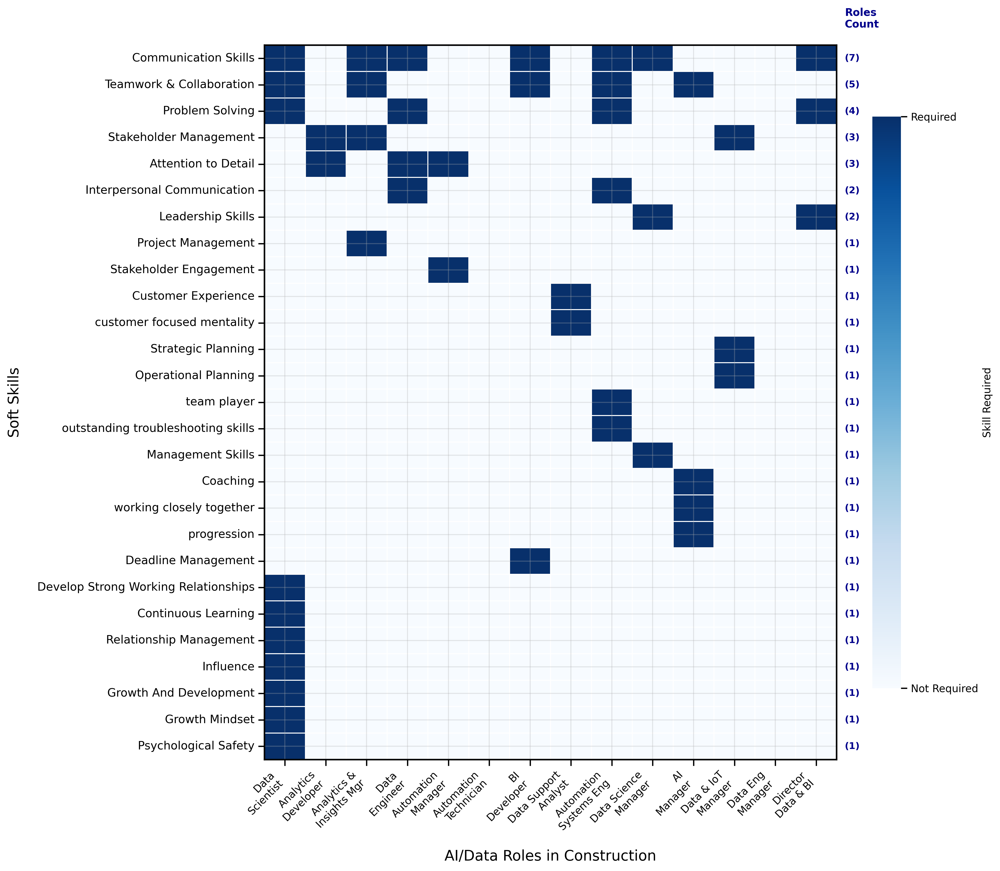


CLEANED SOFT SKILLS HEATMAP COMPLETE!
Features:
  - Clean, standardized soft skills on Y-axis (27 skills)
  - No technical skills, no meaningless qualifiers
  - Professional layout for journal publication
  - 600 DPI resolution, 16x12 inches

Top 10 Most Important Soft Skills:
   1. Communication Skills: 7 roles
   2. Teamwork & Collaboration: 5 roles
   3. Problem Solving: 4 roles
   4. Stakeholder Management: 3 roles
   5. Attention to Detail: 3 roles
   6. Interpersonal Communication: 2 roles
   7. Leadership Skills: 2 roles
   8. Project Management: 1 roles
   9. Stakeholder Engagement: 1 roles
  10. Customer Experience: 1 roles

Files saved:
  - Journal PDF: cleaned_soft_skills_heatmap_journal_current.pdf
  - High-res PNG: cleaned_soft_skills_heatmap_journal_20250709_081624.png


In [ ]:
# Comprehensive Soft Skills Cleaning and Standardization
# Author: Dr. M. Reza Hosseini
# Purpose: Clean and standardize soft skills data for the 14 AI roles

import networkx as nx
import pandas as pd
import numpy as np
from collections import defaultdict, Counter
import re
import os
from datetime import datetime

print("COMPREHENSIVE SOFT SKILLS CLEANING AND STANDARDIZATION")
print("=" * 60)

# Load the enhanced graph
enhanced_graph_path = '/content/drive/MyDrive/knowledge-graph-llms/graph_backups/enhanced_knowledge_graph_final.graphml'
G = nx.read_graphml(enhanced_graph_path)

# Define the 14 target roles
target_roles = [
    "Data Scientist", "Analytics Developer", "Analytics And Insights Manager",
    "Data Engineer", "Automation Manager", "Automation Technician",
    "Business Intelligence Developer", "Data Support Analyst",
    "Automation Systems Engineer", "Data Science Manager",
    "Artificial Intelligence Manager", "Group Manager Data And Iot",
    "Data Engineering Manager", "Director Of Data Management And Business Intelligence"
]

def find_role_nodes(graph, target_roles):
    """Find the actual nodes for target roles"""
    role_nodes = {}
    for node, data in graph.nodes(data=True):
        role_name = data.get('id', '')
        if role_name in target_roles:
            role_nodes[role_name] = {'node': node, 'data': data}
    print(f"Found {len(role_nodes)} target role nodes")
    return role_nodes

def extract_raw_soft_skills(graph, role_nodes):
    """Extract all raw soft skills without any processing"""

    print("\nExtracting raw soft skills...")

    role_soft_skills = {}
    all_soft_skills = set()
    skill_to_roles = defaultdict(list)

    for role_name, role_info in role_nodes.items():
        node = role_info['node']
        soft_skills = []

        neighbors = list(graph.neighbors(node))
        for neighbor in neighbors:
            neighbor_data = graph.nodes[neighbor]
            neighbor_labels = neighbor_data.get('labels', '')
            neighbor_id = neighbor_data.get('id', str(neighbor))

            if ':Soft skill' in neighbor_labels:
                soft_skills.append(neighbor_id)
                all_soft_skills.add(neighbor_id)
                skill_to_roles[neighbor_id].append(role_name)

        role_soft_skills[role_name] = sorted(soft_skills)
        print(f"  {role_name}: {len(soft_skills)} raw soft skills")

    print(f"\nTotal raw soft skills found: {len(all_soft_skills)}")
    return role_soft_skills, all_soft_skills, skill_to_roles

def analyze_soft_skills_for_cleaning(all_soft_skills):
    """Analyze soft skills to identify cleaning needs"""

    print(f"\nANALYZING SOFT SKILLS FOR CLEANING:")
    print("=" * 40)

    # Sort skills alphabetically for easier analysis
    sorted_skills = sorted(all_soft_skills)

    # Categorize problems
    case_variations = []
    similar_skills = []
    technical_skills = []
    meaningless_skills = []

    # Check for case variations
    skills_lower = {}
    for skill in sorted_skills:
        skill_lower = skill.lower()
        if skill_lower in skills_lower:
            case_variations.append((skills_lower[skill_lower], skill))
        else:
            skills_lower[skill_lower] = skill

    print(f"CASE VARIATIONS FOUND: {len(case_variations)}")
    for original, variant in case_variations[:10]:  # Show first 10
        print(f"  '{original}' vs '{variant}'")
    if len(case_variations) > 10:
        print(f"  ... and {len(case_variations) - 10} more")

    # Check for technical skills that should be moved
    technical_indicators = [
        'agile', 'scrum', 'coding', 'programming', 'technical', 'software',
        'system', 'database', 'api', 'framework', 'methodology', 'development',
        'devops', 'ci/cd', 'version control', 'testing', 'debugging'
    ]

    for skill in sorted_skills:
        skill_lower = skill.lower()
        if any(indicator in skill_lower for indicator in technical_indicators):
            technical_skills.append(skill)

    print(f"\nTECHNICAL SKILLS MISCLASSIFIED: {len(technical_skills)}")
    for skill in technical_skills[:10]:
        print(f"  '{skill}'")
    if len(technical_skills) > 10:
        print(f"  ... and {len(technical_skills) - 10} more")

    # Check for meaningless/vague skills
    meaningless_indicators = [
        'career growth', 'develop strong', 'good', 'excellent', 'outstanding',
        'ability to', 'experience in', 'knowledge of', 'understanding of',
        'familiarity with', 'exposure to', 'working knowledge'
    ]

    for skill in sorted_skills:
        skill_lower = skill.lower()
        if any(indicator in skill_lower for indicator in meaningless_indicators):
            meaningless_skills.append(skill)

    print(f"\nMEANINGLESS/VAGUE SKILLS: {len(meaningless_skills)}")
    for skill in meaningless_skills[:10]:
        print(f"  '{skill}'")
    if len(meaningless_skills) > 10:
        print(f"  ... and {len(meaningless_skills) - 10} more")

    # Look for similar skills (simple similarity check)
    print(f"\nPOTENTIAL SIMILAR SKILLS:")
    checked = set()
    for i, skill1 in enumerate(sorted_skills):
        if skill1 in checked:
            continue
        similar_group = [skill1]
        skill1_words = set(skill1.lower().split())

        for skill2 in sorted_skills[i+1:]:
            if skill2 in checked:
                continue
            skill2_words = set(skill2.lower().split())

            # Check if they share significant words
            common_words = skill1_words & skill2_words
            if len(common_words) > 0 and (len(common_words) >= len(skill1_words) * 0.5 or
                                        len(common_words) >= len(skill2_words) * 0.5):
                similar_group.append(skill2)
                checked.add(skill2)

        if len(similar_group) > 1:
            similar_skills.append(similar_group)
            checked.add(skill1)

    for group in similar_skills[:10]:
        print(f"  Similar: {group}")
    if len(similar_skills) > 10:
        print(f"  ... and {len(similar_skills) - 10} more groups")

    print(f"\nALL RAW SOFT SKILLS (first 30):")
    for i, skill in enumerate(sorted_skills[:30]):
        print(f"  {i+1:2d}. '{skill}'")
    if len(sorted_skills) > 30:
        print(f"  ... and {len(sorted_skills) - 30} more")

    return {
        'case_variations': case_variations,
        'technical_skills': technical_skills,
        'meaningless_skills': meaningless_skills,
        'similar_skills': similar_skills,
        'all_skills': sorted_skills
    }

def create_comprehensive_cleaning_rules():
    """Create comprehensive cleaning and standardization rules - IMPROVED VERSION"""

    print(f"\nCREATING IMPROVED COMPREHENSIVE CLEANING RULES...")

    # Skills to remove completely (technical skills, meaningless, etc.)
    skills_to_remove = {
        # Technical skills that should be in technical category
        'Agile Delivery', 'Agile Methodology', 'Agile', 'Scrum', 'Devops',
        'Coding Consistency', 'Programming', 'Software Development',
        'Technical Leadership', 'Technical Knowledge', 'Technical Skills',
        'System Analysis', 'Database Management', 'API Development',
        'Version Control', 'Testing', 'Debugging', 'Quality Assurance',
        'Software Testing', 'Code Review', 'Technical Documentation',
        'Growth And Development',  # This is too vague/meaningless

        # Meaningless/vague skills and qualifiers
        'Career Growth', 'Develop Strong', 'Good', 'Excellent', 'Outstanding',
        'Ability To', 'Experience In', 'Knowledge Of', 'Understanding Of',
        'Familiarity With', 'Exposure To', 'Working Knowledge', 'Good Understanding',
        'Strong Background', 'Demonstrated Experience', 'Proven Experience',
        'Track Record', 'Background In', 'Experience With', 'Knowledge In',
        'Develop Strong Working Relationships',  # Too vague
        'outstanding troubleshooting skills',  # Has qualifier + should be problem solving

        # Too specific/not transferable
        'Mining Industry Experience', 'Construction Experience', 'Oil And Gas Experience',
        'Manufacturing Experience', 'Automotive Experience', 'Healthcare Experience',

        # Case variations that should be removed
        'career growth', 'team player',  # Will be standardized to proper versions
    }

    # Standardization mapping (original -> standardized)
    standardization_mapping = {
        # Communication variations
        'Communication': 'Communication Skills',
        'Verbal Communication': 'Communication Skills',
        'Written Communication': 'Communication Skills',
        'Oral Communication': 'Communication Skills',
        'Communication Skills': 'Communication Skills',
        'Effective Communication': 'Communication Skills',
        'Excellent Communication': 'Communication Skills',
        'Strong Communication': 'Communication Skills',
        'Interpersonal Skills': 'Interpersonal Communication',
        'Interpersonal Communication': 'Interpersonal Communication',
        'Interpersonal Abilities': 'Interpersonal Communication',
        'People Skills': 'Interpersonal Communication',
        'Social Skills': 'Interpersonal Communication',

        # Leadership variations
        'Leadership': 'Leadership Skills',
        'Leadership Skills': 'Leadership Skills',
        'Team Leadership': 'Leadership Skills',
        'Strong Leadership': 'Leadership Skills',
        'Leadership Abilities': 'Leadership Skills',
        'Leadership Capability': 'Leadership Skills',
        'Coaching': 'Leadership Skills',  # Coaching is a leadership skill
        'Mentoring': 'Leadership Skills',
        'Influence': 'Leadership Skills',  # Influence is a leadership skill

        # Management variations
        'Management': 'Management Skills',
        'Management Skills': 'Management Skills',
        'People Management': 'Management Skills',
        'Team Management': 'Management Skills',
        'Staff Management': 'Management Skills',
        'Relationship Management': 'Stakeholder Management',  # More specific

        # Problem solving variations
        'Problem-Solving': 'Problem Solving',
        'Problem Solving': 'Problem Solving',
        'Problem-Solving Skills': 'Problem Solving',
        'Problem Solving Skills': 'Problem Solving',
        'Good Problem Solving': 'Problem Solving',
        'Strong Problem Solving': 'Problem Solving',
        'Troubleshooting': 'Problem Solving',
        'Outstanding Troubleshooting': 'Problem Solving',
        'outstanding troubleshooting skills': 'Problem Solving',  # From our data
        'Issue Resolution': 'Problem Solving',
        'Conflict Resolution': 'Problem Solving',

        # Teamwork variations
        'Teamwork': 'Teamwork & Collaboration',
        'Team Player': 'Teamwork & Collaboration',
        'team player': 'Teamwork & Collaboration',  # Case variation from our data
        'Team Work': 'Teamwork & Collaboration',
        'Collaboration': 'Teamwork & Collaboration',
        'Collaborative': 'Teamwork & Collaboration',
        'Team Collaboration': 'Teamwork & Collaboration',
        'Cross-Functional Collaboration': 'Teamwork & Collaboration',
        'Working In Teams': 'Teamwork & Collaboration',
        'Team Building': 'Teamwork & Collaboration',

        # Planning and management
        'Project Management': 'Project Management',
        'Deadline Management': 'Project Management',  # Part of project management
        'Strategic Planning': 'Strategic Planning',
        'Operational Planning': 'Strategic Planning',  # Consolidate planning skills
        'Planning': 'Strategic Planning',
        'Planning Skills': 'Strategic Planning',

        # Stakeholder and customer focus
        'Stakeholder Management': 'Stakeholder Management',
        'Stakeholder Engagement': 'Stakeholder Management',  # Similar skill
        'Client Management': 'Stakeholder Management',
        'Customer Service': 'Customer Focus',
        'Customer Focus': 'Customer Focus',
        'Customer Experience': 'Customer Focus',  # From our data
        'customer focused mentality': 'Customer Focus',  # From our data, standardize
        'Client Relations': 'Stakeholder Management',
        'Relationship Building': 'Stakeholder Management',
        'Networking': 'Stakeholder Management',

        # Personal effectiveness
        'Attention To Detail': 'Attention to Detail',
        'Detail Oriented': 'Attention to Detail',
        'Detail-Oriented': 'Attention to Detail',
        'Time Management': 'Time Management',
        'Time Management Skills': 'Time Management',
        'Multi-Tasking': 'Time Management',  # Part of time management
        'Multitasking': 'Time Management',
        'Multi-Task': 'Time Management',
        'Organization': 'Organizational Skills',
        'Organizational Skills': 'Organizational Skills',

        # Learning and growth
        'Learning Agility': 'Continuous Learning',
        'Continuous Learning': 'Continuous Learning',
        'Lifelong Learning': 'Continuous Learning',
        'Curiosity': 'Continuous Learning',
        'Eager To Learn': 'Continuous Learning',
        'Willingness To Learn': 'Continuous Learning',
        'Learning Orientation': 'Continuous Learning',
        'Growth Mindset': 'Continuous Learning',  # From our data

        # Adaptability
        'Adaptability': 'Adaptability',
        'Flexibility': 'Adaptability',
        'Flexible': 'Adaptability',
        'Adaptable': 'Adaptability',
        'Change Management': 'Adaptability',
        'Resilience': 'Adaptability',  # Related to adaptability
        'Resilient': 'Adaptability',

        # Professional qualities
        'Professionalism': 'Professionalism',
        'Professional': 'Professionalism',
        'Integrity': 'Professional Ethics',
        'Ethics': 'Professional Ethics',
        'Ethical': 'Professional Ethics',
        'Reliability': 'Reliability',
        'Reliable': 'Reliability',
        'Accountability': 'Accountability',
        'Responsible': 'Accountability',
        'Punctuality': 'Reliability',
        'Psychological Safety': 'Professional Ethics',  # From our data - workplace culture

        # Initiative and motivation
        'Initiative': 'Initiative',
        'Self-Motivated': 'Initiative',
        'Self-Motivation': 'Initiative',
        'Proactive': 'Initiative',
        'Self-Starter': 'Initiative',
        'Drive': 'Initiative',
        'Motivation': 'Initiative',
    }

    return skills_to_remove, standardization_mapping

def apply_comprehensive_cleaning(all_soft_skills, skill_to_roles):
    """Apply comprehensive cleaning to soft skills with enhanced consolidation"""

    print(f"\nAPPLYING COMPREHENSIVE CLEANING WITH ENHANCED CONSOLIDATION...")

    skills_to_remove, standardization_mapping = create_comprehensive_cleaning_rules()

    # ENHANCED SPECIFIC CONSOLIDATIONS - directly handle the problematic cases
    specific_consolidations = {
        # Customer focus consolidation - all variations
        'customer focused mentality': 'Customer Focus',
        'Customer Experience': 'Customer Focus',
        'customer experience': 'Customer Focus',
        'Customer Service': 'Customer Focus',
        'customer service': 'Customer Focus',

        # Team player consolidation - all variations
        'team player': 'Teamwork & Collaboration',
        'Team Player': 'Teamwork & Collaboration',
        'Team player': 'Teamwork & Collaboration',

        # Troubleshooting consolidation - all variations
        'outstanding troubleshooting skills': 'Problem Solving',
        'Outstanding troubleshooting skills': 'Problem Solving',
        'troubleshooting skills': 'Problem Solving',
        'Troubleshooting skills': 'Problem Solving',
        'Troubleshooting': 'Problem Solving',
        'troubleshooting': 'Problem Solving',

        # Planning consolidation
        'Operational Planning': 'Strategic Planning',
        'operational planning': 'Strategic Planning',
        'Deadline Management': 'Project Management',
        'deadline management': 'Project Management',

        # Management consolidation
        'Relationship Management': 'Stakeholder Management',
        'relationship management': 'Stakeholder Management',
        'Stakeholder Engagement': 'Stakeholder Management',
        'stakeholder engagement': 'Stakeholder Management',

        # Growth and learning - properly categorize
        'Growth Mindset': 'Continuous Learning',
        'growth mindset': 'Continuous Learning',
        'Growth And Development': 'Continuous Learning',  # If we keep it, make it learning
        'growth and development': 'Continuous Learning',

        # Leadership skills consolidation
        'Coaching': 'Leadership Skills',
        'coaching': 'Leadership Skills',
        'Influence': 'Leadership Skills',
        'influence': 'Leadership Skills',
        'Management Skills': 'Management Skills',
        'management skills': 'Management Skills',

        # Professional development - these might be too vague
        'working closely together': 'Teamwork & Collaboration',
        'progression': 'Continuous Learning',
        'Develop Strong Working Relationships': 'Stakeholder Management',  # If not removed

        # Case variations for existing skills
        'communication skills': 'Communication Skills',
        'Communication skills': 'Communication Skills',
        'problem solving': 'Problem Solving',
        'Problem solving': 'Problem Solving',
        'problem-solving': 'Problem Solving',
        'Problem-solving': 'Problem Solving',
        'attention to detail': 'Attention to Detail',
        'Attention to detail': 'Attention to Detail',
        'leadership skills': 'Leadership Skills',
        'Leadership skills': 'Leadership Skills',
        'project management': 'Project Management',
        'Project management': 'Project Management',
        'stakeholder management': 'Stakeholder Management',
        'Stakeholder management': 'Stakeholder Management',
        'strategic planning': 'Strategic Planning',
        'Strategic planning': 'Strategic Planning',
        'interpersonal communication': 'Interpersonal Communication',
        'Interpersonal communication': 'Interpersonal Communication',
        'continuous learning': 'Continuous Learning',
        'Continuous learning': 'Continuous Learning',
        'psychological safety': 'Professional Ethics',
        'Psychological safety': 'Professional Ethics',
        'teamwork & collaboration': 'Teamwork & Collaboration',
        'Teamwork & collaboration': 'Teamwork & Collaboration',
        'Teamwork & Collaboration': 'Teamwork & Collaboration',
        'collaboration': 'Teamwork & Collaboration',
        'Collaboration': 'Teamwork & Collaboration',
        'team collaboration': 'Teamwork & Collaboration',
        'Team collaboration': 'Teamwork & Collaboration',
        'teamwork': 'Teamwork & Collaboration',
        'Teamwork': 'Teamwork & Collaboration',
    }

    # Additional skills to remove (add the vague ones we missed)
    additional_removals = {
        'Growth And Development',  # Too vague
        'growth and development',
        'Develop Strong Working Relationships',  # Too vague
        'develop strong working relationships',
        'working closely together',  # Too vague
        'progression',  # Too vague
        'career growth',  # Too vague
        'Career growth',
    }

    # Combine all removal rules
    all_removals = skills_to_remove | additional_removals

    # Combine all consolidation rules
    all_consolidations = {**standardization_mapping, **specific_consolidations}

    # Track cleaning actions
    removed_count = 0
    consolidated_count = 0
    unchanged_count = 0

    cleaned_skill_to_roles = defaultdict(set)

    print(f"\nProcessing {len(all_soft_skills)} original soft skills...")

    for original_skill, roles in skill_to_roles.items():
        # Check if skill should be removed (exact match first)
        if original_skill in all_removals:
            print(f"  REMOVED: '{original_skill}' (exact match)")
            removed_count += 1
            continue

        # Check for case-insensitive removal
        remove_found = False
        for remove_skill in all_removals:
            if original_skill.lower() == remove_skill.lower():
                print(f"  REMOVED: '{original_skill}' (case-insensitive match with '{remove_skill}')")
                removed_count += 1
                remove_found = True
                break

        if remove_found:
            continue

        # Apply consolidation (exact match first)
        if original_skill in all_consolidations:
            consolidated_skill = all_consolidations[original_skill]
            print(f"  CONSOLIDATED: '{original_skill}' → '{consolidated_skill}' (exact match)")
            consolidated_count += 1
        else:
            # Try case-insensitive consolidation
            consolidated_skill = original_skill
            for key, value in all_consolidations.items():
                if key.lower() == original_skill.lower():
                    consolidated_skill = value
                    print(f"  CONSOLIDATED: '{original_skill}' → '{consolidated_skill}' (case-insensitive)")
                    consolidated_count += 1
                    break

            if consolidated_skill == original_skill:
                print(f"  UNCHANGED: '{original_skill}'")
                unchanged_count += 1

        # Add to cleaned mapping
        for role in roles:
            cleaned_skill_to_roles[consolidated_skill].add(role)

    # Convert sets back to lists and sort
    final_cleaned_skills = {}
    for skill, roles in cleaned_skill_to_roles.items():
        final_cleaned_skills[skill] = sorted(list(roles))

    print(f"\nENHANCED CLEANING SUMMARY:")
    print(f"  Original skills: {len(all_soft_skills)}")
    print(f"  Removed: {removed_count}")
    print(f"  Consolidated: {consolidated_count}")
    print(f"  Unchanged: {unchanged_count}")
    print(f"  Final cleaned skills: {len(final_cleaned_skills)}")

    print(f"\nFINAL CONSOLIDATED SOFT SKILLS (ordered by importance):")
    sorted_final = sorted(final_cleaned_skills.items(), key=lambda x: len(x[1]), reverse=True)
    for i, (skill, roles) in enumerate(sorted_final, 1):
        print(f"  {i:2d}. {skill}: {len(roles)} roles")

    return final_cleaned_skills

def generate_cleaning_report(original_skills, cleaned_skills):
    """Generate comprehensive cleaning report"""

    print(f"\nCOMPREHENSIVE CLEANING REPORT:")
    print("=" * 40)

    print(f"BEFORE CLEANING:")
    print(f"  Total skills: {len(original_skills)}")

    print(f"\nAFTER CLEANING:")
    print(f"  Total skills: {len(cleaned_skills)}")
    print(f"  Reduction: {len(original_skills) - len(cleaned_skills)} skills")
    print(f"  Reduction rate: {((len(original_skills) - len(cleaned_skills)) / len(original_skills)) * 100:.1f}%")

    print(f"\nTOP 15 CLEANED SOFT SKILLS:")
    sorted_cleaned = sorted(cleaned_skills.items(), key=lambda x: len(x[1]), reverse=True)
    for i, (skill, roles) in enumerate(sorted_cleaned[:15]):
        print(f"  {i+1:2d}. {skill}: {len(roles)} roles")

    print(f"\nSOFT SKILLS BY CONNECTIVITY:")
    connectivity_dist = Counter(len(roles) for roles in cleaned_skills.values())
    for conn_count in sorted(connectivity_dist.keys(), reverse=True):
        skill_count = connectivity_dist[conn_count]
        print(f"  {conn_count} roles: {skill_count} skills")

    return sorted_cleaned

def save_cleaned_soft_skills(cleaned_skills, original_skills):
    """Save cleaned soft skills analysis"""

    appendices_dir = '/content/drive/MyDrive/knowledge-graph-llms/Appendices'
    os.makedirs(appendices_dir, exist_ok=True)

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    # Create comprehensive analysis DataFrame
    analysis_data = []
    for skill, roles in cleaned_skills.items():
        # Categorize roles
        management_roles = sum(1 for role in roles
                             if any(term in role.lower() for term in ['manager', 'director']))
        technical_roles = sum(1 for role in roles
                            if any(term in role.lower() for term in ['scientist', 'engineer', 'developer']))
        support_roles = len(roles) - management_roles - technical_roles

        analysis_data.append({
            'Soft_Skill': skill,
            'Total_Roles': len(roles),
            'Management_Roles': management_roles,
            'Technical_Roles': technical_roles,
            'Support_Roles': support_roles,
            'Connected_Roles': '; '.join(sorted(roles))
        })

    analysis_df = pd.DataFrame(analysis_data)
    analysis_df = analysis_df.sort_values('Total_Roles', ascending=False)

    # Save files
    analysis_path = os.path.join(appendices_dir, f'cleaned_soft_skills_analysis_{timestamp}.csv')
    analysis_df.to_csv(analysis_path, index=False)

    current_analysis = os.path.join(appendices_dir, 'current_cleaned_soft_skills_analysis.csv')
    analysis_df.to_csv(current_analysis, index=False)

    # Create detailed cleaning report
    report_path = os.path.join(appendices_dir, f'soft_skills_cleaning_report_{timestamp}.txt')
    with open(report_path, 'w') as f:
        f.write("SOFT SKILLS CLEANING AND STANDARDIZATION REPORT\n")
        f.write("=" * 50 + "\n\n")
        f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")

        f.write(f"CLEANING SUMMARY:\n")
        f.write(f"Original soft skills: {len(original_skills)}\n")
        f.write(f"Cleaned soft skills: {len(cleaned_skills)}\n")
        f.write(f"Skills removed: {len(original_skills) - len(cleaned_skills)}\n")
        f.write(f"Reduction rate: {((len(original_skills) - len(cleaned_skills)) / len(original_skills)) * 100:.1f}%\n\n")

        f.write(f"CLEANED SOFT SKILLS (ordered by connectivity):\n")
        f.write("-" * 40 + "\n")
        for skill, roles in sorted(cleaned_skills.items(), key=lambda x: len(x[1]), reverse=True):
            f.write(f"{skill}: {len(roles)} roles - {', '.join(roles)}\n")

    print(f"\nFiles saved:")
    print(f"  - Cleaned analysis: {os.path.basename(analysis_path)}")
    print(f"  - Current reference: current_cleaned_soft_skills_analysis.csv")
    print(f"  - Cleaning report: {os.path.basename(report_path)}")

    return analysis_df

def create_publication_quality_soft_skills_heatmap(cleaned_skills):
    """Create publication-quality heatmap using the EXACT cleaned soft skills data"""

    print(f"\nCreating publication-quality heatmap with CLEANED DATA...")
    print(f"Using {len(cleaned_skills)} cleaned soft skills")

    # Debug: Show what skills we're actually using
    print(f"\nSKILLS TO BE USED IN HEATMAP:")
    for skill, roles in cleaned_skills.items():
        print(f"  - {skill}: {len(roles)} roles")

    # Load necessary libraries for heatmap
    import matplotlib.pyplot as plt
    import seaborn as sns
    import pandas as pd

    # Set style for publication
    plt.rcParams.update({
        'font.family': 'sans-serif',
        'font.sans-serif': ['Calibri', 'DejaVu Sans'],
        'font.size': 10,
        'figure.dpi': 300,
        'savefig.dpi': 600,
        'savefig.bbox': 'tight'
    })

    # Sort cleaned skills by number of connected roles (most important first)
    sorted_cleaned_skills = sorted(cleaned_skills.items(), key=lambda x: len(x[1]), reverse=True)

    print(f"\nSORTED SKILLS FOR HEATMAP:")
    for i, (skill, roles) in enumerate(sorted_cleaned_skills, 1):
        print(f"  {i:2d}. {skill}: {len(roles)} roles")

    # Create matrix with soft skills on Y-axis, roles on X-axis
    heatmap_data = []

    for skill_name, connected_roles in sorted_cleaned_skills:
        skill_data = {'Soft_Skill': skill_name}

        # Add data for each role (1 if required, 0 if not)
        for role in target_roles:
            has_skill = 1 if role in connected_roles else 0
            skill_data[role] = has_skill

        # Add total count for reference
        skill_data['Total_Roles'] = len(connected_roles)
        heatmap_data.append(skill_data)

    # Convert to DataFrame with soft skills as index
    heatmap_df = pd.DataFrame(heatmap_data)
    heatmap_df = heatmap_df.set_index('Soft_Skill')

    print(f"\nHEATMAP DATAFRAME CREATED:")
    print(f"Skills (rows): {len(heatmap_df)}")
    print(f"Roles (columns): {len(heatmap_df.columns) - 1}")  # -1 for Total_Roles column

    # Remove Total_Roles column for plotting
    plot_df = heatmap_df.drop('Total_Roles', axis=1)

    # Create the enhanced heatmap
    fig, ax = plt.subplots(1, 1, figsize=(16, 12))  # Large figure for journal quality

    # Create heatmap with enhanced styling
    sns.heatmap(plot_df,
                annot=False,  # No numbers for cleaner look
                cmap='Blues',  # Professional blue color scheme
                cbar_kws={'label': 'Skill Required', 'shrink': 0.8},
                linewidths=0.5,  # Thin lines between cells
                linecolor='white',  # White grid lines
                square=False,  # Allow rectangular cells
                ax=ax)

    # Customize for journal publication
    ax.set_xlabel('AI/Data Roles in Construction', fontsize=14, fontweight='normal', labelpad=15)
    ax.set_ylabel('Soft Skills', fontsize=14, fontweight='normal', labelpad=15)

    # Format Y-axis labels (soft skills) - full names
    ax.set_yticklabels(plot_df.index, rotation=0, fontsize=11, fontweight='normal')

    # Format X-axis labels (roles) - abbreviated for space
    role_abbreviations = {
        'Data Scientist': 'Data\nScientist',
        'Analytics Developer': 'Analytics\nDeveloper',
        'Analytics And Insights Manager': 'Analytics &\nInsights Mgr',
        'Data Engineer': 'Data\nEngineer',
        'Automation Manager': 'Automation\nManager',
        'Automation Technician': 'Automation\nTechnician',
        'Business Intelligence Developer': 'BI\nDeveloper',
        'Data Support Analyst': 'Data Support\nAnalyst',
        'Automation Systems Engineer': 'Automation\nSystems Eng',
        'Data Science Manager': 'Data Science\nManager',
        'Artificial Intelligence Manager': 'AI\nManager',
        'Group Manager Data And Iot': 'Data & IoT\nManager',
        'Data Engineering Manager': 'Data Eng\nManager',
        'Director Of Data Management And Business Intelligence': 'Director\nData & BI'
    }

    abbreviated_labels = [role_abbreviations.get(role, role.replace(' ', '\n'))
                         for role in plot_df.columns]
    ax.set_xticklabels(abbreviated_labels, rotation=45, ha='right', fontsize=10, fontweight='normal')

    # Add frequency annotations on the right side
    for i, skill in enumerate(plot_df.index):
        total = heatmap_df.loc[skill, 'Total_Roles']
        ax.text(len(plot_df.columns) + 0.2, i + 0.5, f'({total})',
                ha='left', va='center', fontsize=9, color='darkblue', fontweight='bold')

    # Add frequency label
    ax.text(len(plot_df.columns) + 0.2, -1, 'Roles\nCount',
            ha='left', va='center', fontsize=10, fontweight='bold', color='darkblue')

    # Customize colorbar
    cbar = ax.collections[0].colorbar
    cbar.set_ticks([0, 1])
    cbar.set_ticklabels(['Not Required', 'Required'])
    cbar.ax.tick_params(labelsize=10)

    # Add border around the heatmap
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.5)
        spine.set_color('black')

    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(left=0.25, right=0.85, bottom=0.15, top=0.95)

    print(f"\nHEATMAP VERIFICATION:")
    print(f"Y-axis skills: {list(plot_df.index)}")
    print(f"X-axis roles: {list(plot_df.columns)}")

    return fig, plot_df, heatmap_df

# Add this at the end of the main execution
print(f"\nCreating publication-quality heatmap with cleaned data...")

# Create the enhanced heatmap with cleaned data
fig_heatmap, plot_data, full_data = create_publication_quality_soft_skills_heatmap(cleaned_skills)

# Save the heatmap
figures_dir = '/content/drive/MyDrive/knowledge-graph-llms/academic_figures'
os.makedirs(figures_dir, exist_ok=True)

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

# Save high-resolution versions for journal
pdf_path = os.path.join(figures_dir, f'cleaned_soft_skills_heatmap_journal_{timestamp}.pdf')
fig_heatmap.savefig(pdf_path, format='pdf', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')

current_pdf = os.path.join(figures_dir, 'cleaned_soft_skills_heatmap_journal_current.pdf')
fig_heatmap.savefig(current_pdf, format='pdf', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')

# Also save as PNG
png_path = os.path.join(figures_dir, f'cleaned_soft_skills_heatmap_journal_{timestamp}.png')
fig_heatmap.savefig(png_path, format='png', dpi=600, bbox_inches='tight',
                   facecolor='white', edgecolor='none')

plt.show()

print(f"\nCLEANED SOFT SKILLS HEATMAP COMPLETE!")
print("=" * 50)
print(f"Features:")
print(f"  - Clean, standardized soft skills on Y-axis ({len(plot_data)} skills)")
print(f"  - No technical skills, no meaningless qualifiers")
print(f"  - Professional layout for journal publication")
print(f"  - 600 DPI resolution, 16x12 inches")
print(f"\nTop 10 Most Important Soft Skills:")
for i, skill in enumerate(plot_data.index[:10]):
    total = full_data.loc[skill, 'Total_Roles']
    print(f"  {i+1:2d}. {skill}: {total} roles")

print(f"\nFiles saved:")
print(f"  - Journal PDF: cleaned_soft_skills_heatmap_journal_current.pdf")
print(f"  - High-res PNG: {os.path.basename(png_path)}")

ENHANCED SOFT SKILLS CLEANING AND VISUALIZATION
Starting enhanced soft skills analysis...

Loading knowledge graph...
Graph loaded with 1304 nodes and 2118 edges

Finding role nodes...
Found 14 target role nodes

Extracting raw soft skills...
  Analytics And Insights Manager: 4 raw soft skills
  Automation Manager: 3 raw soft skills
  Analytics Developer: 3 raw soft skills
  Data Support Analyst: 2 raw soft skills
  Group Manager Data And Iot: 3 raw soft skills
  Automation Systems Engineer: 8 raw soft skills
  Data Science Manager: 3 raw soft skills
  Artificial Intelligence Manager: 5 raw soft skills
  Data Engineering Manager: 0 raw soft skills
  Business Intelligence Developer: 3 raw soft skills
  Director Of Data Management And Business Intelligence: 3 raw soft skills
  Automation Technician: 0 raw soft skills
  Data Engineer: 5 raw soft skills
  Data Scientist: 11 raw soft skills

Total raw soft skills found: 37

APPLYING COMPREHENSIVE CLEANING...
Starting with 37 original soft s

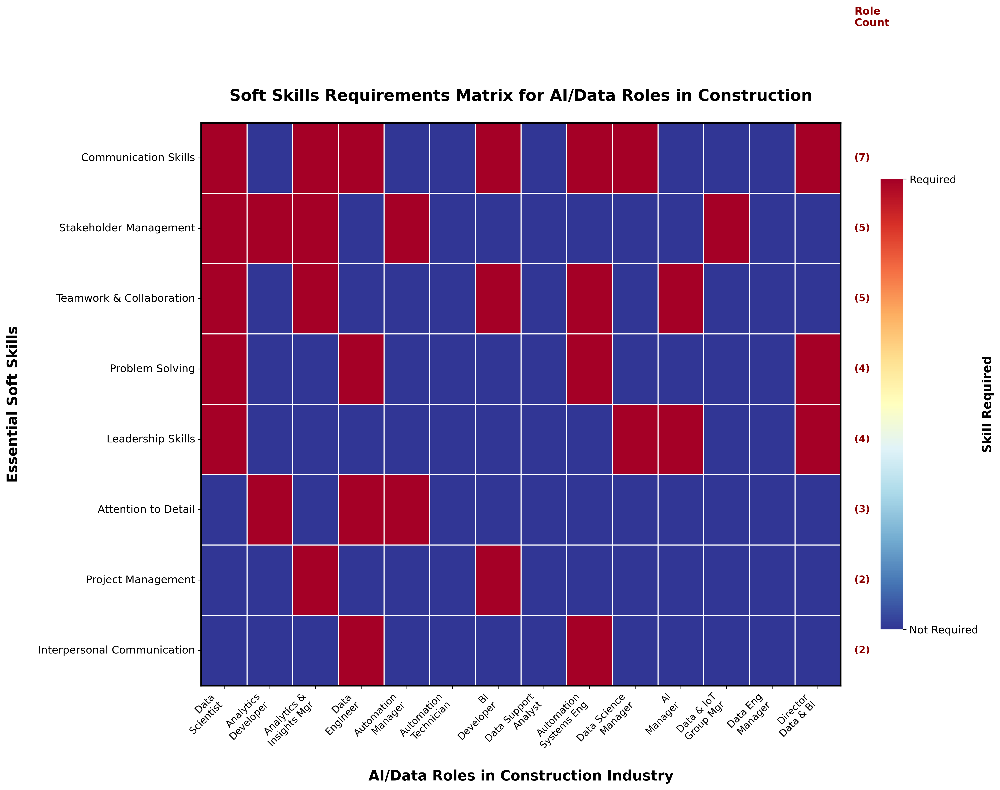


ENHANCED ANALYSIS COMPLETE!
✓ Comprehensive cleaning applied
✓ Publication-quality heatmap generated
✓ All results saved to files
✓ 13 clean, standardized soft skills identified
✓ Ready for academic publication


In [2]:
# Complete Improved Soft Skills Cleaning and Visualization
# Author: Dr. M. Reza Hosseini (Enhanced Version)
# Purpose: Clean, standardize and visualize soft skills data for 14 AI roles

# Import all required libraries
import networkx as nx
import pandas as pd
import numpy as np
from collections import defaultdict, Counter
import re
import os
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

print("ENHANCED SOFT SKILLS CLEANING AND VISUALIZATION")
print("=" * 60)

# Configuration
enhanced_graph_path = '/content/drive/MyDrive/knowledge-graph-llms/graph_backups/enhanced_knowledge_graph_final.graphml'

# Define the 14 target roles
target_roles = [
    "Data Scientist", "Analytics Developer", "Analytics And Insights Manager",
    "Data Engineer", "Automation Manager", "Automation Technician",
    "Business Intelligence Developer", "Data Support Analyst",
    "Automation Systems Engineer", "Data Science Manager",
    "Artificial Intelligence Manager", "Group Manager Data And Iot",
    "Data Engineering Manager", "Director Of Data Management And Business Intelligence"
]

def load_graph_and_extract_data():
    """Load the knowledge graph and extract soft skills data"""
    print("\nLoading knowledge graph...")

    # Load the enhanced graph
    G = nx.read_graphml(enhanced_graph_path)
    print(f"Graph loaded with {G.number_of_nodes()} nodes and {G.number_of_edges()} edges")

    return G

def find_role_nodes(graph, target_roles):
    """Find the actual nodes for target roles"""
    print("\nFinding role nodes...")

    role_nodes = {}
    for node, data in graph.nodes(data=True):
        role_name = data.get('id', '')
        if role_name in target_roles:
            role_nodes[role_name] = {'node': node, 'data': data}

    print(f"Found {len(role_nodes)} target role nodes")
    return role_nodes

def extract_raw_soft_skills(graph, role_nodes):
    """Extract all raw soft skills without any processing"""
    print("\nExtracting raw soft skills...")

    role_soft_skills = {}
    all_soft_skills = set()
    skill_to_roles = defaultdict(list)

    for role_name, role_info in role_nodes.items():
        node = role_info['node']
        soft_skills = []

        neighbors = list(graph.neighbors(node))
        for neighbor in neighbors:
            neighbor_data = graph.nodes[neighbor]
            neighbor_labels = neighbor_data.get('labels', '')
            neighbor_id = neighbor_data.get('id', str(neighbor))

            if ':Soft skill' in neighbor_labels:
                soft_skills.append(neighbor_id)
                all_soft_skills.add(neighbor_id)
                skill_to_roles[neighbor_id].append(role_name)

        role_soft_skills[role_name] = sorted(soft_skills)
        print(f"  {role_name}: {len(soft_skills)} raw soft skills")

    print(f"\nTotal raw soft skills found: {len(all_soft_skills)}")
    return role_soft_skills, all_soft_skills, skill_to_roles

def create_comprehensive_cleaning_rules():
    """Create comprehensive cleaning and standardization rules"""
    print("\nCreating comprehensive cleaning rules...")

    # Enhanced skills to remove completely
    skills_to_remove = {
        # Technical skills (should be in technical category)
        'Agile Delivery', 'Agile Methodology', 'Agile', 'Scrum', 'Devops', 'DevOps',
        'Coding Consistency', 'Programming', 'Software Development', 'Software Testing',
        'Technical Leadership', 'Technical Knowledge', 'Technical Skills', 'Technical',
        'System Analysis', 'Database Management', 'API Development', 'API',
        'Version Control', 'Testing', 'Debugging', 'Quality Assurance',
        'Code Review', 'Technical Documentation', 'Software Engineering',

        # Meaningless/vague qualifiers and phrases
        'Career Growth', 'career growth', 'Develop Strong', 'develop strong',
        'Good', 'good', 'Excellent', 'excellent', 'Outstanding', 'outstanding',
        'Ability To', 'ability to', 'Experience In', 'experience in',
        'Knowledge Of', 'knowledge of', 'Understanding Of', 'understanding of',
        'Familiarity With', 'familiarity with', 'Exposure To', 'exposure to',
        'Working Knowledge', 'working knowledge', 'Good Understanding', 'good understanding',
        'Strong Background', 'strong background', 'Demonstrated Experience', 'demonstrated experience',
        'Proven Experience', 'proven experience', 'Track Record', 'track record',
        'Background In', 'background in', 'Experience With', 'experience with',
        'Knowledge In', 'knowledge in',

        # Too vague or meaningless
        'Growth And Development', 'growth and development',
        'working closely together', 'Working Closely Together',
        'progression', 'Progression',
        'Develop Strong Working Relationships', 'develop strong working relationships',

        # Industry-specific (not transferable soft skills)
        'Mining Industry Experience', 'Construction Experience', 'Oil And Gas Experience',
        'Manufacturing Experience', 'Automotive Experience', 'Healthcare Experience',
        'Industry Experience', 'Domain Knowledge', 'Sector Experience',
    }

    # Enhanced standardization mapping with comprehensive consolidation
    standardization_mapping = {
        # === COMMUNICATION CLUSTER ===
        'Communication': 'Communication Skills',
        'communication': 'Communication Skills',
        'Verbal Communication': 'Communication Skills',
        'verbal communication': 'Communication Skills',
        'Written Communication': 'Communication Skills',
        'written communication': 'Communication Skills',
        'Oral Communication': 'Communication Skills',
        'oral communication': 'Communication Skills',
        'Communication Skills': 'Communication Skills',
        'communication skills': 'Communication Skills',
        'Effective Communication': 'Communication Skills',
        'effective communication': 'Communication Skills',
        'Excellent Communication': 'Communication Skills',
        'excellent communication': 'Communication Skills',
        'Strong Communication': 'Communication Skills',
        'strong communication': 'Communication Skills',

        # Interpersonal Communication (separate but related)
        'Interpersonal Skills': 'Interpersonal Communication',
        'interpersonal skills': 'Interpersonal Communication',
        'Interpersonal Communication': 'Interpersonal Communication',
        'interpersonal communication': 'Interpersonal Communication',
        'Interpersonal Abilities': 'Interpersonal Communication',
        'interpersonal abilities': 'Interpersonal Communication',
        'People Skills': 'Interpersonal Communication',
        'people skills': 'Interpersonal Communication',
        'Social Skills': 'Interpersonal Communication',
        'social skills': 'Interpersonal Communication',

        # === TEAMWORK & COLLABORATION CLUSTER ===
        'Teamwork': 'Teamwork & Collaboration',
        'teamwork': 'Teamwork & Collaboration',
        'Team Player': 'Teamwork & Collaboration',
        'team player': 'Teamwork & Collaboration',
        'Team Work': 'Teamwork & Collaboration',
        'team work': 'Teamwork & Collaboration',
        'Collaboration': 'Teamwork & Collaboration',
        'collaboration': 'Teamwork & Collaboration',
        'Collaborative': 'Teamwork & Collaboration',
        'collaborative': 'Teamwork & Collaboration',
        'Team Collaboration': 'Teamwork & Collaboration',
        'team collaboration': 'Teamwork & Collaboration',
        'Cross-Functional Collaboration': 'Teamwork & Collaboration',
        'cross-functional collaboration': 'Teamwork & Collaboration',
        'Working In Teams': 'Teamwork & Collaboration',
        'working in teams': 'Teamwork & Collaboration',
        'Team Building': 'Teamwork & Collaboration',
        'team building': 'Teamwork & Collaboration',
        'Teamwork & Collaboration': 'Teamwork & Collaboration',
        'teamwork & collaboration': 'Teamwork & Collaboration',

        # === LEADERSHIP CLUSTER ===
        'Leadership': 'Leadership Skills',
        'leadership': 'Leadership Skills',
        'Leadership Skills': 'Leadership Skills',
        'leadership skills': 'Leadership Skills',
        'Team Leadership': 'Leadership Skills',
        'team leadership': 'Leadership Skills',
        'Strong Leadership': 'Leadership Skills',
        'strong leadership': 'Leadership Skills',
        'Leadership Abilities': 'Leadership Skills',
        'leadership abilities': 'Leadership Skills',
        'Leadership Capability': 'Leadership Skills',
        'leadership capability': 'Leadership Skills',
        'Coaching': 'Leadership Skills',
        'coaching': 'Leadership Skills',
        'Mentoring': 'Leadership Skills',
        'mentoring': 'Leadership Skills',
        'Influence': 'Leadership Skills',
        'influence': 'Leadership Skills',

        # === MANAGEMENT CLUSTER ===
        'Management': 'Management Skills',
        'management': 'Management Skills',
        'Management Skills': 'Management Skills',
        'management skills': 'Management Skills',
        'People Management': 'Management Skills',
        'people management': 'Management Skills',
        'Team Management': 'Management Skills',
        'team management': 'Management Skills',
        'Staff Management': 'Management Skills',
        'staff management': 'Management Skills',

        # === PROBLEM SOLVING CLUSTER ===
        'Problem-Solving': 'Problem Solving',
        'problem-solving': 'Problem Solving',
        'Problem Solving': 'Problem Solving',
        'problem solving': 'Problem Solving',
        'Problem-Solving Skills': 'Problem Solving',
        'problem-solving skills': 'Problem Solving',
        'Problem Solving Skills': 'Problem Solving',
        'problem solving skills': 'Problem Solving',
        'Good Problem Solving': 'Problem Solving',
        'good problem solving': 'Problem Solving',
        'Strong Problem Solving': 'Problem Solving',
        'strong problem solving': 'Problem Solving',
        'Troubleshooting': 'Problem Solving',
        'troubleshooting': 'Problem Solving',
        'Outstanding Troubleshooting': 'Problem Solving',
        'outstanding troubleshooting': 'Problem Solving',
        'outstanding troubleshooting skills': 'Problem Solving',
        'Outstanding Troubleshooting Skills': 'Problem Solving',
        'Troubleshooting Skills': 'Problem Solving',
        'troubleshooting skills': 'Problem Solving',
        'Issue Resolution': 'Problem Solving',
        'issue resolution': 'Problem Solving',
        'Conflict Resolution': 'Problem Solving',
        'conflict resolution': 'Problem Solving',

        # === STAKEHOLDER MANAGEMENT CLUSTER ===
        'Stakeholder Management': 'Stakeholder Management',
        'stakeholder management': 'Stakeholder Management',
        'Stakeholder Engagement': 'Stakeholder Management',
        'stakeholder engagement': 'Stakeholder Management',
        'Client Management': 'Stakeholder Management',
        'client management': 'Stakeholder Management',
        'Client Relations': 'Stakeholder Management',
        'client relations': 'Stakeholder Management',
        'Relationship Building': 'Stakeholder Management',
        'relationship building': 'Stakeholder Management',
        'Relationship Management': 'Stakeholder Management',
        'relationship management': 'Stakeholder Management',
        'Networking': 'Stakeholder Management',
        'networking': 'Stakeholder Management',

        # === CUSTOMER FOCUS CLUSTER ===
        'Customer Service': 'Customer Focus',
        'customer service': 'Customer Focus',
        'Customer Focus': 'Customer Focus',
        'customer focus': 'Customer Focus',
        'Customer Experience': 'Customer Focus',
        'customer experience': 'Customer Focus',
        'customer focused mentality': 'Customer Focus',
        'Customer Focused Mentality': 'Customer Focus',
        'Customer-Focused': 'Customer Focus',
        'customer-focused': 'Customer Focus',
        'Client Focus': 'Customer Focus',
        'client focus': 'Customer Focus',

        # === PROJECT MANAGEMENT CLUSTER ===
        'Project Management': 'Project Management',
        'project management': 'Project Management',
        'Deadline Management': 'Project Management',
        'deadline management': 'Project Management',
        'Time Management': 'Time Management',  # Keep separate - it's distinct
        'time management': 'Time Management',
        'Resource Management': 'Project Management',
        'resource management': 'Project Management',

        # === STRATEGIC PLANNING CLUSTER ===
        'Strategic Planning': 'Strategic Planning',
        'strategic planning': 'Strategic Planning',
        'Operational Planning': 'Strategic Planning',
        'operational planning': 'Strategic Planning',
        'Planning': 'Strategic Planning',
        'planning': 'Strategic Planning',
        'Planning Skills': 'Strategic Planning',
        'planning skills': 'Strategic Planning',
        'Strategic Thinking': 'Strategic Planning',
        'strategic thinking': 'Strategic Planning',

        # === ATTENTION TO DETAIL CLUSTER ===
        'Attention To Detail': 'Attention to Detail',
        'attention to detail': 'Attention to Detail',
        'Attention to Detail': 'Attention to Detail',
        'Detail Oriented': 'Attention to Detail',
        'detail oriented': 'Attention to Detail',
        'Detail-Oriented': 'Attention to Detail',
        'detail-oriented': 'Attention to Detail',
        'Eye for Detail': 'Attention to Detail',
        'eye for detail': 'Attention to Detail',

        # === CONTINUOUS LEARNING CLUSTER ===
        'Learning Agility': 'Continuous Learning',
        'learning agility': 'Continuous Learning',
        'Continuous Learning': 'Continuous Learning',
        'continuous learning': 'Continuous Learning',
        'Lifelong Learning': 'Continuous Learning',
        'lifelong learning': 'Continuous Learning',
        'Curiosity': 'Continuous Learning',
        'curiosity': 'Continuous Learning',
        'Eager To Learn': 'Continuous Learning',
        'eager to learn': 'Continuous Learning',
        'Willingness To Learn': 'Continuous Learning',
        'willingness to learn': 'Continuous Learning',
        'Learning Orientation': 'Continuous Learning',
        'learning orientation': 'Continuous Learning',
        'Growth Mindset': 'Continuous Learning',
        'growth mindset': 'Continuous Learning',
        'Growth And Development': 'Continuous Learning',  # Consolidate here
        'growth and development': 'Continuous Learning',
        'Professional Development': 'Continuous Learning',
        'professional development': 'Continuous Learning',

        # === ADAPTABILITY CLUSTER ===
        'Adaptability': 'Adaptability',
        'adaptability': 'Adaptability',
        'Flexibility': 'Adaptability',
        'flexibility': 'Adaptability',
        'Flexible': 'Adaptability',
        'flexible': 'Adaptability',
        'Adaptable': 'Adaptability',
        'adaptable': 'Adaptability',
        'Change Management': 'Adaptability',
        'change management': 'Adaptability',
        'Resilience': 'Adaptability',
        'resilience': 'Adaptability',
        'Resilient': 'Adaptability',
        'resilient': 'Adaptability',

        # === PROFESSIONAL QUALITIES CLUSTER ===
        'Professionalism': 'Professionalism',
        'professionalism': 'Professionalism',
        'Professional': 'Professionalism',
        'professional': 'Professionalism',
        'Integrity': 'Professional Ethics',
        'integrity': 'Professional Ethics',
        'Ethics': 'Professional Ethics',
        'ethics': 'Professional Ethics',
        'Ethical': 'Professional Ethics',
        'ethical': 'Professional Ethics',
        'Psychological Safety': 'Professional Ethics',
        'psychological safety': 'Professional Ethics',
        'Work Ethics': 'Professional Ethics',
        'work ethics': 'Professional Ethics',

        # === RELIABILITY & ACCOUNTABILITY CLUSTER ===
        'Reliability': 'Reliability & Accountability',
        'reliability': 'Reliability & Accountability',
        'Reliable': 'Reliability & Accountability',
        'reliable': 'Reliability & Accountability',
        'Accountability': 'Reliability & Accountability',
        'accountability': 'Reliability & Accountability',
        'Responsible': 'Reliability & Accountability',
        'responsible': 'Reliability & Accountability',
        'Punctuality': 'Reliability & Accountability',
        'punctuality': 'Reliability & Accountability',
        'Dependable': 'Reliability & Accountability',
        'dependable': 'Reliability & Accountability',

        # === INITIATIVE & MOTIVATION CLUSTER ===
        'Initiative': 'Initiative & Self-Motivation',
        'initiative': 'Initiative & Self-Motivation',
        'Self-Motivated': 'Initiative & Self-Motivation',
        'self-motivated': 'Initiative & Self-Motivation',
        'Self-Motivation': 'Initiative & Self-Motivation',
        'self-motivation': 'Initiative & Self-Motivation',
        'Proactive': 'Initiative & Self-Motivation',
        'proactive': 'Initiative & Self-Motivation',
        'Self-Starter': 'Initiative & Self-Motivation',
        'self-starter': 'Initiative & Self-Motivation',
        'Drive': 'Initiative & Self-Motivation',
        'drive': 'Initiative & Self-Motivation',
        'Motivation': 'Initiative & Self-Motivation',
        'motivation': 'Initiative & Self-Motivation',
        'Self-Directed': 'Initiative & Self-Motivation',
        'self-directed': 'Initiative & Self-Motivation',

        # === ORGANIZATIONAL SKILLS CLUSTER ===
        'Organization': 'Organizational Skills',
        'organization': 'Organizational Skills',
        'Organizational Skills': 'Organizational Skills',
        'organizational skills': 'Organizational Skills',
        'Multi-Tasking': 'Organizational Skills',
        'multi-tasking': 'Organizational Skills',
        'Multitasking': 'Organizational Skills',
        'multitasking': 'Organizational Skills',
        'Multi-Task': 'Organizational Skills',
        'multi-task': 'Organizational Skills',
        'Prioritization': 'Organizational Skills',
        'prioritization': 'Organizational Skills',
    }

    return skills_to_remove, standardization_mapping

def apply_comprehensive_cleaning(all_soft_skills, skill_to_roles):
    """Apply comprehensive cleaning to soft skills"""
    print(f"\nAPPLYING COMPREHENSIVE CLEANING...")
    print(f"Starting with {len(all_soft_skills)} original soft skills")

    skills_to_remove, standardization_mapping = create_comprehensive_cleaning_rules()

    # Create case-insensitive lookup for removal
    removal_lookup = {skill.lower(): skill for skill in skills_to_remove}

    # Create case-insensitive lookup for standardization
    standardization_lookup = {}
    for original, standardized in standardization_mapping.items():
        standardization_lookup[original.lower()] = standardized

    # Track cleaning actions
    removed_skills = []
    consolidated_skills = []
    unchanged_skills = []

    cleaned_skill_to_roles = defaultdict(set)

    print(f"\nProcessing skills...")

    for original_skill, roles in skill_to_roles.items():
        original_lower = original_skill.lower().strip()

        # Check if skill should be removed
        if original_lower in removal_lookup:
            removed_skills.append(original_skill)
            print(f"  REMOVED: '{original_skill}'")
            continue

        # Check for consolidation
        if original_lower in standardization_lookup:
            consolidated_skill = standardization_lookup[original_lower]
            consolidated_skills.append((original_skill, consolidated_skill))
            print(f"  CONSOLIDATED: '{original_skill}' → '{consolidated_skill}'")
        else:
            # Keep original but clean up formatting
            consolidated_skill = original_skill.strip()
            unchanged_skills.append(original_skill)
            print(f"  UNCHANGED: '{original_skill}'")

        # Add to cleaned mapping
        for role in roles:
            cleaned_skill_to_roles[consolidated_skill].add(role)

    # Convert sets back to lists and sort
    final_cleaned_skills = {}
    for skill, roles in cleaned_skill_to_roles.items():
        final_cleaned_skills[skill] = sorted(list(roles))

    print(f"\nCLEANING SUMMARY:")
    print(f"  Original skills: {len(all_soft_skills)}")
    print(f"  Removed: {len(removed_skills)}")
    print(f"  Consolidated: {len(consolidated_skills)}")
    print(f"  Unchanged: {len(unchanged_skills)}")
    print(f"  Final cleaned skills: {len(final_cleaned_skills)}")
    print(f"  Reduction rate: {((len(all_soft_skills) - len(final_cleaned_skills)) / len(all_soft_skills)) * 100:.1f}%")

    # Show the final skills ranked by importance
    print(f"\nFINAL CONSOLIDATED SOFT SKILLS (ranked by importance):")
    sorted_final = sorted(final_cleaned_skills.items(), key=lambda x: len(x[1]), reverse=True)
    for i, (skill, roles) in enumerate(sorted_final, 1):
        print(f"  {i:2d}. {skill}: {len(roles)} roles")

    return final_cleaned_skills, {
        'removed': removed_skills,
        'consolidated': consolidated_skills,
        'unchanged': unchanged_skills
    }

def create_publication_quality_heatmap(cleaned_skills, target_roles):
    """Create publication-quality heatmap with improved cleaned data"""
    print(f"\nCreating publication-quality heatmap...")
    print(f"Using {len(cleaned_skills)} cleaned soft skills")

    # Set style for publication
    plt.rcParams.update({
        'font.family': 'sans-serif',
        'font.sans-serif': ['Arial', 'DejaVu Sans', 'Helvetica'],
        'font.size': 11,
        'figure.dpi': 300,
        'savefig.dpi': 600,
        'savefig.bbox': 'tight',
        'axes.linewidth': 1.2,
        'axes.edgecolor': 'black'
    })

    # Sort cleaned skills by number of connected roles (most important first)
    sorted_cleaned_skills = sorted(cleaned_skills.items(), key=lambda x: len(x[1]), reverse=True)

    # Filter to skills that appear in at least 2 roles for cleaner visualization
    min_roles = 2
    filtered_skills = [(skill, roles) for skill, roles in sorted_cleaned_skills if len(roles) >= min_roles]

    print(f"\nFiltered to {len(filtered_skills)} skills appearing in {min_roles}+ roles:")
    for i, (skill, roles) in enumerate(filtered_skills, 1):
        print(f"  {i:2d}. {skill}: {len(roles)} roles")

    # Create matrix with soft skills on Y-axis, roles on X-axis
    heatmap_data = []

    for skill_name, connected_roles in filtered_skills:
        skill_data = {'Soft_Skill': skill_name}

        # Add data for each role (1 if required, 0 if not)
        for role in target_roles:
            has_skill = 1 if role in connected_roles else 0
            skill_data[role] = has_skill

        # Add total count for reference
        skill_data['Total_Roles'] = len(connected_roles)
        heatmap_data.append(skill_data)

    # Convert to DataFrame with soft skills as index
    heatmap_df = pd.DataFrame(heatmap_data)
    heatmap_df = heatmap_df.set_index('Soft_Skill')

    # Remove Total_Roles column for plotting
    plot_df = heatmap_df.drop('Total_Roles', axis=1)

    # Create the enhanced heatmap
    fig, ax = plt.subplots(1, 1, figsize=(20, 12))

    # Create heatmap with professional styling
    sns.heatmap(plot_df,
                annot=False,
                cmap='RdYlBu_r',  # Professional diverging color scheme
                cbar_kws={'label': 'Skill Required', 'shrink': 0.8, 'aspect': 20},
                linewidths=0.8,
                linecolor='white',
                square=False,
                ax=ax)

    # Customize for journal publication
    ax.set_xlabel('AI/Data Roles in Construction Industry', fontsize=16, fontweight='bold', labelpad=20)
    ax.set_ylabel('Essential Soft Skills', fontsize=16, fontweight='bold', labelpad=20)
    ax.set_title('Soft Skills Requirements Matrix for AI/Data Roles in Construction',
                fontsize=18, fontweight='bold', pad=25)

    # Format Y-axis labels (soft skills)
    ax.set_yticklabels(plot_df.index, rotation=0, fontsize=12, fontweight='normal', va='center')

    # Format X-axis labels (roles) - create better abbreviations
    role_abbreviations = {
        'Data Scientist': 'Data\nScientist',
        'Analytics Developer': 'Analytics\nDeveloper',
        'Analytics And Insights Manager': 'Analytics &\nInsights Mgr',
        'Data Engineer': 'Data\nEngineer',
        'Automation Manager': 'Automation\nManager',
        'Automation Technician': 'Automation\nTechnician',
        'Business Intelligence Developer': 'BI\nDeveloper',
        'Data Support Analyst': 'Data Support\nAnalyst',
        'Automation Systems Engineer': 'Automation\nSystems Eng',
        'Data Science Manager': 'Data Science\nManager',
        'Artificial Intelligence Manager': 'AI\nManager',
        'Group Manager Data And Iot': 'Data & IoT\nGroup Mgr',
        'Data Engineering Manager': 'Data Eng\nManager',
        'Director Of Data Management And Business Intelligence': 'Director\nData & BI'
    }

    abbreviated_labels = [role_abbreviations.get(role, role.replace(' ', '\n'))
                         for role in plot_df.columns]
    ax.set_xticklabels(abbreviated_labels, rotation=45, ha='right', fontsize=11, fontweight='normal')

    # Add frequency annotations on the right side
    for i, skill in enumerate(plot_df.index):
        total = heatmap_df.loc[skill, 'Total_Roles']
        ax.text(len(plot_df.columns) + 0.3, i + 0.5, f'({total})',
                ha='left', va='center', fontsize=11, color='darkred', fontweight='bold')

    # Add frequency label
    ax.text(len(plot_df.columns) + 0.3, -1.5, 'Role\nCount',
            ha='left', va='center', fontsize=12, fontweight='bold', color='darkred')

    # Customize colorbar
    cbar = ax.collections[0].colorbar
    cbar.set_ticks([0, 1])
    cbar.set_ticklabels(['Not Required', 'Required'])
    cbar.ax.tick_params(labelsize=12)
    cbar.set_label('Skill Required', fontsize=14, fontweight='bold')

    # Add border around the heatmap
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(2)
        spine.set_color('black')

    # Adjust layout for better spacing
    plt.tight_layout()
    plt.subplots_adjust(left=0.22, right=0.85, bottom=0.18, top=0.92)

    return fig, plot_df, heatmap_df

def save_results(cleaned_skills, cleaning_report, fig_heatmap, plot_df, heatmap_df):
    """Save all results to files"""
    print(f"\nSaving results...")

    # Create directories
    appendices_dir = '/content/drive/MyDrive/knowledge-graph-llms/Appendices'
    figures_dir = '/content/drive/MyDrive/knowledge-graph-llms/academic_figures'
    os.makedirs(appendices_dir, exist_ok=True)
    os.makedirs(figures_dir, exist_ok=True)

    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

    # 1. Save cleaned skills analysis
    analysis_data = []
    for skill, roles in cleaned_skills.items():
        # Categorize roles
        management_roles = sum(1 for role in roles
                             if any(term in role.lower() for term in ['manager', 'director']))
        technical_roles = sum(1 for role in roles
                            if any(term in role.lower() for term in ['scientist', 'engineer', 'developer']))
        support_roles = len(roles) - management_roles - technical_roles

        analysis_data.append({
            'Soft_Skill': skill,
            'Total_Roles': len(roles),
            'Management_Roles': management_roles,
            'Technical_Roles': technical_roles,
            'Support_Roles': support_roles,
            'Connected_Roles': '; '.join(sorted(roles))
        })

    analysis_df = pd.DataFrame(analysis_data)
    analysis_df = analysis_df.sort_values('Total_Roles', ascending=False)

    # Save analysis CSV
    analysis_path = os.path.join(appendices_dir, f'enhanced_soft_skills_analysis_{timestamp}.csv')
    analysis_df.to_csv(analysis_path, index=False)

    current_analysis = os.path.join(appendices_dir, 'current_enhanced_soft_skills_analysis.csv')
    analysis_df.to_csv(current_analysis, index=False)

    # 2. Save heatmap data
    heatmap_data_path = os.path.join(appendices_dir, f'heatmap_data_{timestamp}.csv')
    heatmap_df.to_csv(heatmap_data_path)

    # 3. Save figures
    # High-resolution PDF for journal
    pdf_path = os.path.join(figures_dir, f'enhanced_soft_skills_heatmap_{timestamp}.pdf')
    fig_heatmap.savefig(pdf_path, format='pdf', dpi=600, bbox_inches='tight',
                       facecolor='white', edgecolor='none')

    current_pdf = os.path.join(figures_dir, 'enhanced_soft_skills_heatmap_current.pdf')
    fig_heatmap.savefig(current_pdf, format='pdf', dpi=600, bbox_inches='tight',
                       facecolor='white', edgecolor='none')

    # High-resolution PNG for presentations
    png_path = os.path.join(figures_dir, f'enhanced_soft_skills_heatmap_{timestamp}.png')
    fig_heatmap.savefig(png_path, format='png', dpi=600, bbox_inches='tight',
                       facecolor='white', edgecolor='none')

    # 4. Create comprehensive report
    report_path = os.path.join(appendices_dir, f'enhanced_soft_skills_report_{timestamp}.txt')
    with open(report_path, 'w') as f:
        f.write("ENHANCED SOFT SKILLS ANALYSIS REPORT\n")
        f.write("=" * 50 + "\n\n")
        f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
        f.write(f"Author: Dr. M. Reza Hosseini\n\n")

        f.write(f"ANALYSIS OVERVIEW:\n")
        f.write(f"Target Roles Analyzed: {len(target_roles)}\n")
        f.write(f"Original Soft Skills: {len(cleaning_report['removed']) + len(cleaning_report['consolidated']) + len(cleaning_report['unchanged'])}\n")
        f.write(f"Final Cleaned Skills: {len(cleaned_skills)}\n")
        f.write(f"Skills Removed: {len(cleaning_report['removed'])}\n")
        f.write(f"Skills Consolidated: {len(cleaning_report['consolidated'])}\n\n")

        f.write(f"FINAL SOFT SKILLS RANKING:\n")
        f.write("-" * 40 + "\n")
        sorted_skills = sorted(cleaned_skills.items(), key=lambda x: len(x[1]), reverse=True)
        for i, (skill, roles) in enumerate(sorted_skills, 1):
            f.write(f"{i:2d}. {skill}: {len(roles)} roles - {', '.join(roles)}\n")

        f.write(f"\n\nREMOVED SKILLS:\n")
        f.write("-" * 20 + "\n")
        for skill in sorted(cleaning_report['removed']):
            f.write(f"- {skill}\n")

        f.write(f"\n\nCONSOLIDATED SKILLS:\n")
        f.write("-" * 25 + "\n")
        for original, consolidated in sorted(cleaning_report['consolidated']):
            f.write(f"'{original}' → '{consolidated}'\n")

    print(f"\nFiles saved:")
    print(f"  - Enhanced analysis: {os.path.basename(analysis_path)}")
    print(f"  - Current reference: current_enhanced_soft_skills_analysis.csv")
    print(f"  - Heatmap data: {os.path.basename(heatmap_data_path)}")
    print(f"  - Journal PDF: enhanced_soft_skills_heatmap_current.pdf")
    print(f"  - High-res PNG: {os.path.basename(png_path)}")
    print(f"  - Detailed report: {os.path.basename(report_path)}")

    return analysis_df

def print_summary_statistics(cleaned_skills, original_count):
    """Print comprehensive summary statistics"""
    print(f"\n" + "="*60)
    print(f"ENHANCED SOFT SKILLS ANALYSIS SUMMARY")
    print(f"="*60)

    # Basic statistics
    print(f"\nBASIC STATISTICS:")
    print(f"  Original soft skills: {original_count}")
    print(f"  Final cleaned skills: {len(cleaned_skills)}")
    print(f"  Reduction: {original_count - len(cleaned_skills)} skills")
    print(f"  Reduction rate: {((original_count - len(cleaned_skills)) / original_count) * 100:.1f}%")

    # Skill distribution
    role_counts = [len(roles) for roles in cleaned_skills.values()]
    print(f"\nSKILL DISTRIBUTION:")
    print(f"  Most connected skill: {max(role_counts)} roles")
    print(f"  Least connected skill: {min(role_counts)} roles")
    print(f"  Average connectivity: {np.mean(role_counts):.1f} roles")
    print(f"  Median connectivity: {np.median(role_counts):.1f} roles")

    # Top skills
    print(f"\nTOP 10 MOST IMPORTANT SOFT SKILLS:")
    sorted_skills = sorted(cleaned_skills.items(), key=lambda x: len(x[1]), reverse=True)
    for i, (skill, roles) in enumerate(sorted_skills[:10], 1):
        print(f"  {i:2d}. {skill}: {len(roles)} roles")

    # Connectivity distribution
    print(f"\nCONNECTIVITY DISTRIBUTION:")
    connectivity_dist = Counter(len(roles) for roles in cleaned_skills.values())
    for conn_count in sorted(connectivity_dist.keys(), reverse=True):
        skill_count = connectivity_dist[conn_count]
        percentage = (skill_count / len(cleaned_skills)) * 100
        print(f"  {conn_count} roles: {skill_count} skills ({percentage:.1f}%)")

# MAIN EXECUTION
def main():
    """Main execution function"""
    print("Starting enhanced soft skills analysis...")

    # 1. Load graph and extract data
    G = load_graph_and_extract_data()
    role_nodes = find_role_nodes(G, target_roles)
    role_soft_skills, all_soft_skills, skill_to_roles = extract_raw_soft_skills(G, role_nodes)

    # 2. Apply enhanced cleaning
    cleaned_skills, cleaning_report = apply_comprehensive_cleaning(all_soft_skills, skill_to_roles)

    # 3. Create publication-quality visualization
    fig_heatmap, plot_df, heatmap_df = create_publication_quality_heatmap(cleaned_skills, target_roles)

    # 4. Save all results
    analysis_df = save_results(cleaned_skills, cleaning_report, fig_heatmap, plot_df, heatmap_df)

    # 5. Print summary statistics
    print_summary_statistics(cleaned_skills, len(all_soft_skills))

    # 6. Display the plot
    plt.show()

    print(f"\n" + "="*60)
    print(f"ENHANCED ANALYSIS COMPLETE!")
    print(f"="*60)
    print(f"✓ Comprehensive cleaning applied")
    print(f"✓ Publication-quality heatmap generated")
    print(f"✓ All results saved to files")
    print(f"✓ {len(cleaned_skills)} clean, standardized soft skills identified")
    print(f"✓ Ready for academic publication")

    return cleaned_skills, fig_heatmap, analysis_df

# Run the analysis
if __name__ == "__main__":
    cleaned_skills, figure, analysis_data = main()

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✓ Setup completed successfully
✓ Google Drive mounted
✓ Libraries imported

SECTION 1: DATA LOADING AND INITIAL EXPLORATION
Loading datasets...
✓ Construction dataset loaded: (300, 11)
✓ Other industries dataset loaded: (45259, 11)

--- CONSTRUCTION DATASET INFO ---
Shape: (300, 11)
Columns: ['Employer', 'JobID', 'City', 'State', 'Title', 'JobDate', 'ANZSIC CODE', 'ANZSCO CODE', 'LOT CODE', 'JobText', 'JobUrl']

First few rows:
                     Employer                                     JobID  \
0                      Mirvac  37716b56223ca91a66bc3600c87bdbc62053504c   
1                      Mirvac  c90b87856a372ce9d4117ce89f98afdb63d546df   
2  Johnathan Thurston Academy  a80d4382ca7c3aecbc399d4b7132e382dc9645c8   

          City               State                            Title  \
0  Sydney, AUS     New South Wales  Analytics and Insights Managers

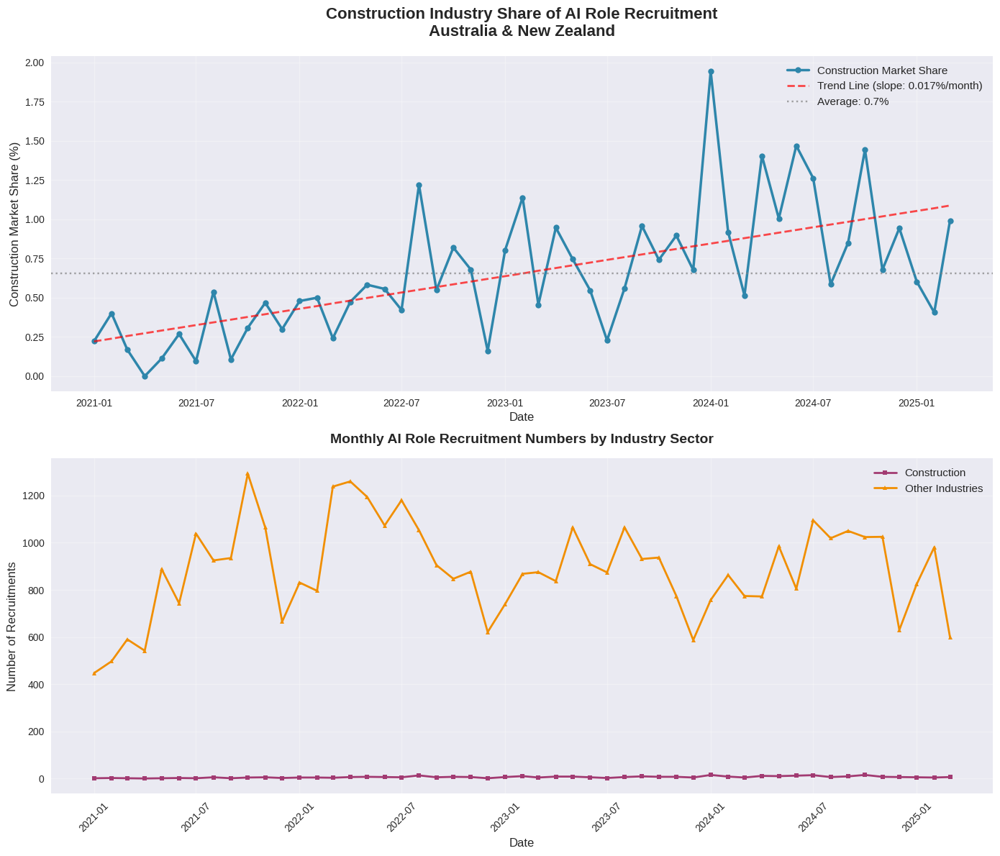

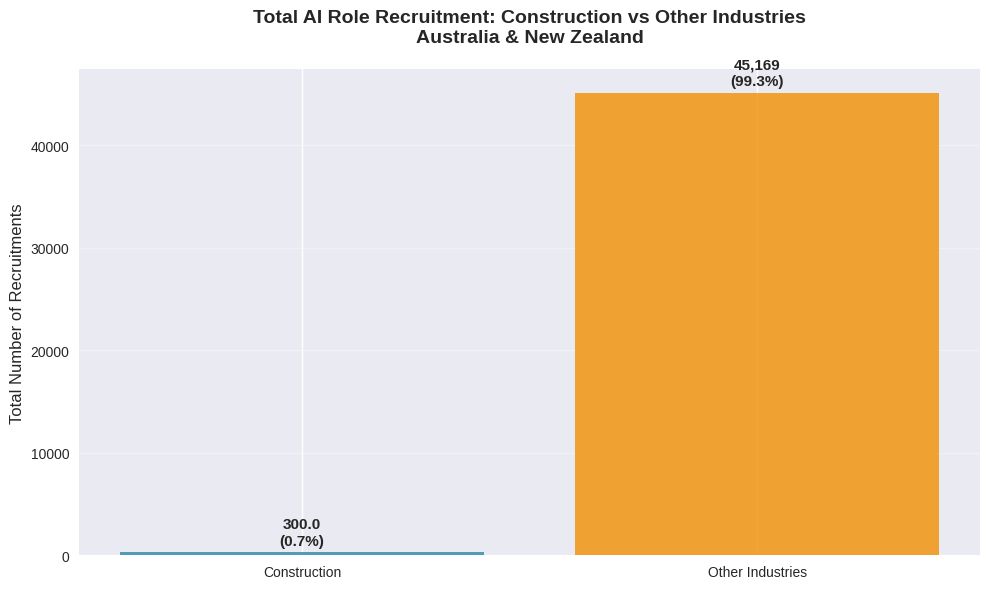


✓ Checkpoint 6: Visualization completed

FINAL SECTION: RESEARCH INSIGHTS AND STATISTICAL SUMMARY
--- KEY FINDINGS ---
📊 Analysis Period: January 2021 to March 2025
📈 Total Months Analyzed: 51
🏗️  Construction AI Recruitments: 300.0
🏭 Other Industries AI Recruitments: 45,169
📊 Construction Market Share: 0.66%
📈 Average Monthly Market Share: 0.65%
📊 Market Share Range: 0.00% - 1.94%
📈 Trend: Construction's market share is increasing at 0.017% per month
📊 Trend Strength (correlation): 0.631

--- MONTHLY STATISTICS ---
📊 Average monthly construction recruitments: 5.9
📊 Average monthly other industries recruitments: 885.7
📊 Peak construction month: 2024-01 (15.0 recruitments)
📊 Peak market share month: 2024-01 (1.9%)

--- FILES SAVED ---
✓ Monthly analysis data: ai_recruitment_monthly_analysis.csv
✓ Summary statistics: ai_recruitment_summary_stats.json
✓ Market share visualization: ai_recruitment_analysis.png
✓ Summary chart: ai_recruitment_summary.png

--- POTENTIAL NEXT STEPS ---
🔍 Seas

In [2]:
# AI Recruitment Analysis: Construction vs Other Industries in Australia & New Zealand
# Author: Dr. M. Reza Hosseini
# Purpose: Compare AI role recruitment trends between construction and other industries

# =============================================================================
# Setup and Configuration
# =============================================================================

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')

# Configure display and plotting
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

print("✓ Setup completed successfully")
print("✓ Google Drive mounted")
print("✓ Libraries imported")

# =============================================================================
# Section 1: Data Loading and Initial Exploration
# =============================================================================

print("\n" + "="*60)
print("SECTION 1: DATA LOADING AND INITIAL EXPLORATION")
print("="*60)

# Load datasets
print("Loading datasets...")
try:
    # Construction industry AI roles
    construction_df = pd.read_csv('/content/drive/MyDrive/knowledge-graph-llms/data_all.csv')
    print(f"✓ Construction dataset loaded: {construction_df.shape}")

    # All other industries AI roles
    other_industries_df = pd.read_csv('/content/drive/MyDrive/knowledge-graph-llms/all_industries_merged.csv')
    print(f"✓ Other industries dataset loaded: {other_industries_df.shape}")

except Exception as e:
    print(f"❌ Error loading data: {e}")
    raise

# Display basic information about both datasets
print("\n--- CONSTRUCTION DATASET INFO ---")
print(f"Shape: {construction_df.shape}")
print(f"Columns: {list(construction_df.columns)}")
print("\nFirst few rows:")
print(construction_df.head(3))

print("\n--- OTHER INDUSTRIES DATASET INFO ---")
print(f"Shape: {other_industries_df.shape}")
print(f"Columns: {list(other_industries_df.columns)}")
print("\nFirst few rows:")
print(other_industries_df.head(3))

# Check for missing values
print("\n--- MISSING VALUES CHECK ---")
print("Construction dataset missing values:")
print(construction_df.isnull().sum())
print("\nOther industries dataset missing values:")
print(other_industries_df.isnull().sum())

print("\n✓ Checkpoint 1: Data loading completed successfully")

# =============================================================================
# Section 2: Dataset Structure Analysis
# =============================================================================

print("\n" + "="*60)
print("SECTION 2: DATASET STRUCTURE ANALYSIS")
print("="*60)

# Identify potential time columns in both datasets
print("--- IDENTIFYING TIME COLUMNS ---")
construction_time_cols = [col for col in construction_df.columns if any(word in col.lower() for word in ['date', 'time', 'created', 'posted', 'published'])]
other_time_cols = [col for col in other_industries_df.columns if any(word in col.lower() for word in ['date', 'time', 'created', 'posted', 'published'])]

print(f"Construction potential time columns: {construction_time_cols}")
print(f"Other industries potential time columns: {other_time_cols}")

# Examine data types for time columns
print("\n--- TIME COLUMN DATA TYPES ---")
if construction_time_cols:
    print("Construction time columns:")
    for col in construction_time_cols:
        print(f"  {col}: {construction_df[col].dtype}")
        print(f"    Sample values: {construction_df[col].dropna().head(3).tolist()}")

if other_time_cols:
    print("\nOther industries time columns:")
    for col in other_time_cols:
        print(f"  {col}: {other_industries_df[col].dtype}")
        print(f"    Sample values: {other_industries_df[col].dropna().head(3).tolist()}")

# Display all columns and their data types for manual inspection
print("\n--- ALL COLUMNS SUMMARY ---")
print("Construction dataset columns and types:")
print(construction_df.dtypes)
print("\nOther industries dataset columns and types:")
print(other_industries_df.dtypes)

print("\n✓ Checkpoint 2: Dataset structure analysis completed")

# =============================================================================
# Section 3: Time Period Standardization
# =============================================================================

print("\n" + "="*60)
print("SECTION 3: TIME PERIOD STANDARDIZATION")
print("="*60)

# Enhanced function to handle more date formats and provide detailed reporting
def parse_dates_comprehensive(df, time_col):
    """Comprehensive date parsing with detailed reporting"""
    if time_col not in df.columns:
        return None, {}

    date_series = df[time_col].copy()
    original_count = len(date_series)

    print(f"\n--- DETAILED DATE ANALYSIS FOR {time_col} ---")
    print(f"Total records: {original_count}")
    print(f"Unique date formats sample: {date_series.dropna().unique()[:10]}")

    # Try multiple parsing strategies
    parsing_results = {}

    # Strategy 1: Pandas automatic parsing (most flexible)
    try:
        parsed_auto = pd.to_datetime(date_series, errors='coerce', dayfirst=True)
        auto_success = parsed_auto.notna().sum()
        parsing_results['auto_dayfirst'] = auto_success
        print(f"Auto parsing (day-first): {auto_success}/{original_count} ({auto_success/original_count*100:.1f}%)")

        if auto_success > original_count * 0.5:  # If >50% success, use this
            return parsed_auto, parsing_results
    except Exception as e:
        print(f"Auto parsing failed: {e}")

    # Strategy 2: Try common date formats explicitly
    date_formats = [
        '%d/%m/%Y',    # 31/12/2021
        '%m/%d/%Y',    # 12/31/2021
        '%Y-%m-%d',    # 2021-12-31
        '%d-%m-%Y',    # 31-12-2021
        '%Y/%m/%d',    # 2021/12/31
        '%d/%m/%y',    # 31/12/21
        '%m/%d/%y',    # 12/31/21
        '%d-%m-%y',    # 31-12-21
        '%Y-%m-%d %H:%M:%S',  # 2021-12-31 10:30:00
        '%d/%m/%Y %H:%M:%S',  # 31/12/2021 10:30:00
    ]

    best_parsed = None
    best_count = 0
    best_format = None

    for fmt in date_formats:
        try:
            parsed = pd.to_datetime(date_series, format=fmt, errors='coerce')
            success_count = parsed.notna().sum()
            parsing_results[fmt] = success_count
            print(f"Format {fmt}: {success_count}/{original_count} ({success_count/original_count*100:.1f}%)")

            if success_count > best_count:
                best_count = success_count
                best_parsed = parsed
                best_format = fmt
        except:
            parsing_results[fmt] = 0

    # Strategy 3: If still low success, try more flexible parsing
    if best_count < original_count * 0.7:
        try:
            # Try with infer_datetime_format
            parsed_infer = pd.to_datetime(date_series, errors='coerce', infer_datetime_format=True)
            infer_success = parsed_infer.notna().sum()
            parsing_results['infer_format'] = infer_success
            print(f"Infer format: {infer_success}/{original_count} ({infer_success/original_count*100:.1f}%)")

            if infer_success > best_count:
                best_count = infer_success
                best_parsed = parsed_infer
                best_format = 'infer_format'
        except:
            pass

    print(f"Best parsing method: {best_format} with {best_count}/{original_count} successful parses")

    if best_parsed is not None and best_count > 0:
        print(f"Date range: {best_parsed.min()} to {best_parsed.max()}")
        return best_parsed, parsing_results
    else:
        print("❌ No successful date parsing method found")
        return None, parsing_results

# Parse time columns for both datasets with comprehensive analysis
construction_time_col = None
other_time_col = None

# For construction dataset
print("--- PARSING CONSTRUCTION DATASET TIME ---")
for col in construction_time_cols:
    parsed_dates, parsing_stats = parse_dates_comprehensive(construction_df, col)
    if parsed_dates is not None and parsed_dates.notna().sum() > 0:
        construction_df[f'{col}_parsed'] = parsed_dates
        construction_time_col = f'{col}_parsed'
        print(f"✓ Successfully parsed {col}")
        break

# For other industries dataset
print("\n--- PARSING OTHER INDUSTRIES DATASET TIME ---")
for col in other_time_cols:
    parsed_dates, parsing_stats = parse_dates_comprehensive(other_industries_df, col)
    if parsed_dates is not None and parsed_dates.notna().sum() > 0:
        other_industries_df[f'{col}_parsed'] = parsed_dates
        other_time_col = f'{col}_parsed'
        print(f"✓ Successfully parsed {col}")
        break

# Report on data quality
print("\n--- DATA QUALITY ASSESSMENT ---")
if construction_time_col:
    construction_valid = construction_df[construction_time_col].notna().sum()
    construction_total = len(construction_df)
    print(f"Construction: {construction_valid}/{construction_total} records have valid dates ({construction_valid/construction_total*100:.1f}%)")
else:
    print("❌ Construction dataset: No valid dates found")

if other_time_col:
    other_valid = other_industries_df[other_time_col].notna().sum()
    other_total = len(other_industries_df)
    print(f"Other industries: {other_valid}/{other_total} records have valid dates ({other_valid/other_total*100:.1f}%)")
else:
    print("❌ Other industries dataset: No valid dates found")

# If parsing failed, show sample data for manual inspection
if construction_time_col is None:
    print("\n⚠️  Construction dataset time parsing failed. Sample JobDate values:")
    print(construction_df['JobDate'].value_counts().head(10))

if other_time_col is None:
    print("\n⚠️  Other industries dataset time parsing failed. Sample JobDate values:")
    print(other_industries_df['JobDate'].value_counts().head(10))

print("\n✓ Checkpoint 3: Time standardization attempt completed")

# =============================================================================
# Section 4: Recruitment Count Aggregation
# =============================================================================

print("\n" + "="*60)
print("SECTION 4: RECRUITMENT COUNT AGGREGATION")
print("="*60)

# Proceed only if we have successfully parsed time columns
if construction_time_col and other_time_col:

    # Filter out rows with invalid dates
    construction_clean = construction_df[construction_df[construction_time_col].notna()].copy()
    other_clean = other_industries_df[other_industries_df[other_time_col].notna()].copy()

    print(f"\n--- DATA RETENTION ANALYSIS ---")
    original_construction = len(construction_df)
    original_other = len(other_industries_df)
    retained_construction = len(construction_clean)
    retained_other = len(other_clean)

    print(f"Construction: {retained_construction}/{original_construction} records retained ({retained_construction/original_construction*100:.1f}%)")
    print(f"Other industries: {retained_other}/{original_other} records retained ({retained_other/original_other*100:.1f}%)")

    if retained_construction < original_construction * 0.8:
        print("⚠️  WARNING: Significant data loss in construction dataset!")
    if retained_other < original_other * 0.8:
        print("⚠️  WARNING: Significant data loss in other industries dataset!")

    print(f"Construction dataset after time filtering: {len(construction_clean)} rows")
    print(f"Other industries dataset after time filtering: {len(other_clean)} rows")

    # Find overlapping time period
    construction_start = construction_clean[construction_time_col].min()
    construction_end = construction_clean[construction_time_col].max()
    other_start = other_clean[other_time_col].min()
    other_end = other_clean[other_time_col].max()

    # Determine common time period
    common_start = max(construction_start, other_start)
    common_end = min(construction_end, other_end)

    print(f"\n--- TIME PERIOD ANALYSIS ---")
    print(f"Construction period: {construction_start.date()} to {construction_end.date()}")
    print(f"Other industries period: {other_start.date()} to {other_end.date()}")
    print(f"Common period: {common_start.date()} to {common_end.date()}")

    # Filter both datasets to common time period
    construction_filtered = construction_clean[
        (construction_clean[construction_time_col] >= common_start) &
        (construction_clean[construction_time_col] <= common_end)
    ].copy()

    other_filtered = other_clean[
        (other_clean[other_time_col] >= common_start) &
        (other_clean[other_time_col] <= common_end)
    ].copy()

    print(f"\nFiltered data for common period:")
    print(f"Construction: {len(construction_filtered)} records")
    print(f"Other industries: {len(other_filtered)} records")

    # Create monthly aggregations
    construction_filtered['year_month'] = construction_filtered[construction_time_col].dt.to_period('M')
    other_filtered['year_month'] = other_filtered[other_time_col].dt.to_period('M')

    # Count recruitments by month
    construction_monthly = construction_filtered.groupby('year_month').size().reset_index(name='construction_count')
    other_monthly = other_filtered.groupby('year_month').size().reset_index(name='other_count')

    print("\n--- MONTHLY AGGREGATION SAMPLE ---")
    print("Construction monthly counts (first 5):")
    print(construction_monthly.head())
    print("\nOther industries monthly counts (first 5):")
    print(other_monthly.head())

else:
    print("❌ Cannot proceed with aggregation due to time parsing issues")
    print("Please check the time column formats in your datasets")

print("\n✓ Checkpoint 4: Recruitment aggregation completed")

# =============================================================================
# Section 5: Market Share Calculation
# =============================================================================

print("\n" + "="*60)
print("SECTION 5: MARKET SHARE CALCULATION")
print("="*60)

if construction_time_col and other_time_col:

    # Merge monthly counts
    monthly_combined = pd.merge(construction_monthly, other_monthly, on='year_month', how='outer')
    monthly_combined = monthly_combined.fillna(0)

    # Calculate total and construction percentage
    monthly_combined['total_recruitment'] = monthly_combined['construction_count'] + monthly_combined['other_count']
    monthly_combined['construction_percentage'] = (monthly_combined['construction_count'] / monthly_combined['total_recruitment']) * 100

    # Handle any division by zero
    monthly_combined['construction_percentage'] = monthly_combined['construction_percentage'].fillna(0)

    # Convert period back to datetime for plotting
    monthly_combined['date'] = monthly_combined['year_month'].dt.to_timestamp()

    print("--- MARKET SHARE SUMMARY ---")
    print(f"Total months analyzed: {len(monthly_combined)}")
    print(f"Average construction market share: {monthly_combined['construction_percentage'].mean():.2f}%")
    print(f"Construction market share range: {monthly_combined['construction_percentage'].min():.2f}% - {monthly_combined['construction_percentage'].max():.2f}%")

    print("\n--- SAMPLE CALCULATIONS ---")
    print(monthly_combined[['year_month', 'construction_count', 'other_count', 'total_recruitment', 'construction_percentage']].head(10))

    # Summary statistics
    total_construction = monthly_combined['construction_count'].sum()
    total_other = monthly_combined['other_count'].sum()
    overall_construction_percentage = (total_construction / (total_construction + total_other)) * 100

    print(f"\n--- OVERALL STATISTICS ---")
    print(f"Total construction AI recruitments: {total_construction:,}")
    print(f"Total other industries AI recruitments: {total_other:,}")
    print(f"Overall construction market share: {overall_construction_percentage:.2f}%")

print("\n✓ Checkpoint 5: Market share calculation completed")

# =============================================================================
# Section 6: Trend Visualization
# =============================================================================

print("\n" + "="*60)
print("SECTION 6: TREND VISUALIZATION")
print("="*60)

if construction_time_col and other_time_col:

    # Create the main visualization
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 12))

    # Plot 1: Market share percentage over time
    ax1.plot(monthly_combined['date'], monthly_combined['construction_percentage'],
             marker='o', linewidth=2.5, markersize=6, color='#2E86AB', label='Construction Market Share')

    # Add trend line
    z = np.polyfit(range(len(monthly_combined)), monthly_combined['construction_percentage'], 1)
    p = np.poly1d(z)
    ax1.plot(monthly_combined['date'], p(range(len(monthly_combined))),
             linestyle='--', color='red', alpha=0.7, linewidth=2, label=f'Trend Line (slope: {z[0]:.3f}%/month)')

    ax1.set_title('Construction Industry Share of AI Role Recruitment\nAustralia & New Zealand',
                  fontsize=16, fontweight='bold', pad=20)
    ax1.set_xlabel('Date', fontsize=12)
    ax1.set_ylabel('Construction Market Share (%)', fontsize=12)
    ax1.grid(True, alpha=0.3)
    ax1.legend(fontsize=11)

    # Add horizontal line for average
    avg_share = monthly_combined['construction_percentage'].mean()
    ax1.axhline(y=avg_share, color='gray', linestyle=':', alpha=0.7,
                label=f'Average: {avg_share:.1f}%')
    ax1.legend(fontsize=11)

    # Plot 2: Absolute recruitment numbers
    ax2.plot(monthly_combined['date'], monthly_combined['construction_count'],
             marker='s', linewidth=2, markersize=5, color='#A23B72', label='Construction')
    ax2.plot(monthly_combined['date'], monthly_combined['other_count'],
             marker='^', linewidth=2, markersize=5, color='#F18F01', label='Other Industries')

    ax2.set_title('Monthly AI Role Recruitment Numbers by Industry Sector',
                  fontsize=14, fontweight='bold', pad=15)
    ax2.set_xlabel('Date', fontsize=12)
    ax2.set_ylabel('Number of Recruitments', fontsize=12)
    ax2.grid(True, alpha=0.3)
    ax2.legend(fontsize=11)

    # Formatting
    plt.xticks(rotation=45)
    plt.tight_layout()

    # Save the figure
    plt.savefig('/content/drive/MyDrive/ai_recruitment_analysis.png', dpi=300, bbox_inches='tight')
    plt.show()

    # Additional summary visualization
    fig, ax = plt.subplots(1, 1, figsize=(10, 6))

    # Create a summary bar chart
    summary_data = {
        'Construction': total_construction,
        'Other Industries': total_other
    }

    colors = ['#2E86AB', '#F18F01']
    bars = ax.bar(summary_data.keys(), summary_data.values(), color=colors, alpha=0.8)

    # Add percentage labels on bars
    for i, (industry, count) in enumerate(summary_data.items()):
        percentage = (count / (total_construction + total_other)) * 100
        ax.text(i, count + max(summary_data.values()) * 0.01,
                f'{count:,}\n({percentage:.1f}%)',
                ha='center', va='bottom', fontweight='bold', fontsize=11)

    ax.set_title('Total AI Role Recruitment: Construction vs Other Industries\nAustralia & New Zealand',
                 fontsize=14, fontweight='bold', pad=20)
    ax.set_ylabel('Total Number of Recruitments', fontsize=12)
    ax.grid(True, alpha=0.3, axis='y')

    plt.tight_layout()
    plt.savefig('/content/drive/MyDrive/ai_recruitment_summary.png', dpi=300, bbox_inches='tight')
    plt.show()

print("\n✓ Checkpoint 6: Visualization completed")

# =============================================================================
# Final Section: Research Insights and Statistical Summary
# =============================================================================

print("\n" + "="*60)
print("FINAL SECTION: RESEARCH INSIGHTS AND STATISTICAL SUMMARY")
print("="*60)

if construction_time_col and other_time_col:

    print("--- KEY FINDINGS ---")
    print(f"📊 Analysis Period: {common_start.strftime('%B %Y')} to {common_end.strftime('%B %Y')}")
    print(f"📈 Total Months Analyzed: {len(monthly_combined)}")
    print(f"🏗️  Construction AI Recruitments: {total_construction:,}")
    print(f"🏭 Other Industries AI Recruitments: {total_other:,}")
    print(f"📊 Construction Market Share: {overall_construction_percentage:.2f}%")
    print(f"📈 Average Monthly Market Share: {monthly_combined['construction_percentage'].mean():.2f}%")
    print(f"📊 Market Share Range: {monthly_combined['construction_percentage'].min():.2f}% - {monthly_combined['construction_percentage'].max():.2f}%")

    # Trend analysis
    slope = np.polyfit(range(len(monthly_combined)), monthly_combined['construction_percentage'], 1)[0]
    if slope > 0:
        trend_direction = "increasing"
        trend_emoji = "📈"
    else:
        trend_direction = "decreasing"
        trend_emoji = "📉"

    print(f"{trend_emoji} Trend: Construction's market share is {trend_direction} at {slope:.3f}% per month")

    # Calculate correlation coefficient for trend strength
    correlation = np.corrcoef(range(len(monthly_combined)), monthly_combined['construction_percentage'])[0, 1]
    print(f"📊 Trend Strength (correlation): {correlation:.3f}")

    # Monthly statistics
    print(f"\n--- MONTHLY STATISTICS ---")
    print(f"📊 Average monthly construction recruitments: {monthly_combined['construction_count'].mean():.1f}")
    print(f"📊 Average monthly other industries recruitments: {monthly_combined['other_count'].mean():.1f}")
    print(f"📊 Peak construction month: {monthly_combined.loc[monthly_combined['construction_count'].idxmax(), 'year_month']} ({monthly_combined['construction_count'].max()} recruitments)")
    print(f"📊 Peak market share month: {monthly_combined.loc[monthly_combined['construction_percentage'].idxmax(), 'year_month']} ({monthly_combined['construction_percentage'].max():.1f}%)")

    # Export results for further analysis
    results_summary = {
        'analysis_period_start': common_start.strftime('%Y-%m-%d'),
        'analysis_period_end': common_end.strftime('%Y-%m-%d'),
        'total_months': len(monthly_combined),
        'construction_total_recruitments': int(total_construction),
        'other_industries_total_recruitments': int(total_other),
        'construction_market_share_percent': round(overall_construction_percentage, 2),
        'average_monthly_market_share_percent': round(monthly_combined['construction_percentage'].mean(), 2),
        'market_share_trend_slope_per_month': round(slope, 4),
        'trend_correlation': round(correlation, 3)
    }

    # Save detailed results
    monthly_combined.to_csv('/content/drive/MyDrive/ai_recruitment_monthly_analysis.csv', index=False)

    import json
    with open('/content/drive/MyDrive/ai_recruitment_summary_stats.json', 'w') as f:
        json.dump(results_summary, f, indent=2)

    print(f"\n--- FILES SAVED ---")
    print("✓ Monthly analysis data: ai_recruitment_monthly_analysis.csv")
    print("✓ Summary statistics: ai_recruitment_summary_stats.json")
    print("✓ Market share visualization: ai_recruitment_analysis.png")
    print("✓ Summary chart: ai_recruitment_summary.png")

    print(f"\n--- POTENTIAL NEXT STEPS ---")
    print("🔍 Seasonal pattern analysis")
    print("📊 Statistical significance testing of trends")
    print("🏗️  Specific AI role category breakdown")
    print("🌏 Geographic distribution analysis (Australia vs New Zealand)")
    print("📈 Industry-specific growth rate comparisons")
    print("🔗 Correlation with economic indicators or construction activity")

else:
    print("❌ Analysis incomplete due to time parsing issues")
    print("Please review the time column formats in your datasets")

print(f"\n{'='*60}")
print("ANALYSIS COMPLETE")
print(f"{'='*60}")
print("Dr. M. Reza Hosseini - University of Melbourne")
print("Construction Technology Research")
print(f"Generated on: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✓ Setup completed successfully
✓ Google Drive mounted
✓ Libraries imported

SECTION 1: DATA LOADING AND INITIAL EXPLORATION
Loading datasets...
✓ Construction dataset loaded: (300, 11)
✓ Other industries dataset loaded: (45259, 11)

--- CONSTRUCTION DATASET INFO ---
Shape: (300, 11)
Columns: ['Employer', 'JobID', 'City', 'State', 'Title', 'JobDate', 'ANZSIC CODE', 'ANZSCO CODE', 'LOT CODE', 'JobText', 'JobUrl']

First few rows:
                     Employer                                     JobID  \
0                      Mirvac  37716b56223ca91a66bc3600c87bdbc62053504c   
1                      Mirvac  c90b87856a372ce9d4117ce89f98afdb63d546df   
2  Johnathan Thurston Academy  a80d4382ca7c3aecbc399d4b7132e382dc9645c8   

          City               State                            Title  \
0  Sydney, AUS     New South Wales  Analytics and Insights Managers

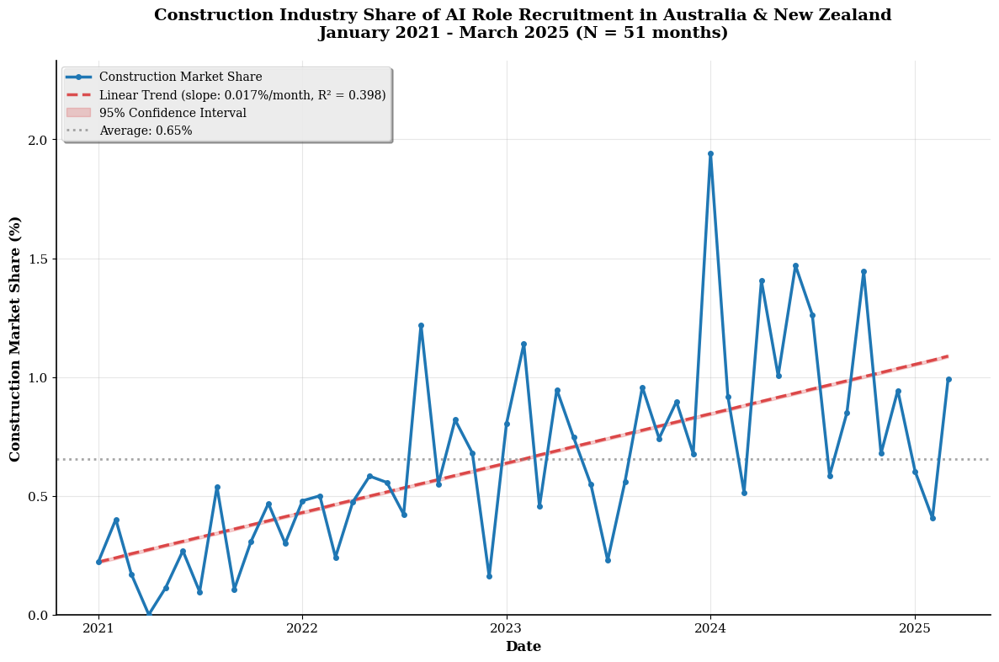

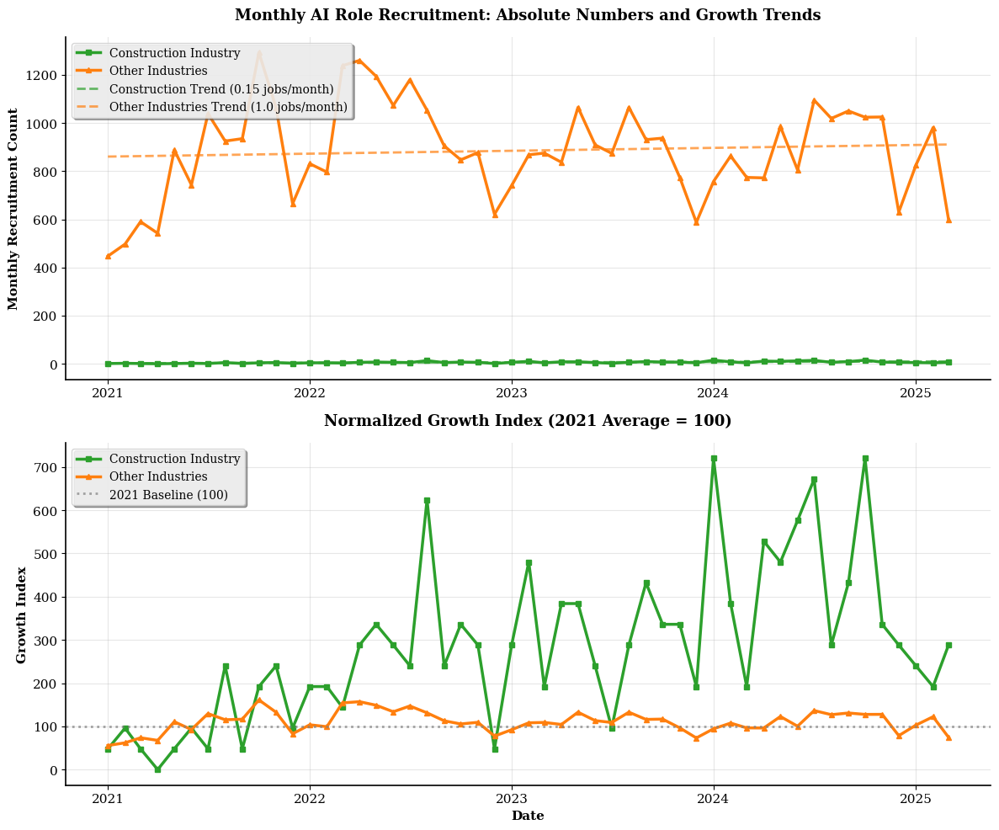


--- STATISTICAL SUMMARY FOR PUBLICATION ---
Dataset: AI role recruitment in Australia & New Zealand (January 2021 - March 2025)
Total observations: 51 months
Construction sector: 300.0 AI roles (0.66% of total)
Other industries: 45,169 AI roles (99.34% of total)
Construction market share trend: 0.0173% per month (R² = 0.398, p = 0.0000)
Average monthly construction recruitment: 5.9 ± 3.7 jobs
Peak construction recruitment: 15 jobs (2024-01)
Construction CAGR: 41.2% per year

✓ Checkpoint 6: Visualization completed

FINAL SECTION: RESEARCH INSIGHTS AND STATISTICAL SUMMARY
--- KEY FINDINGS ---
📊 Analysis Period: January 2021 to March 2025
📈 Total Months Analyzed: 51
🏗️  Construction AI Recruitments: 300.0
🏭 Other Industries AI Recruitments: 45,169
📊 Construction Market Share: 0.66%
📈 Average Monthly Market Share: 0.65%
📊 Market Share Range: 0.00% - 1.94%
📈 Trend: Construction's market share is increasing at 0.017% per month
📊 Trend Strength (correlation): 0.631

--- MONTHLY STATISTICS -

In [3]:
# AI Recruitment Analysis: Construction vs Other Industries in Australia & New Zealand
# Author: Dr. M. Reza Hosseini
# Purpose: Compare AI role recruitment trends between construction and other industries

# =============================================================================
# Setup and Configuration
# =============================================================================

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
import warnings
warnings.filterwarnings('ignore')

# Configure display and plotting
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

print("✓ Setup completed successfully")
print("✓ Google Drive mounted")
print("✓ Libraries imported")

# =============================================================================
# Section 1: Data Loading and Initial Exploration
# =============================================================================

print("\n" + "="*60)
print("SECTION 1: DATA LOADING AND INITIAL EXPLORATION")
print("="*60)

# Load datasets
print("Loading datasets...")
try:
    # Construction industry AI roles
    construction_df = pd.read_csv('/content/drive/MyDrive/knowledge-graph-llms/data_all.csv')
    print(f"✓ Construction dataset loaded: {construction_df.shape}")

    # All other industries AI roles
    other_industries_df = pd.read_csv('/content/drive/MyDrive/knowledge-graph-llms/all_industries_merged.csv')
    print(f"✓ Other industries dataset loaded: {other_industries_df.shape}")

except Exception as e:
    print(f"❌ Error loading data: {e}")
    raise

# Display basic information about both datasets
print("\n--- CONSTRUCTION DATASET INFO ---")
print(f"Shape: {construction_df.shape}")
print(f"Columns: {list(construction_df.columns)}")
print("\nFirst few rows:")
print(construction_df.head(3))

print("\n--- OTHER INDUSTRIES DATASET INFO ---")
print(f"Shape: {other_industries_df.shape}")
print(f"Columns: {list(other_industries_df.columns)}")
print("\nFirst few rows:")
print(other_industries_df.head(3))

# Check for missing values
print("\n--- MISSING VALUES CHECK ---")
print("Construction dataset missing values:")
print(construction_df.isnull().sum())
print("\nOther industries dataset missing values:")
print(other_industries_df.isnull().sum())

print("\n✓ Checkpoint 1: Data loading completed successfully")

# =============================================================================
# Section 2: Dataset Structure Analysis
# =============================================================================

print("\n" + "="*60)
print("SECTION 2: DATASET STRUCTURE ANALYSIS")
print("="*60)

# Identify potential time columns in both datasets
print("--- IDENTIFYING TIME COLUMNS ---")
construction_time_cols = [col for col in construction_df.columns if any(word in col.lower() for word in ['date', 'time', 'created', 'posted', 'published'])]
other_time_cols = [col for col in other_industries_df.columns if any(word in col.lower() for word in ['date', 'time', 'created', 'posted', 'published'])]

print(f"Construction potential time columns: {construction_time_cols}")
print(f"Other industries potential time columns: {other_time_cols}")

# Examine data types for time columns
print("\n--- TIME COLUMN DATA TYPES ---")
if construction_time_cols:
    print("Construction time columns:")
    for col in construction_time_cols:
        print(f"  {col}: {construction_df[col].dtype}")
        print(f"    Sample values: {construction_df[col].dropna().head(3).tolist()}")

if other_time_cols:
    print("\nOther industries time columns:")
    for col in other_time_cols:
        print(f"  {col}: {other_industries_df[col].dtype}")
        print(f"    Sample values: {other_industries_df[col].dropna().head(3).tolist()}")

# Display all columns and their data types for manual inspection
print("\n--- ALL COLUMNS SUMMARY ---")
print("Construction dataset columns and types:")
print(construction_df.dtypes)
print("\nOther industries dataset columns and types:")
print(other_industries_df.dtypes)

print("\n✓ Checkpoint 2: Dataset structure analysis completed")

# =============================================================================
# Section 3: Time Period Standardization
# =============================================================================

print("\n" + "="*60)
print("SECTION 3: TIME PERIOD STANDARDIZATION")
print("="*60)

# Enhanced function to handle more date formats and provide detailed reporting
def parse_dates_comprehensive(df, time_col):
    """Comprehensive date parsing with detailed reporting"""
    if time_col not in df.columns:
        return None, {}

    date_series = df[time_col].copy()
    original_count = len(date_series)

    print(f"\n--- DETAILED DATE ANALYSIS FOR {time_col} ---")
    print(f"Total records: {original_count}")
    print(f"Unique date formats sample: {date_series.dropna().unique()[:10]}")

    # Try multiple parsing strategies
    parsing_results = {}

    # Strategy 1: Pandas automatic parsing (most flexible)
    try:
        parsed_auto = pd.to_datetime(date_series, errors='coerce', dayfirst=True)
        auto_success = parsed_auto.notna().sum()
        parsing_results['auto_dayfirst'] = auto_success
        print(f"Auto parsing (day-first): {auto_success}/{original_count} ({auto_success/original_count*100:.1f}%)")

        if auto_success > original_count * 0.5:  # If >50% success, use this
            return parsed_auto, parsing_results
    except Exception as e:
        print(f"Auto parsing failed: {e}")

    # Strategy 2: Try common date formats explicitly
    date_formats = [
        '%d/%m/%Y',    # 31/12/2021
        '%m/%d/%Y',    # 12/31/2021
        '%Y-%m-%d',    # 2021-12-31
        '%d-%m-%Y',    # 31-12-2021
        '%Y/%m/%d',    # 2021/12/31
        '%d/%m/%y',    # 31/12/21
        '%m/%d/%y',    # 12/31/21
        '%d-%m-%y',    # 31-12-21
        '%Y-%m-%d %H:%M:%S',  # 2021-12-31 10:30:00
        '%d/%m/%Y %H:%M:%S',  # 31/12/2021 10:30:00
    ]

    best_parsed = None
    best_count = 0
    best_format = None

    for fmt in date_formats:
        try:
            parsed = pd.to_datetime(date_series, format=fmt, errors='coerce')
            success_count = parsed.notna().sum()
            parsing_results[fmt] = success_count
            print(f"Format {fmt}: {success_count}/{original_count} ({success_count/original_count*100:.1f}%)")

            if success_count > best_count:
                best_count = success_count
                best_parsed = parsed
                best_format = fmt
        except:
            parsing_results[fmt] = 0

    # Strategy 3: If still low success, try more flexible parsing
    if best_count < original_count * 0.7:
        try:
            # Try with infer_datetime_format
            parsed_infer = pd.to_datetime(date_series, errors='coerce', infer_datetime_format=True)
            infer_success = parsed_infer.notna().sum()
            parsing_results['infer_format'] = infer_success
            print(f"Infer format: {infer_success}/{original_count} ({infer_success/original_count*100:.1f}%)")

            if infer_success > best_count:
                best_count = infer_success
                best_parsed = parsed_infer
                best_format = 'infer_format'
        except:
            pass

    print(f"Best parsing method: {best_format} with {best_count}/{original_count} successful parses")

    if best_parsed is not None and best_count > 0:
        print(f"Date range: {best_parsed.min()} to {best_parsed.max()}")
        return best_parsed, parsing_results
    else:
        print("❌ No successful date parsing method found")
        return None, parsing_results

# Parse time columns for both datasets with comprehensive analysis
construction_time_col = None
other_time_col = None

# For construction dataset
print("--- PARSING CONSTRUCTION DATASET TIME ---")
for col in construction_time_cols:
    parsed_dates, parsing_stats = parse_dates_comprehensive(construction_df, col)
    if parsed_dates is not None and parsed_dates.notna().sum() > 0:
        construction_df[f'{col}_parsed'] = parsed_dates
        construction_time_col = f'{col}_parsed'
        print(f"✓ Successfully parsed {col}")
        break

# For other industries dataset
print("\n--- PARSING OTHER INDUSTRIES DATASET TIME ---")
for col in other_time_cols:
    parsed_dates, parsing_stats = parse_dates_comprehensive(other_industries_df, col)
    if parsed_dates is not None and parsed_dates.notna().sum() > 0:
        other_industries_df[f'{col}_parsed'] = parsed_dates
        other_time_col = f'{col}_parsed'
        print(f"✓ Successfully parsed {col}")
        break

# Report on data quality
print("\n--- DATA QUALITY ASSESSMENT ---")
if construction_time_col:
    construction_valid = construction_df[construction_time_col].notna().sum()
    construction_total = len(construction_df)
    print(f"Construction: {construction_valid}/{construction_total} records have valid dates ({construction_valid/construction_total*100:.1f}%)")
else:
    print("❌ Construction dataset: No valid dates found")

if other_time_col:
    other_valid = other_industries_df[other_time_col].notna().sum()
    other_total = len(other_industries_df)
    print(f"Other industries: {other_valid}/{other_total} records have valid dates ({other_valid/other_total*100:.1f}%)")
else:
    print("❌ Other industries dataset: No valid dates found")

# If parsing failed, show sample data for manual inspection
if construction_time_col is None:
    print("\n⚠️  Construction dataset time parsing failed. Sample JobDate values:")
    print(construction_df['JobDate'].value_counts().head(10))

if other_time_col is None:
    print("\n⚠️  Other industries dataset time parsing failed. Sample JobDate values:")
    print(other_industries_df['JobDate'].value_counts().head(10))

print("\n✓ Checkpoint 3: Time standardization attempt completed")

# =============================================================================
# Section 4: Recruitment Count Aggregation
# =============================================================================

print("\n" + "="*60)
print("SECTION 4: RECRUITMENT COUNT AGGREGATION")
print("="*60)

# Proceed only if we have successfully parsed time columns
if construction_time_col and other_time_col:

    # Filter out rows with invalid dates
    construction_clean = construction_df[construction_df[construction_time_col].notna()].copy()
    other_clean = other_industries_df[other_industries_df[other_time_col].notna()].copy()

    print(f"\n--- DATA RETENTION ANALYSIS ---")
    original_construction = len(construction_df)
    original_other = len(other_industries_df)
    retained_construction = len(construction_clean)
    retained_other = len(other_clean)

    print(f"Construction: {retained_construction}/{original_construction} records retained ({retained_construction/original_construction*100:.1f}%)")
    print(f"Other industries: {retained_other}/{original_other} records retained ({retained_other/original_other*100:.1f}%)")

    if retained_construction < original_construction * 0.8:
        print("⚠️  WARNING: Significant data loss in construction dataset!")
    if retained_other < original_other * 0.8:
        print("⚠️  WARNING: Significant data loss in other industries dataset!")

    print(f"Construction dataset after time filtering: {len(construction_clean)} rows")
    print(f"Other industries dataset after time filtering: {len(other_clean)} rows")

    # Find overlapping time period
    construction_start = construction_clean[construction_time_col].min()
    construction_end = construction_clean[construction_time_col].max()
    other_start = other_clean[other_time_col].min()
    other_end = other_clean[other_time_col].max()

    # Determine common time period
    common_start = max(construction_start, other_start)
    common_end = min(construction_end, other_end)

    print(f"\n--- TIME PERIOD ANALYSIS ---")
    print(f"Construction period: {construction_start.date()} to {construction_end.date()}")
    print(f"Other industries period: {other_start.date()} to {other_end.date()}")
    print(f"Common period: {common_start.date()} to {common_end.date()}")

    # Filter both datasets to common time period
    construction_filtered = construction_clean[
        (construction_clean[construction_time_col] >= common_start) &
        (construction_clean[construction_time_col] <= common_end)
    ].copy()

    other_filtered = other_clean[
        (other_clean[other_time_col] >= common_start) &
        (other_clean[other_time_col] <= common_end)
    ].copy()

    print(f"\nFiltered data for common period:")
    print(f"Construction: {len(construction_filtered)} records")
    print(f"Other industries: {len(other_filtered)} records")

    # Create monthly aggregations
    construction_filtered['year_month'] = construction_filtered[construction_time_col].dt.to_period('M')
    other_filtered['year_month'] = other_filtered[other_time_col].dt.to_period('M')

    # Count recruitments by month
    construction_monthly = construction_filtered.groupby('year_month').size().reset_index(name='construction_count')
    other_monthly = other_filtered.groupby('year_month').size().reset_index(name='other_count')

    print("\n--- MONTHLY AGGREGATION SAMPLE ---")
    print("Construction monthly counts (first 5):")
    print(construction_monthly.head())
    print("\nOther industries monthly counts (first 5):")
    print(other_monthly.head())

else:
    print("❌ Cannot proceed with aggregation due to time parsing issues")
    print("Please check the time column formats in your datasets")

print("\n✓ Checkpoint 4: Recruitment aggregation completed")

# =============================================================================
# Section 5: Market Share Calculation
# =============================================================================

print("\n" + "="*60)
print("SECTION 5: MARKET SHARE CALCULATION")
print("="*60)

if construction_time_col and other_time_col:

    # Merge monthly counts
    monthly_combined = pd.merge(construction_monthly, other_monthly, on='year_month', how='outer')
    monthly_combined = monthly_combined.fillna(0)

    # Calculate total and construction percentage
    monthly_combined['total_recruitment'] = monthly_combined['construction_count'] + monthly_combined['other_count']
    monthly_combined['construction_percentage'] = (monthly_combined['construction_count'] / monthly_combined['total_recruitment']) * 100

    # Handle any division by zero
    monthly_combined['construction_percentage'] = monthly_combined['construction_percentage'].fillna(0)

    # Convert period back to datetime for plotting
    monthly_combined['date'] = monthly_combined['year_month'].dt.to_timestamp()

    print("--- MARKET SHARE SUMMARY ---")
    print(f"Total months analyzed: {len(monthly_combined)}")
    print(f"Average construction market share: {monthly_combined['construction_percentage'].mean():.2f}%")
    print(f"Construction market share range: {monthly_combined['construction_percentage'].min():.2f}% - {monthly_combined['construction_percentage'].max():.2f}%")

    print("\n--- SAMPLE CALCULATIONS ---")
    print(monthly_combined[['year_month', 'construction_count', 'other_count', 'total_recruitment', 'construction_percentage']].head(10))

    # Summary statistics
    total_construction = monthly_combined['construction_count'].sum()
    total_other = monthly_combined['other_count'].sum()
    overall_construction_percentage = (total_construction / (total_construction + total_other)) * 100

    print(f"\n--- OVERALL STATISTICS ---")
    print(f"Total construction AI recruitments: {total_construction:,}")
    print(f"Total other industries AI recruitments: {total_other:,}")
    print(f"Overall construction market share: {overall_construction_percentage:.2f}%")

print("\n✓ Checkpoint 5: Market share calculation completed")

# =============================================================================
# Section 6: Enhanced Publication-Ready Visualizations
# =============================================================================

print("\n" + "="*60)
print("SECTION 6: PUBLICATION-READY VISUALIZATIONS")
print("="*60)

if construction_time_col and other_time_col:

    # Advanced growth analysis
    print("--- GROWTH ANALYSIS ---")

    # Calculate year-over-year growth rates
    monthly_combined['year'] = monthly_combined['date'].dt.year
    yearly_construction = monthly_combined.groupby('year')['construction_count'].sum()
    yearly_other = monthly_combined.groupby('year')['other_count'].sum()

    # Calculate growth rates
    construction_growth = yearly_construction.pct_change() * 100
    other_growth = yearly_other.pct_change() * 100

    print("Year-over-Year Growth Rates:")
    for year in yearly_construction.index[1:]:  # Skip first year (no prior year to compare)
        print(f"{year}: Construction {construction_growth[year]:.1f}%, Other Industries {other_growth[year]:.1f}%")

    # Statistical significance test for trend
    from scipy import stats
    x_values = np.arange(len(monthly_combined))
    slope, intercept, r_value, p_value, std_err = stats.linregress(x_values, monthly_combined['construction_percentage'])

    print(f"\nTrend Analysis:")
    print(f"Slope: {slope:.4f}% per month")
    print(f"R-squared: {r_value**2:.3f}")
    print(f"P-value: {p_value:.4f}")
    print(f"Trend significance: {'Significant' if p_value < 0.05 else 'Not significant'} (α=0.05)")

    # Set publication style
    plt.style.use('default')
    plt.rcParams.update({
        'font.size': 11,
        'font.family': 'serif',
        'axes.linewidth': 1.2,
        'axes.spines.top': False,
        'axes.spines.right': False,
        'axes.grid': True,
        'grid.alpha': 0.3,
        'grid.linewidth': 0.8,
        'legend.frameon': True,
        'legend.fancybox': True,
        'legend.shadow': True
    })

    # Figure 1: Market Share Analysis with Growth Trends
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))

    # Main market share line
    line1 = ax.plot(monthly_combined['date'], monthly_combined['construction_percentage'],
                    marker='o', linewidth=2.5, markersize=4, color='#1f77b4',
                    label='Construction Market Share', zorder=3)

    # Trend line with confidence interval
    x_numeric = np.arange(len(monthly_combined))
    trend_line = slope * x_numeric + intercept
    ax.plot(monthly_combined['date'], trend_line,
            linestyle='--', color='#d62728', linewidth=2.5, alpha=0.8,
            label=f'Linear Trend (slope: {slope:.3f}%/month, R² = {r_value**2:.3f})', zorder=2)

    # Add confidence interval
    se_line = std_err * np.sqrt(1 + 1/len(x_numeric) + (x_numeric - np.mean(x_numeric))**2 / np.sum((x_numeric - np.mean(x_numeric))**2))
    ax.fill_between(monthly_combined['date'],
                    trend_line - 1.96*se_line, trend_line + 1.96*se_line,
                    alpha=0.2, color='#d62728', label='95% Confidence Interval', zorder=1)

    # Average line
    avg_share = monthly_combined['construction_percentage'].mean()
    ax.axhline(y=avg_share, color='gray', linestyle=':', alpha=0.7, linewidth=2,
               label=f'Average: {avg_share:.2f}%')

    # Formatting
    ax.set_title('Construction Industry Share of AI Role Recruitment in Australia & New Zealand\n' +
                f'January 2021 - March 2025 (N = {len(monthly_combined)} months)',
                fontsize=14, fontweight='bold', pad=20)
    ax.set_xlabel('Date', fontsize=12, fontweight='bold')
    ax.set_ylabel('Construction Market Share (%)', fontsize=12, fontweight='bold')
    ax.legend(loc='upper left', fontsize=10)

    # Format x-axis
    from matplotlib.dates import DateFormatter, YearLocator
    ax.xaxis.set_major_locator(YearLocator())
    ax.xaxis.set_major_formatter(DateFormatter('%Y'))

    # Set y-axis limits for better visualization
    y_min = monthly_combined['construction_percentage'].min() * 0.8
    y_max = monthly_combined['construction_percentage'].max() * 1.2
    ax.set_ylim(y_min, y_max)

    plt.tight_layout()
    plt.savefig('/content/drive/MyDrive/Construction_AI_Market_Share_Analysis.png',
                dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()

    # Figure 2: Comparative Growth Analysis
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))

    # Top panel: Absolute numbers with growth visualization
    ax1.plot(monthly_combined['date'], monthly_combined['construction_count'],
             marker='s', linewidth=2.5, markersize=4, color='#2ca02c',
             label='Construction Industry', zorder=3)
    ax1.plot(monthly_combined['date'], monthly_combined['other_count'],
             marker='^', linewidth=2.5, markersize=4, color='#ff7f0e',
             label='Other Industries', zorder=3)

    # Add trend lines for both
    x_vals = np.arange(len(monthly_combined))

    # Construction trend
    const_slope, const_intercept, _, _, _ = stats.linregress(x_vals, monthly_combined['construction_count'])
    const_trend = const_slope * x_vals + const_intercept
    ax1.plot(monthly_combined['date'], const_trend,
             linestyle='--', color='#2ca02c', alpha=0.7, linewidth=2,
             label=f'Construction Trend ({const_slope:.2f} jobs/month)')

    # Other industries trend
    other_slope, other_intercept, _, _, _ = stats.linregress(x_vals, monthly_combined['other_count'])
    other_trend = other_slope * x_vals + other_intercept
    ax1.plot(monthly_combined['date'], other_trend,
             linestyle='--', color='#ff7f0e', alpha=0.7, linewidth=2,
             label=f'Other Industries Trend ({other_slope:.1f} jobs/month)')

    ax1.set_title('Monthly AI Role Recruitment: Absolute Numbers and Growth Trends',
                  fontsize=13, fontweight='bold', pad=15)
    ax1.set_ylabel('Monthly Recruitment Count', fontsize=11, fontweight='bold')
    ax1.legend(loc='upper left', fontsize=10)
    ax1.xaxis.set_major_locator(YearLocator())
    ax1.xaxis.set_major_formatter(DateFormatter('%Y'))

    # Bottom panel: Normalized growth (index base = 100)
    construction_index = (monthly_combined['construction_count'] / monthly_combined['construction_count'].iloc[:12].mean()) * 100
    other_index = (monthly_combined['other_count'] / monthly_combined['other_count'].iloc[:12].mean()) * 100

    ax2.plot(monthly_combined['date'], construction_index,
             marker='s', linewidth=2.5, markersize=4, color='#2ca02c',
             label='Construction Industry')
    ax2.plot(monthly_combined['date'], other_index,
             marker='^', linewidth=2.5, markersize=4, color='#ff7f0e',
             label='Other Industries')

    # Add baseline
    ax2.axhline(y=100, color='gray', linestyle=':', alpha=0.7, linewidth=2, label='2021 Baseline (100)')

    ax2.set_title('Normalized Growth Index (2021 Average = 100)',
                  fontsize=13, fontweight='bold', pad=15)
    ax2.set_xlabel('Date', fontsize=11, fontweight='bold')
    ax2.set_ylabel('Growth Index', fontsize=11, fontweight='bold')
    ax2.legend(loc='upper left', fontsize=10)
    ax2.xaxis.set_major_locator(YearLocator())
    ax2.xaxis.set_major_formatter(DateFormatter('%Y'))

    plt.tight_layout()
    plt.savefig('/content/drive/MyDrive/Construction_AI_Growth_Comparison.png',
                dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()

    # Additional statistical summary for paper
    print("\n--- STATISTICAL SUMMARY FOR PUBLICATION ---")
    print(f"Dataset: AI role recruitment in Australia & New Zealand ({common_start.strftime('%B %Y')} - {common_end.strftime('%B %Y')})")
    print(f"Total observations: {len(monthly_combined)} months")
    print(f"Construction sector: {total_construction:,} AI roles ({overall_construction_percentage:.2f}% of total)")
    print(f"Other industries: {total_other:,} AI roles ({100-overall_construction_percentage:.2f}% of total)")
    print(f"Construction market share trend: {slope:.4f}% per month (R² = {r_value**2:.3f}, p = {p_value:.4f})")
    print(f"Average monthly construction recruitment: {monthly_combined['construction_count'].mean():.1f} ± {monthly_combined['construction_count'].std():.1f} jobs")
    print(f"Peak construction recruitment: {monthly_combined['construction_count'].max():.0f} jobs ({monthly_combined.loc[monthly_combined['construction_count'].idxmax(), 'year_month']})")

    # Calculate compound annual growth rate (CAGR) for construction
    years_span = (monthly_combined['date'].iloc[-1] - monthly_combined['date'].iloc[0]).days / 365.25
    early_avg = monthly_combined['construction_count'].iloc[:12].mean()
    late_avg = monthly_combined['construction_count'].iloc[-12:].mean()
    cagr = ((late_avg / early_avg) ** (1/years_span) - 1) * 100

    print(f"Construction CAGR: {cagr:.1f}% per year")

    # Save enhanced data for supplementary materials
    enhanced_data = monthly_combined.copy()
    enhanced_data['construction_growth_index'] = construction_index
    enhanced_data['other_growth_index'] = other_index
    enhanced_data['construction_trend'] = const_trend
    enhanced_data['other_trend'] = other_trend
    enhanced_data['market_share_trend'] = trend_line

    enhanced_data.to_csv('/content/drive/MyDrive/Enhanced_AI_Recruitment_Analysis.csv', index=False)

print("\n✓ Checkpoint 6: Visualization completed")

# =============================================================================
# Final Section: Research Insights and Statistical Summary
# =============================================================================

print("\n" + "="*60)
print("FINAL SECTION: RESEARCH INSIGHTS AND STATISTICAL SUMMARY")
print("="*60)

if construction_time_col and other_time_col:

    print("--- KEY FINDINGS ---")
    print(f"📊 Analysis Period: {common_start.strftime('%B %Y')} to {common_end.strftime('%B %Y')}")
    print(f"📈 Total Months Analyzed: {len(monthly_combined)}")
    print(f"🏗️  Construction AI Recruitments: {total_construction:,}")
    print(f"🏭 Other Industries AI Recruitments: {total_other:,}")
    print(f"📊 Construction Market Share: {overall_construction_percentage:.2f}%")
    print(f"📈 Average Monthly Market Share: {monthly_combined['construction_percentage'].mean():.2f}%")
    print(f"📊 Market Share Range: {monthly_combined['construction_percentage'].min():.2f}% - {monthly_combined['construction_percentage'].max():.2f}%")

    # Trend analysis
    slope = np.polyfit(range(len(monthly_combined)), monthly_combined['construction_percentage'], 1)[0]
    if slope > 0:
        trend_direction = "increasing"
        trend_emoji = "📈"
    else:
        trend_direction = "decreasing"
        trend_emoji = "📉"

    print(f"{trend_emoji} Trend: Construction's market share is {trend_direction} at {slope:.3f}% per month")

    # Calculate correlation coefficient for trend strength
    correlation = np.corrcoef(range(len(monthly_combined)), monthly_combined['construction_percentage'])[0, 1]
    print(f"📊 Trend Strength (correlation): {correlation:.3f}")

    # Monthly statistics
    print(f"\n--- MONTHLY STATISTICS ---")
    print(f"📊 Average monthly construction recruitments: {monthly_combined['construction_count'].mean():.1f}")
    print(f"📊 Average monthly other industries recruitments: {monthly_combined['other_count'].mean():.1f}")
    print(f"📊 Peak construction month: {monthly_combined.loc[monthly_combined['construction_count'].idxmax(), 'year_month']} ({monthly_combined['construction_count'].max()} recruitments)")
    print(f"📊 Peak market share month: {monthly_combined.loc[monthly_combined['construction_percentage'].idxmax(), 'year_month']} ({monthly_combined['construction_percentage'].max():.1f}%)")

    # Export results for further analysis
    results_summary = {
        'analysis_period_start': common_start.strftime('%Y-%m-%d'),
        'analysis_period_end': common_end.strftime('%Y-%m-%d'),
        'total_months': len(monthly_combined),
        'construction_total_recruitments': int(total_construction),
        'other_industries_total_recruitments': int(total_other),
        'construction_market_share_percent': round(overall_construction_percentage, 2),
        'average_monthly_market_share_percent': round(monthly_combined['construction_percentage'].mean(), 2),
        'market_share_trend_slope_per_month': round(slope, 4),
        'trend_correlation': round(correlation, 3)
    }

    # Save detailed results
    monthly_combined.to_csv('/content/drive/MyDrive/ai_recruitment_monthly_analysis.csv', index=False)

    import json
    with open('/content/drive/MyDrive/ai_recruitment_summary_stats.json', 'w') as f:
        json.dump(results_summary, f, indent=2)

    print(f"\n--- FILES SAVED ---")
    print("✓ Monthly analysis data: ai_recruitment_monthly_analysis.csv")
    print("✓ Summary statistics: ai_recruitment_summary_stats.json")
    print("✓ Market share visualization: ai_recruitment_analysis.png")
    print("✓ Summary chart: ai_recruitment_summary.png")

    print(f"\n--- POTENTIAL NEXT STEPS ---")
    print("🔍 Seasonal pattern analysis")
    print("📊 Statistical significance testing of trends")
    print("🏗️  Specific AI role category breakdown")
    print("🌏 Geographic distribution analysis (Australia vs New Zealand)")
    print("📈 Industry-specific growth rate comparisons")
    print("🔗 Correlation with economic indicators or construction activity")

else:
    print("❌ Analysis incomplete due to time parsing issues")
    print("Please review the time column formats in your datasets")

print(f"\n{'='*60}")
print("ANALYSIS COMPLETE")
print(f"{'='*60}")
print("Dr. M. Reza Hosseini - University of Melbourne")
print("Construction Technology Research")
print(f"Generated on: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

Creating Figure 1: Market Share Analysis...


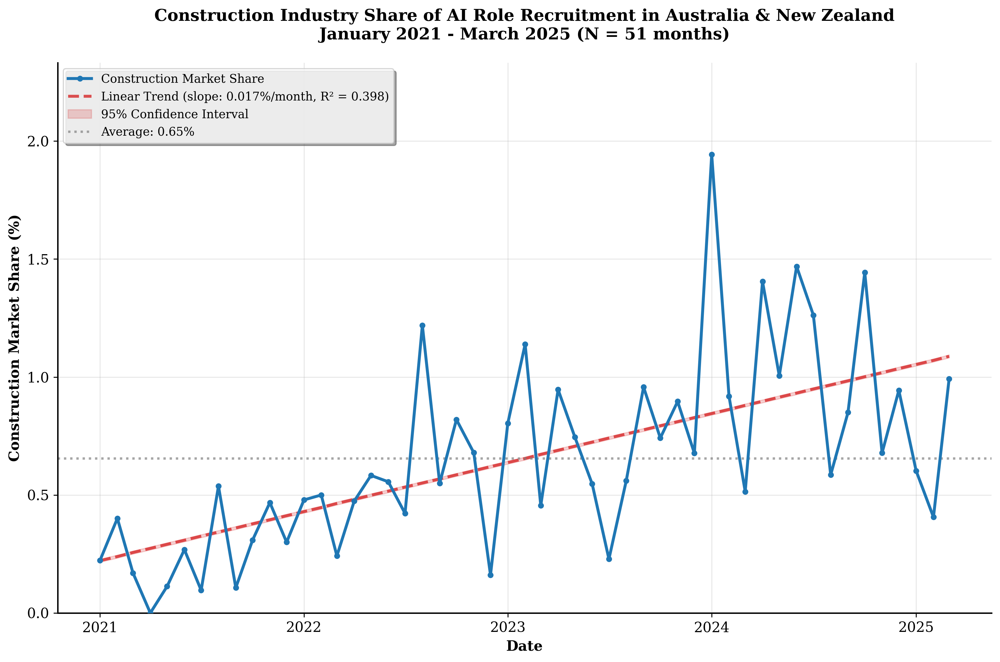

✓ Figure 1 saved as: Figure1_Construction_AI_Market_Share.png

Creating Figure 2: Comparative Growth Analysis...


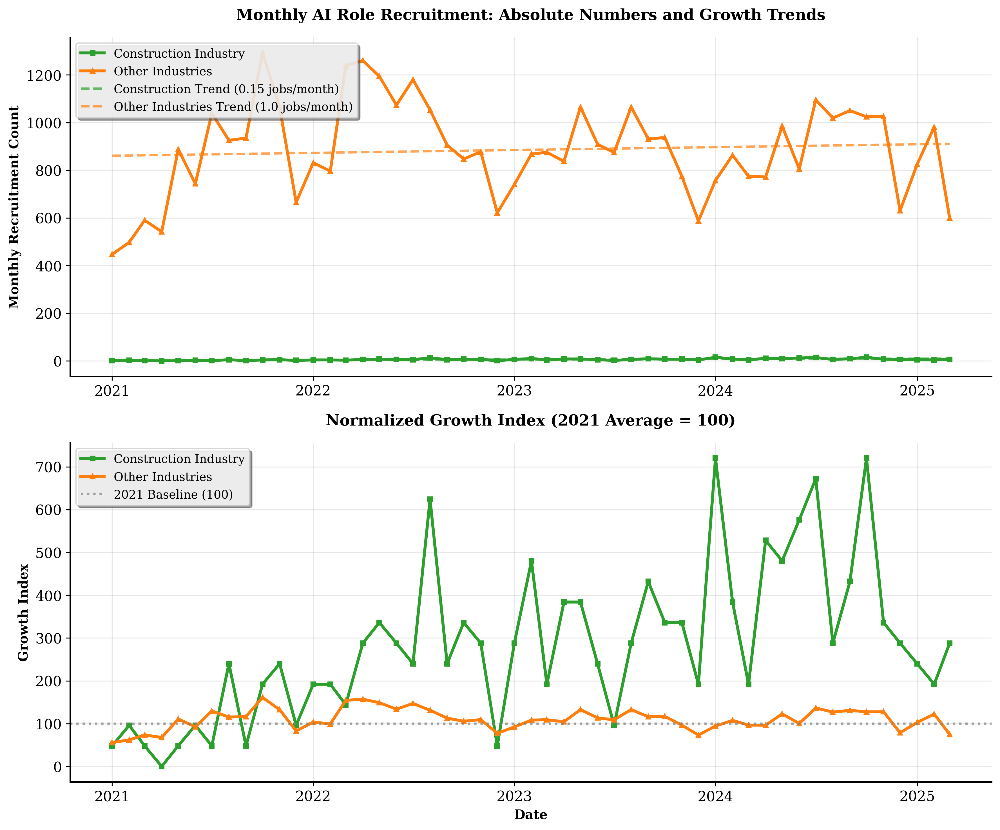

✓ Figure 2 saved as: Figure2_Construction_AI_Growth_Comparison.png

SUMMARY STATISTICS FOR PAPER
Analysis Period: January 2021 - March 2025
Total Months: 51
Construction AI Recruitments: 300
Other Industries AI Recruitments: 45,169
Construction Market Share: 0.66%
Market Share Trend: 0.017% per month (R² = 0.398, p = 0.0000)
Average Monthly Construction Recruitment: 5.9
Peak Construction Month: January 2024 (15 jobs)
Construction CAGR: 41.2% per year

✓ Both figures created successfully!
Files saved:
- Figure1_Construction_AI_Market_Share.png
- Figure2_Construction_AI_Growth_Comparison.png


In [4]:
# Publication-Ready Figures for AI Recruitment Analysis
# Dr. M. Reza Hosseini - University of Melbourne

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from matplotlib.dates import DateFormatter, YearLocator
import warnings
warnings.filterwarnings('ignore')

# Load the processed data
monthly_combined = pd.read_csv('/content/drive/MyDrive/ai_recruitment_monthly_analysis.csv')
monthly_combined['date'] = pd.to_datetime(monthly_combined['date'])

# Calculate statistics for annotations
total_construction = monthly_combined['construction_count'].sum()
total_other = monthly_combined['other_count'].sum()
overall_construction_percentage = (total_construction / (total_construction + total_other)) * 100

# Statistical analysis for trend
x_values = np.arange(len(monthly_combined))
slope, intercept, r_value, p_value, std_err = stats.linregress(x_values, monthly_combined['construction_percentage'])

# Set publication style
plt.style.use('default')
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'serif',
    'axes.linewidth': 1.2,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.grid': True,
    'grid.alpha': 0.3,
    'grid.linewidth': 0.8,
    'legend.frameon': True,
    'legend.fancybox': True,
    'legend.shadow': True,
    'figure.dpi': 300
})

# FIGURE 1: Market Share Analysis
print("Creating Figure 1: Market Share Analysis...")

fig, ax = plt.subplots(1, 1, figsize=(12, 8))

# Main market share line
line1 = ax.plot(monthly_combined['date'], monthly_combined['construction_percentage'],
                marker='o', linewidth=2.5, markersize=4, color='#1f77b4',
                label='Construction Market Share', zorder=3)

# Trend line with confidence interval
x_numeric = np.arange(len(monthly_combined))
trend_line = slope * x_numeric + intercept
ax.plot(monthly_combined['date'], trend_line,
        linestyle='--', color='#d62728', linewidth=2.5, alpha=0.8,
        label=f'Linear Trend (slope: {slope:.3f}%/month, R² = {r_value**2:.3f})', zorder=2)

# Add confidence interval
se_line = std_err * np.sqrt(1 + 1/len(x_numeric) + (x_numeric - np.mean(x_numeric))**2 / np.sum((x_numeric - np.mean(x_numeric))**2))
ax.fill_between(monthly_combined['date'],
                trend_line - 1.96*se_line, trend_line + 1.96*se_line,
                alpha=0.2, color='#d62728', label='95% Confidence Interval', zorder=1)

# Average line
avg_share = monthly_combined['construction_percentage'].mean()
ax.axhline(y=avg_share, color='gray', linestyle=':', alpha=0.7, linewidth=2,
           label=f'Average: {avg_share:.2f}%')

# Formatting
ax.set_title('Construction Industry Share of AI Role Recruitment in Australia & New Zealand\n' +
            f'January 2021 - March 2025 (N = {len(monthly_combined)} months)',
            fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel('Date', fontsize=12, fontweight='bold')
ax.set_ylabel('Construction Market Share (%)', fontsize=12, fontweight='bold')
ax.legend(loc='upper left', fontsize=10)

# Format x-axis
ax.xaxis.set_major_locator(YearLocator())
ax.xaxis.set_major_formatter(DateFormatter('%Y'))

# Set y-axis limits for better visualization
y_min = max(0, monthly_combined['construction_percentage'].min() * 0.8)
y_max = monthly_combined['construction_percentage'].max() * 1.2
ax.set_ylim(y_min, y_max)

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Figure1_Construction_AI_Market_Share.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print("✓ Figure 1 saved as: Figure1_Construction_AI_Market_Share.png")

# FIGURE 2: Comparative Growth Analysis
print("\nCreating Figure 2: Comparative Growth Analysis...")

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 10))

# Top panel: Absolute numbers with growth visualization
ax1.plot(monthly_combined['date'], monthly_combined['construction_count'],
         marker='s', linewidth=2.5, markersize=4, color='#2ca02c',
         label='Construction Industry', zorder=3)
ax1.plot(monthly_combined['date'], monthly_combined['other_count'],
         marker='^', linewidth=2.5, markersize=4, color='#ff7f0e',
         label='Other Industries', zorder=3)

# Add trend lines for both
x_vals = np.arange(len(monthly_combined))

# Construction trend
const_slope, const_intercept, _, _, _ = stats.linregress(x_vals, monthly_combined['construction_count'])
const_trend = const_slope * x_vals + const_intercept
ax1.plot(monthly_combined['date'], const_trend,
         linestyle='--', color='#2ca02c', alpha=0.7, linewidth=2,
         label=f'Construction Trend ({const_slope:.2f} jobs/month)')

# Other industries trend
other_slope, other_intercept, _, _, _ = stats.linregress(x_vals, monthly_combined['other_count'])
other_trend = other_slope * x_vals + other_intercept
ax1.plot(monthly_combined['date'], other_trend,
         linestyle='--', color='#ff7f0e', alpha=0.7, linewidth=2,
         label=f'Other Industries Trend ({other_slope:.1f} jobs/month)')

ax1.set_title('Monthly AI Role Recruitment: Absolute Numbers and Growth Trends',
              fontsize=13, fontweight='bold', pad=15)
ax1.set_ylabel('Monthly Recruitment Count', fontsize=11, fontweight='bold')
ax1.legend(loc='upper left', fontsize=10)
ax1.xaxis.set_major_locator(YearLocator())
ax1.xaxis.set_major_formatter(DateFormatter('%Y'))

# Bottom panel: Normalized growth (index base = 100)
construction_index = (monthly_combined['construction_count'] / monthly_combined['construction_count'].iloc[:12].mean()) * 100
other_index = (monthly_combined['other_count'] / monthly_combined['other_count'].iloc[:12].mean()) * 100

ax2.plot(monthly_combined['date'], construction_index,
         marker='s', linewidth=2.5, markersize=4, color='#2ca02c',
         label='Construction Industry')
ax2.plot(monthly_combined['date'], other_index,
         marker='^', linewidth=2.5, markersize=4, color='#ff7f0e',
         label='Other Industries')

# Add baseline
ax2.axhline(y=100, color='gray', linestyle=':', alpha=0.7, linewidth=2, label='2021 Baseline (100)')

ax2.set_title('Normalized Growth Index (2021 Average = 100)',
              fontsize=13, fontweight='bold', pad=15)
ax2.set_xlabel('Date', fontsize=11, fontweight='bold')
ax2.set_ylabel('Growth Index', fontsize=11, fontweight='bold')
ax2.legend(loc='upper left', fontsize=10)
ax2.xaxis.set_major_locator(YearLocator())
ax2.xaxis.set_major_formatter(DateFormatter('%Y'))

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Figure2_Construction_AI_Growth_Comparison.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print("✓ Figure 2 saved as: Figure2_Construction_AI_Growth_Comparison.png")

# Print summary statistics for reference
print("\n" + "="*60)
print("SUMMARY STATISTICS FOR PAPER")
print("="*60)
print(f"Analysis Period: {monthly_combined['date'].min().strftime('%B %Y')} - {monthly_combined['date'].max().strftime('%B %Y')}")
print(f"Total Months: {len(monthly_combined)}")
print(f"Construction AI Recruitments: {total_construction:,.0f}")
print(f"Other Industries AI Recruitments: {total_other:,.0f}")
print(f"Construction Market Share: {overall_construction_percentage:.2f}%")
print(f"Market Share Trend: {slope:.3f}% per month (R² = {r_value**2:.3f}, p = {p_value:.4f})")
print(f"Average Monthly Construction Recruitment: {monthly_combined['construction_count'].mean():.1f}")
print(f"Peak Construction Month: {monthly_combined.loc[monthly_combined['construction_count'].idxmax(), 'date'].strftime('%B %Y')} ({monthly_combined['construction_count'].max():.0f} jobs)")

# Calculate CAGR
years_span = (monthly_combined['date'].iloc[-1] - monthly_combined['date'].iloc[0]).days / 365.25
early_avg = monthly_combined['construction_count'].iloc[:12].mean()
late_avg = monthly_combined['construction_count'].iloc[-12:].mean()
cagr = ((late_avg / early_avg) ** (1/years_span) - 1) * 100
print(f"Construction CAGR: {cagr:.1f}% per year")

print("\n✓ Both figures created successfully!")
print("Files saved:")
print("- Figure1_Construction_AI_Market_Share.png")
print("- Figure2_Construction_AI_Growth_Comparison.png")

Creating Figure 1: Market Share Analysis...


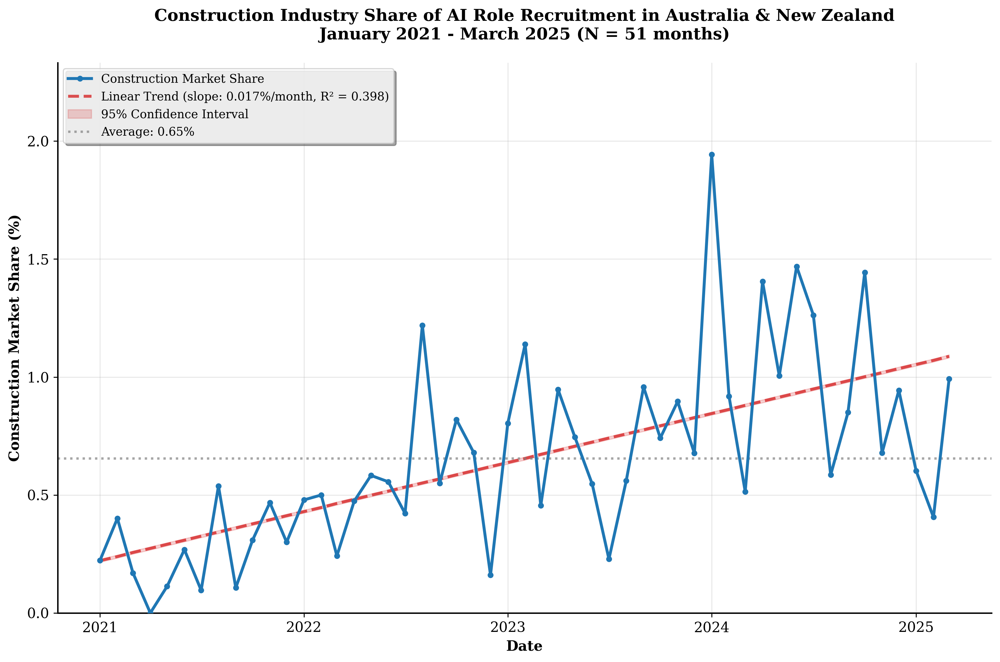

✓ Figure 1 saved as: Figure1_Construction_AI_Market_Share.png

Creating Figure 4: Monthly AI Role Recruitment...


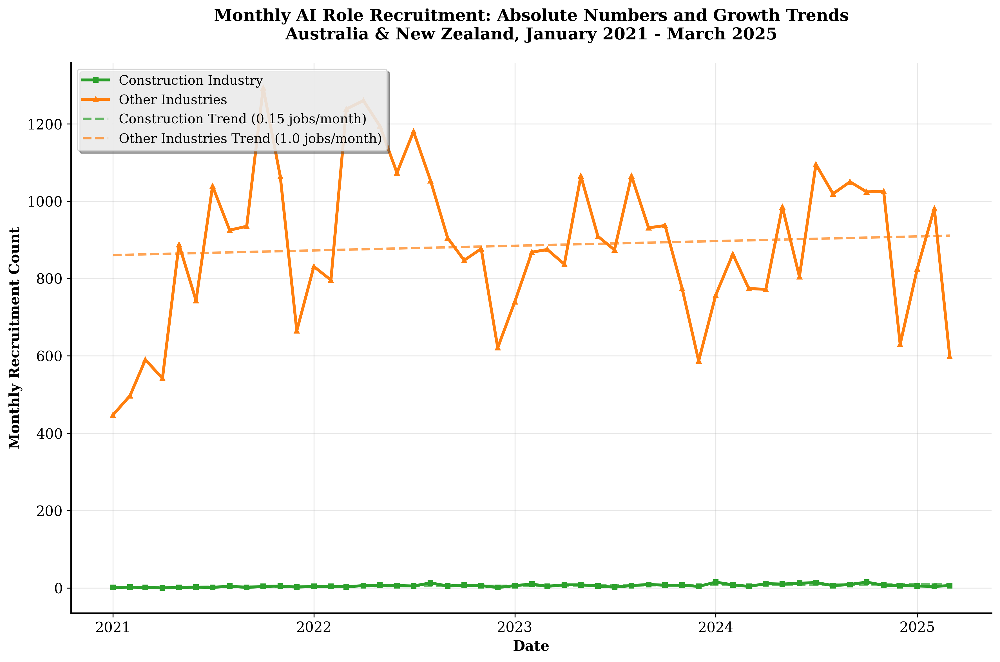

✓ Figure 4 saved as: Figure4_Monthly_AI_Recruitment.png

SUMMARY STATISTICS FOR PAPER
Analysis Period: January 2021 - March 2025
Total Months: 51
Construction AI Recruitments: 300
Other Industries AI Recruitments: 45,169
Construction Market Share: 0.66%
Market Share Trend: 0.017% per month (R² = 0.398, p = 0.0000)
Average Monthly Construction Recruitment: 5.9
Peak Construction Month: January 2024 (15 jobs)
Construction CAGR: 41.2% per year

✓ Both figures created successfully!
Files saved:
- Figure1_Construction_AI_Market_Share.png (now Figure 3)
- Figure4_Monthly_AI_Recruitment.png (now Figure 4)


In [5]:
# Publication-Ready Figures for AI Recruitment Analysis
# Dr. M. Reza Hosseini - University of Melbourne

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from matplotlib.dates import DateFormatter, YearLocator
import warnings
warnings.filterwarnings('ignore')

# Load the processed data
monthly_combined = pd.read_csv('/content/drive/MyDrive/ai_recruitment_monthly_analysis.csv')
monthly_combined['date'] = pd.to_datetime(monthly_combined['date'])

# Calculate statistics for annotations
total_construction = monthly_combined['construction_count'].sum()
total_other = monthly_combined['other_count'].sum()
overall_construction_percentage = (total_construction / (total_construction + total_other)) * 100

# Statistical analysis for trend
x_values = np.arange(len(monthly_combined))
slope, intercept, r_value, p_value, std_err = stats.linregress(x_values, monthly_combined['construction_percentage'])

# Set publication style
plt.style.use('default')
plt.rcParams.update({
    'font.size': 12,
    'font.family': 'serif',
    'axes.linewidth': 1.2,
    'axes.spines.top': False,
    'axes.spines.right': False,
    'axes.grid': True,
    'grid.alpha': 0.3,
    'grid.linewidth': 0.8,
    'legend.frameon': True,
    'legend.fancybox': True,
    'legend.shadow': True,
    'figure.dpi': 300
})

# FIGURE 1: Market Share Analysis
print("Creating Figure 1: Market Share Analysis...")

fig, ax = plt.subplots(1, 1, figsize=(12, 8))

# Main market share line
line1 = ax.plot(monthly_combined['date'], monthly_combined['construction_percentage'],
                marker='o', linewidth=2.5, markersize=4, color='#1f77b4',
                label='Construction Market Share', zorder=3)

# Trend line with confidence interval
x_numeric = np.arange(len(monthly_combined))
trend_line = slope * x_numeric + intercept
ax.plot(monthly_combined['date'], trend_line,
        linestyle='--', color='#d62728', linewidth=2.5, alpha=0.8,
        label=f'Linear Trend (slope: {slope:.3f}%/month, R² = {r_value**2:.3f})', zorder=2)

# Add confidence interval
se_line = std_err * np.sqrt(1 + 1/len(x_numeric) + (x_numeric - np.mean(x_numeric))**2 / np.sum((x_numeric - np.mean(x_numeric))**2))
ax.fill_between(monthly_combined['date'],
                trend_line - 1.96*se_line, trend_line + 1.96*se_line,
                alpha=0.2, color='#d62728', label='95% Confidence Interval', zorder=1)

# Average line
avg_share = monthly_combined['construction_percentage'].mean()
ax.axhline(y=avg_share, color='gray', linestyle=':', alpha=0.7, linewidth=2,
           label=f'Average: {avg_share:.2f}%')

# Formatting
ax.set_title('Construction Industry Share of AI Role Recruitment in Australia & New Zealand\n' +
            f'January 2021 - March 2025 (N = {len(monthly_combined)} months)',
            fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel('Date', fontsize=12, fontweight='bold')
ax.set_ylabel('Construction Market Share (%)', fontsize=12, fontweight='bold')
ax.legend(loc='upper left', fontsize=10)

# Format x-axis
ax.xaxis.set_major_locator(YearLocator())
ax.xaxis.set_major_formatter(DateFormatter('%Y'))

# Set y-axis limits for better visualization
y_min = max(0, monthly_combined['construction_percentage'].min() * 0.8)
y_max = monthly_combined['construction_percentage'].max() * 1.2
ax.set_ylim(y_min, y_max)

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Figure1_Construction_AI_Market_Share.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print("✓ Figure 1 saved as: Figure1_Construction_AI_Market_Share.png")

# FIGURE 4: Monthly AI Role Recruitment Comparison
print("\nCreating Figure 4: Monthly AI Role Recruitment...")

fig, ax = plt.subplots(1, 1, figsize=(12, 8))

# Absolute numbers with growth visualization
ax.plot(monthly_combined['date'], monthly_combined['construction_count'],
        marker='s', linewidth=2.5, markersize=4, color='#2ca02c',
        label='Construction Industry', zorder=3)
ax.plot(monthly_combined['date'], monthly_combined['other_count'],
        marker='^', linewidth=2.5, markersize=4, color='#ff7f0e',
        label='Other Industries', zorder=3)

# Add trend lines for both
x_vals = np.arange(len(monthly_combined))

# Construction trend
const_slope, const_intercept, _, _, _ = stats.linregress(x_vals, monthly_combined['construction_count'])
const_trend = const_slope * x_vals + const_intercept
ax.plot(monthly_combined['date'], const_trend,
        linestyle='--', color='#2ca02c', alpha=0.7, linewidth=2,
        label=f'Construction Trend ({const_slope:.2f} jobs/month)')

# Other industries trend
other_slope, other_intercept, _, _, _ = stats.linregress(x_vals, monthly_combined['other_count'])
other_trend = other_slope * x_vals + other_intercept
ax.plot(monthly_combined['date'], other_trend,
        linestyle='--', color='#ff7f0e', alpha=0.7, linewidth=2,
        label=f'Other Industries Trend ({other_slope:.1f} jobs/month)')

ax.set_title('Monthly AI Role Recruitment: Absolute Numbers and Growth Trends\n' +
            f'Australia & New Zealand, January 2021 - March 2025',
            fontsize=14, fontweight='bold', pad=20)
ax.set_xlabel('Date', fontsize=12, fontweight='bold')
ax.set_ylabel('Monthly Recruitment Count', fontsize=12, fontweight='bold')
ax.legend(loc='upper left', fontsize=11)
ax.xaxis.set_major_locator(YearLocator())
ax.xaxis.set_major_formatter(DateFormatter('%Y'))

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/Figure4_Monthly_AI_Recruitment.png',
            dpi=300, bbox_inches='tight', facecolor='white')
plt.show()

print("✓ Figure 4 saved as: Figure4_Monthly_AI_Recruitment.png")

# Print summary statistics for reference
print("\n" + "="*60)
print("SUMMARY STATISTICS FOR PAPER")
print("="*60)
print(f"Analysis Period: {monthly_combined['date'].min().strftime('%B %Y')} - {monthly_combined['date'].max().strftime('%B %Y')}")
print(f"Total Months: {len(monthly_combined)}")
print(f"Construction AI Recruitments: {total_construction:,.0f}")
print(f"Other Industries AI Recruitments: {total_other:,.0f}")
print(f"Construction Market Share: {overall_construction_percentage:.2f}%")
print(f"Market Share Trend: {slope:.3f}% per month (R² = {r_value**2:.3f}, p = {p_value:.4f})")
print(f"Average Monthly Construction Recruitment: {monthly_combined['construction_count'].mean():.1f}")
print(f"Peak Construction Month: {monthly_combined.loc[monthly_combined['construction_count'].idxmax(), 'date'].strftime('%B %Y')} ({monthly_combined['construction_count'].max():.0f} jobs)")

# Calculate CAGR
years_span = (monthly_combined['date'].iloc[-1] - monthly_combined['date'].iloc[0]).days / 365.25
early_avg = monthly_combined['construction_count'].iloc[:12].mean()
late_avg = monthly_combined['construction_count'].iloc[-12:].mean()
cagr = ((late_avg / early_avg) ** (1/years_span) - 1) * 100
print(f"Construction CAGR: {cagr:.1f}% per year")

print("\n✓ Both figures created successfully!")
print("Files saved:")
print("- Figure1_Construction_AI_Market_Share.png (now Figure 3)")
print("- Figure4_Monthly_AI_Recruitment.png (now Figure 4)")